# INDEX:

## A> PROJECT-NOTES 1
## B> PROJECT-NOTEs 2

# PROJECT-NOTE-1 START:

# PROBLEM STATEMENT: CUSTOMER CHURN
------------------------------------
The E-commerce or DTH company is facing tough competition and finding it challenging to keep its current customers. They want to create a special system to predict when a customer might stop using their services(churn prediction) and offer attractive deals to those customers to encourage them to stay.
It's important to note that one account leaves, multiple customers might be lost. The goal is to create a churn prediction model that can accurately identify accounts that are likely to stop using their services.

Once the model predicts potential churners, the company will design unique and targeted offers to keep those customers from leaving. However, they need to be careful not to offer too many free or heavily discounted deals that could lead to financial losses for the company.

----------------------------------------------------------------------

### Importing python library files

In [58]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import KMeans
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from scipy.stats import zscore
import scipy.cluster.hierarchy as shc
from sklearn.metrics import silhouette_score,silhouette_samples
import statsmodels.api as sm
from scipy import stats

In [59]:
import warnings
warnings.filterwarnings('ignore')

### Reading and Checking of datasets

In [61]:
cc_df = pd.read_excel("Customer Churn Data.xlsx", sheet_name = "Data for DSBA")

In [62]:
cc_df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [63]:
cc_df.tail()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
11255,31255,0,10,1.0,34.0,Credit Card,Male,3.0,2,Super,1.0,Married,9,0.0,19,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,Male,3.0,5,HNI,5.0,Married,7,0.0,16,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,Male,3.0,2,Super,4.0,Married,7,1.0,22,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,Male,4.0,5,Super,4.0,Married,7,0.0,16,2,9,179.9,Computer
11259,31259,0,8,1.0,22.0,Credit Card,Male,3.0,2,Super,3.0,Married,5,0.0,13,2,3,175.04,Mobile


### Shape, Datatypes, Description and value counts of variables

In [65]:
shape = cc_df.shape
print("The shape of the given dataset is :",shape)

The shape of the given dataset is : (11260, 19)


In [66]:
cc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

In [67]:
cc_df.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,11260.0,25629.500000,3250.626350,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,0.168384,0.374223,0.0,0.00,0.0,0.00,1.0
City_Tier,11148.0,1.653929,0.915015,1.0,1.00,1.0,3.00,3.0
CC_Contacted_LY,11158.0,17.867091,8.853269,4.0,11.00,16.0,23.00,132.0
Service_Score,11162.0,2.902526,0.725584,0.0,2.00,3.0,3.00,5.0
CC_Agent_Score,11144.0,3.066493,1.379772,1.0,2.00,3.0,4.00,5.0
Complain_ly,10903.0,0.285334,0.451594,0.0,0.00,0.0,1.00,1.0


In [68]:
for column in cc_df.columns: 
    value_counts = cc_df[column].value_counts(dropna=False) 
    print(f"Column: {column}") 
    print(value_counts) 
    print("\n")

Column: AccountID
AccountID
20000    1
27510    1
27502    1
27503    1
27504    1
        ..
23754    1
23755    1
23756    1
23757    1
31259    1
Name: count, Length: 11260, dtype: int64


Column: Churn
Churn
0    9364
1    1896
Name: count, dtype: int64


Column: Tenure
Tenure
1      1351
0      1231
8       519
9       496
7       450
10      423
3       410
5       403
4       403
11      388
6       363
12      360
13      359
2       354
14      345
15      311
16      291
19      273
18      253
20      217
17      215
21      170
23      169
22      151
24      147
28      137
30      137
99      131
27      131
26      122
#       116
25      114
29      114
NaN     102
31       96
50        2
60        2
51        2
61        2
Name: count, dtype: int64


Column: City_Tier
City_Tier
1.0    7263
3.0    3405
2.0     480
NaN     112
Name: count, dtype: int64


Column: CC_Contacted_LY
CC_Contacted_LY
14.0     682
16.0     663
9.0      655
13.0     655
15.0     623
12.0     571


As, Observed from above it seems that some of the variables are integer or float type but still seens as object data type.
There are also some missing values present in the dataset.

### Checking for unique values

In [71]:
cc_df.nunique()

AccountID                  11260
Churn                          2
Tenure                        38
City_Tier                      3
CC_Contacted_LY               44
Payment                        5
Gender                         4
Service_Score                  6
Account_user_count             7
account_segment                7
CC_Agent_Score                 5
Marital_Status                 3
rev_per_month                 59
Complain_ly                    2
rev_growth_yoy                20
coupon_used_for_payment       20
Day_Since_CC_connect          24
cashback                    5693
Login_device                   3
dtype: int64

In [72]:
for column in cc_df.columns:
    unique_values = cc_df[column].unique()
    print("-"*40)
    print(f"Unique value for {column} is : ", unique_values)

----------------------------------------
Unique value for AccountID is :  [20000 20001 20002 ... 31257 31258 31259]
----------------------------------------
Unique value for Churn is :  [1 0]
----------------------------------------
Unique value for Tenure is :  [4 0 2 13 11 '#' 9 99 19 20 14 8 26 18 5 30 7 1 23 3 29 6 28 24 25 16 10
 15 22 nan 27 12 21 17 50 60 31 51 61]
----------------------------------------
Unique value for City_Tier is :  [ 3.  1. nan  2.]
----------------------------------------
Unique value for CC_Contacted_LY is :  [  6.   8.  30.  15.  12.  22.  11.   9.  31.  18.  13.  20.  29.  28.
  26.  14.  10.  25.  27.  17.  23.  33.  19.  35.  24.  16.  32.  21.
  nan  34.   5.   4. 126.   7.  36. 127.  42.  38.  37.  39.  40.  41.
 132.  43. 129.]
----------------------------------------
Unique value for Payment is :  ['Debit Card' 'UPI' 'Credit Card' 'Cash on Delivery' 'E wallet' nan]
----------------------------------------
Unique value for Gender is :  ['Female' '

We can see from the above that there are lot of bad values that needed to be fixed in some variables. We will fix them one by one.

-> AccountID Variable

In [75]:
cc_df.AccountID.unique()

array([20000, 20001, 20002, ..., 31257, 31258, 31259], dtype=int64)

In [76]:
# Create a mask to identify non-numeric values 
mask = pd.to_numeric(cc_df['AccountID'], errors='coerce').isna() 
# Filter the DataFrame based on the mask 
non_numeric_values = cc_df.loc[mask, 'AccountID'].unique() 
print("Non-numeric values in the 'AccountID' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'AccountID' column are as below:
[]


-> Churn Variable

In [78]:
cc_df.Churn.unique()

array([1, 0], dtype=int64)

In [79]:
mask = pd.to_numeric(cc_df['Churn'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Churn'].unique() 
print("Non-numeric values in the 'Churn' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Churn' column are as below:
[]


-> Tenure Variable

In [81]:
cc_df.Tenure.unique()

array([4, 0, 2, 13, 11, '#', 9, 99, 19, 20, 14, 8, 26, 18, 5, 30, 7, 1,
       23, 3, 29, 6, 28, 24, 25, 16, 10, 15, 22, nan, 27, 12, 21, 17, 50,
       60, 31, 51, 61], dtype=object)

In [82]:
mask = pd.to_numeric(cc_df['Tenure'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Tenure'].unique() 
print("Non-numeric values in the 'Tenure' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Tenure' column are as below:
['#' nan]


In [83]:
cc_df.Tenure = cc_df.Tenure.replace('#', np.NaN)

In [84]:
cc_df.Tenure.unique()

array([ 4.,  0.,  2., 13., 11., nan,  9., 99., 19., 20., 14.,  8., 26.,
       18.,  5., 30.,  7.,  1., 23.,  3., 29.,  6., 28., 24., 25., 16.,
       10., 15., 22., 27., 12., 21., 17., 50., 60., 31., 51., 61.])

In [85]:
mask = pd.to_numeric(cc_df['Tenure'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Tenure'].unique() 
print("Non-numeric values in the 'Tenure' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Tenure' column are as below:
[nan]


-> City_Tier Variable

In [87]:
cc_df.City_Tier.unique()

array([ 3.,  1., nan,  2.])

In [88]:
mask = pd.to_numeric(cc_df['City_Tier'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'City_Tier'].unique() 
print("Non-numeric values in the 'City_Tier' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'City_Tier' column are as below:
[nan]


-> CC_Contacted_LY Variable

In [90]:
cc_df.CC_Contacted_LY.unique()

array([  6.,   8.,  30.,  15.,  12.,  22.,  11.,   9.,  31.,  18.,  13.,
        20.,  29.,  28.,  26.,  14.,  10.,  25.,  27.,  17.,  23.,  33.,
        19.,  35.,  24.,  16.,  32.,  21.,  nan,  34.,   5.,   4., 126.,
         7.,  36., 127.,  42.,  38.,  37.,  39.,  40.,  41., 132.,  43.,
       129.])

In [91]:
mask = pd.to_numeric(cc_df['CC_Contacted_LY'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'CC_Contacted_LY'].unique() 
print("Non-numeric values in the 'CC_Contacted_LY' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'CC_Contacted_LY' column are as below:
[nan]


->Payment Variable

In [93]:
cc_df.Payment.unique()

array(['Debit Card', 'UPI', 'Credit Card', 'Cash on Delivery', 'E wallet',
       nan], dtype=object)

-> Gender Variable

In [95]:
cc_df.Gender.unique()

array(['Female', 'Male', 'F', nan, 'M'], dtype=object)

In [96]:
cc_df.Gender = cc_df.Gender.replace("F", "Female")
cc_df.Gender = cc_df.Gender.replace("M", "Male")

In [97]:
cc_df.Gender.unique()

array(['Female', 'Male', nan], dtype=object)

-> Service_Score Variable

In [99]:
cc_df.Service_Score.unique()

array([ 3.,  2.,  1., nan,  0.,  4.,  5.])

In [100]:
mask = pd.to_numeric(cc_df['Service_Score'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Service_Score'].unique() 
print("Non-numeric values in the 'Service_Score' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Service_Score' column are as below:
[nan]


-> Account_user_count Variable

In [102]:
cc_df.Account_user_count.unique()

array([3, 4, nan, 5, 2, '@', 1, 6], dtype=object)

In [103]:
mask = pd.to_numeric(cc_df['Account_user_count'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Account_user_count'].unique() 
print("Non-numeric values in the 'Account_user_count' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Account_user_count' column are as below:
[nan '@']


In [104]:
cc_df.Account_user_count = cc_df.Account_user_count.replace('@', np.NaN)

In [105]:
cc_df.Account_user_count.unique()

array([ 3.,  4., nan,  5.,  2.,  1.,  6.])

In [106]:
mask = pd.to_numeric(cc_df['Account_user_count'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Account_user_count'].unique() 
print("Non-numeric values in the 'Account_user_count' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Account_user_count' column are as below:
[nan]


-> account_segment Variable

In [108]:
cc_df.account_segment.unique()

array(['Super', 'Regular Plus', 'Regular', 'HNI', 'Regular +', nan,
       'Super Plus', 'Super +'], dtype=object)

In [109]:
cc_df.account_segment = cc_df.account_segment.replace("Regular +", "Regular Plus")
cc_df.account_segment = cc_df.account_segment.replace("Super +", "Super Plus")

In [110]:
cc_df.account_segment.unique()

array(['Super', 'Regular Plus', 'Regular', 'HNI', nan, 'Super Plus'],
      dtype=object)

-> CC_Agent_Score Variable

In [112]:
cc_df.CC_Agent_Score.unique()

array([ 2.,  3.,  5.,  4., nan,  1.])

In [113]:
mask = pd.to_numeric(cc_df['CC_Agent_Score'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'CC_Agent_Score'].unique() 
print("Non-numeric values in the 'CC_Agent_Score' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'CC_Agent_Score' column are as below:
[nan]


-> Marital_Status Variable

In [115]:
cc_df.Marital_Status.unique()

array(['Single', 'Divorced', 'Married', nan], dtype=object)

-> rev_per_month Variable

In [117]:
cc_df.rev_per_month.unique()

array([9, 7, 6, 8, 3, 2, 4, 10, 1, 5, '+', 130, nan, 19, 139, 102, 120,
       138, 127, 123, 124, 116, 21, 126, 134, 113, 114, 108, 140, 133,
       129, 107, 118, 11, 105, 20, 119, 121, 137, 110, 22, 101, 136, 125,
       14, 13, 12, 115, 23, 122, 117, 131, 104, 15, 25, 135, 111, 109,
       100, 103], dtype=object)

In [118]:
mask = pd.to_numeric(cc_df['rev_per_month'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'rev_per_month'].unique() 
print("Non-numeric values in the 'rev_per_month' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'rev_per_month' column are as below:
['+' nan]


In [119]:
cc_df.rev_per_month = cc_df.rev_per_month.replace('+', np.NaN)

In [120]:
cc_df.rev_per_month.unique()

array([  9.,   7.,   6.,   8.,   3.,   2.,   4.,  10.,   1.,   5.,  nan,
       130.,  19., 139., 102., 120., 138., 127., 123., 124., 116.,  21.,
       126., 134., 113., 114., 108., 140., 133., 129., 107., 118.,  11.,
       105.,  20., 119., 121., 137., 110.,  22., 101., 136., 125.,  14.,
        13.,  12., 115.,  23., 122., 117., 131., 104.,  15.,  25., 135.,
       111., 109., 100., 103.])

In [121]:
mask = pd.to_numeric(cc_df['rev_per_month'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'rev_per_month'].unique() 
print("Non-numeric values in the 'rev_per_month' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'rev_per_month' column are as below:
[nan]


-> Complain_ly Variable

In [123]:
cc_df.Complain_ly.unique()

array([ 1.,  0., nan])

In [124]:
mask = pd.to_numeric(cc_df['Complain_ly'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Complain_ly'].unique() 
print("Non-numeric values in the 'Complain_ly' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Complain_ly' column are as below:
[nan]


-> rev_growth_yoy Variable

In [126]:
cc_df.rev_growth_yoy.unique()

array([11, 15, 14, 23, 22, 16, 12, 13, 17, 18, 24, 19, 20, 21, 25, 26,
       '$', 4, 27, 28], dtype=object)

In [127]:
mask = pd.to_numeric(cc_df['rev_growth_yoy'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'rev_growth_yoy'].unique() 
print("Non-numeric values in the 'rev_growth_yoy' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'rev_growth_yoy' column are as below:
['$']


In [128]:
cc_df.rev_growth_yoy = cc_df.rev_growth_yoy.replace('$', np.NaN)

In [129]:
cc_df.rev_growth_yoy.unique()

array([11., 15., 14., 23., 22., 16., 12., 13., 17., 18., 24., 19., 20.,
       21., 25., 26., nan,  4., 27., 28.])

In [130]:
mask = pd.to_numeric(cc_df['rev_growth_yoy'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'rev_growth_yoy'].unique() 
print("Non-numeric values in the 'rev_growth_yoy' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'rev_growth_yoy' column are as below:
[nan]


-> coupon_used_for_payment Variable

In [132]:
cc_df.coupon_used_for_payment.unique()

array([1, 0, 4, 2, 9, 6, 11, 7, 12, 10, 5, 3, 13, 15, 8, '#', '$', 14,
       '*', 16], dtype=object)

In [133]:
mask = pd.to_numeric(cc_df['coupon_used_for_payment'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'coupon_used_for_payment'].unique() 
print("Non-numeric values in the 'coupon_used_for_payment' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'coupon_used_for_payment' column are as below:
['#' '$' '*']


In [134]:
cc_df.coupon_used_for_payment = cc_df.coupon_used_for_payment.replace(['+','$','*','#'], np.NaN)

In [135]:
cc_df.coupon_used_for_payment.unique()

array([ 1.,  0.,  4.,  2.,  9.,  6., 11.,  7., 12., 10.,  5.,  3., 13.,
       15.,  8., nan, 14., 16.])

In [136]:
mask = pd.to_numeric(cc_df['coupon_used_for_payment'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'coupon_used_for_payment'].unique() 
print("Non-numeric values in the 'coupon_used_for_payment' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'coupon_used_for_payment' column are as below:
[nan]


-> Day_Since_CC_connect Varibale

In [138]:
cc_df.Day_Since_CC_connect.unique()

array([5, 0, 3, 7, 2, 1, 8, 6, 4, 15, nan, 11, 10, 9, 13, 12, 17, 16, 14,
       30, '$', 46, 18, 31, 47], dtype=object)

In [139]:
mask = pd.to_numeric(cc_df['Day_Since_CC_connect'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Day_Since_CC_connect'].unique() 
print("Non-numeric values in the 'Day_Since_CC_connect' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Day_Since_CC_connect' column are as below:
[nan '$']


In [140]:
cc_df.Day_Since_CC_connect = cc_df.Day_Since_CC_connect.replace('$', np.NaN)

In [141]:
cc_df.Day_Since_CC_connect.unique()

array([ 5.,  0.,  3.,  7.,  2.,  1.,  8.,  6.,  4., 15., nan, 11., 10.,
        9., 13., 12., 17., 16., 14., 30., 46., 18., 31., 47.])

In [142]:
mask = pd.to_numeric(cc_df['Day_Since_CC_connect'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Day_Since_CC_connect'].unique() 
print("Non-numeric values in the 'Day_Since_CC_connect' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Day_Since_CC_connect' column are as below:
[nan]


-> Cashback Variable

In [144]:
cc_df.cashback.unique()

array([159.93, 120.9, nan, ..., 227.36, 226.91, 191.42], dtype=object)

In [145]:
mask = pd.to_numeric(cc_df['cashback'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'cashback'].unique() 
print("Non-numeric values in the 'cashback' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'cashback' column are as below:
[nan '$']


In [146]:
cc_df.cashback = cc_df.cashback.replace('$', np.NaN)

In [147]:
cc_df.cashback.unique()

array([159.93, 120.9 ,    nan, ..., 227.36, 226.91, 191.42])

In [148]:
mask = pd.to_numeric(cc_df['cashback'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'cashback'].unique() 
print("Non-numeric values in the 'cashback' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'cashback' column are as below:
[nan]


-> Login_device Variable

In [150]:
cc_df.Login_device.unique()

array(['Mobile', 'Computer', '&&&&', nan], dtype=object)

In [151]:
mask = pd.to_numeric(cc_df['Login_device'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Login_device'].unique() 
print("Non-numeric values in the 'Login_device' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Login_device' column are as below:
['Mobile' 'Computer' '&&&&' nan]


In [152]:
cc_df.Login_device = cc_df.Login_device.replace('&&&&', np.NaN)

In [153]:
cc_df.Login_device.unique()

array(['Mobile', 'Computer', nan], dtype=object)

In [154]:
mask = pd.to_numeric(cc_df['Login_device'], errors='coerce').isna() 
non_numeric_values = cc_df.loc[mask, 'Login_device'].unique() 
print("Non-numeric values in the 'Login_device' column are as below:") 
print(non_numeric_values)

Non-numeric values in the 'Login_device' column are as below:
['Mobile' 'Computer' nan]


Now, we have replaced the bad values with Empty/Null values we will take care of those null values in the below few codes

### Checking for duplicates and Null/Empty values

In [157]:
duplicates = cc_df.duplicated().sum()
print("The number of duplicate rows in the dataset are :", duplicates)

The number of duplicate rows in the dataset are : 0


In [158]:
cc_df.isnull().sum()

AccountID                    0
Churn                        0
Tenure                     218
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         444
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              791
Complain_ly                357
rev_growth_yoy               3
coupon_used_for_payment      3
Day_Since_CC_connect       358
cashback                   473
Login_device               760
dtype: int64

Since there are no duplicated values and null present  in AccountID we can drop that variable.

In [160]:
cc_df.drop(columns=['AccountID'], axis=1, inplace=True)

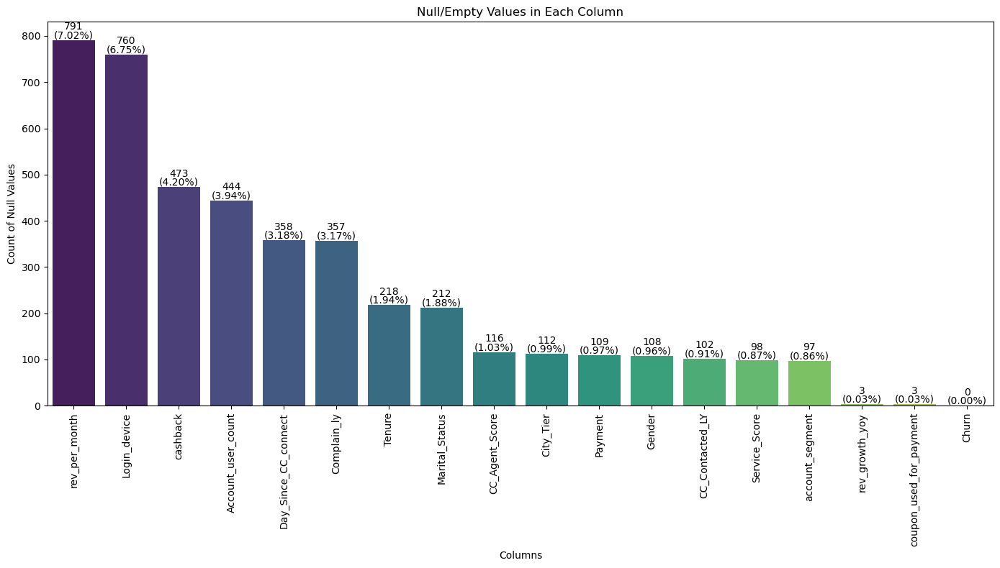

In [161]:
# Calculate the number and percentage of null values in each column
null_counts = cc_df.isnull().sum()
total_counts = len(cc_df)
null_percentage = (null_counts / total_counts) * 100

# Combine the counts and percentages into a DataFrame and sort by null count in descending order
null_df = pd.DataFrame({'Null Count': null_counts, 'Percentage': null_percentage})
null_df = null_df.sort_values(by='Null Count', ascending=False)

# Plot the countplot with sorted values
plt.figure(figsize=(14, 8))
ax = sns.barplot(x=null_df.index, y=null_df['Null Count'], palette="viridis")

# Add both null count and percentage on top of the bars
for i in range(len(null_df)):
    count = null_df['Null Count'].iloc[i]
    percentage = null_df['Percentage'].iloc[i]
    # Display null count above percentage
    ax.text(i, count + 18, f"{count}", ha='center', va='bottom')  # Null count above
    ax.text(i, count + 21, f"({percentage:.2f}%)", ha='center', va='top')  # Percentage below null count

# Rotate the x-axis labels
plt.xticks(rotation=90)
plt.title('Null/Empty Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Count of Null Values')

# Show the plot
plt.tight_layout()
plt.show()


Maximum % nulls in a column is 7%. 
Columns will not be dropped due to presence of nulls. 
It is still under 30%. So nulls will be treated as opposed to considering dropping any column.s.

### Imputing Null/Empty Values

Before, choosing which method to use for imputing the null values in dataset we will see the skewness for each columns.

In [165]:
df_numerical = cc_df[['Tenure','CC_Contacted_LY','rev_per_month','CC_Agent_Score','Service_Score','Complain_ly','Account_user_count','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']]
df_categorical = cc_df[['Churn','City_Tier','Payment','Gender','account_segment','Marital_Status','Login_device']]
df_cc = pd.concat([df_numerical, df_categorical], axis=1)

In [166]:
df_cc.head()

,Tenure,CC_Contacted_LY,rev_per_month,CC_Agent_Score,Service_Score,Complain_ly,Account_user_count,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Churn,City_Tier,Payment,Gender,account_segment,Marital_Status,Login_device
0,4.0,6.0,9.0,2.0,3.0,1.0,3.0,11.0,1.0,5.0,159.93,1,3.0,Debit Card,Female,Super,Single,Mobile
1,0.0,8.0,7.0,3.0,3.0,1.0,4.0,15.0,0.0,0.0,120.90,1,1.0,UPI,Male,Regular Plus,Single,Mobile
2,0.0,30.0,6.0,3.0,2.0,1.0,4.0,14.0,0.0,3.0,NaN,1,1.0,Debit Card,Male,Regular Plus,Single,Mobile
3,0.0,15.0,8.0,5.0,2.0,0.0,4.0,23.0,0.0,3.0,134.07,1,3.0,Debit Card,Male,Super,Single,Mobile
4,0.0,12.0,3.0,5.0,2.0,0.0,3.0,11.0,1.0,3.0,129.60,1,1.0,Credit Card,Male,Regular Plus,Single,Mobile


In [167]:
# Calculate kurtosis and skewness for numerical columns

kurtosis_skewness = pd.DataFrame(data=[df_numerical.kurtosis(), df_numerical.skew()], index=['Kurtosis', 'Skewness']).T.round(2)

print("Kurtosis and skewness of dataset is as below")
print(kurtosis_skewness)

Kurtosis and skewness of dataset is as below
                         Kurtosis  Skewness
Tenure                      23.37      3.90
CC_Contacted_LY              8.23      1.42
rev_per_month               86.96      9.09
CC_Agent_Score              -1.12     -0.14
Service_Score               -0.67      0.00
Complain_ly                 -1.10      0.95
Account_user_count           0.59     -0.39
rev_growth_yoy              -0.22      0.75
coupon_used_for_payment      9.10      2.58
Day_Since_CC_connect         5.33      1.27
cashback                    81.11      8.77


From the above it can be observed and concluded that there are some skewness present in the data set and so for numerical variables we will fill them with Median while the categorical variables will be filled with Mode.

Skewness = 0: The data is perfectly symmetrical.

Skewness > 0: The data is positively skewed (right-skewed).

Skewness < 0: The data is negatively skewed (left-skewed).

In [169]:
df_cc.head()

,Tenure,CC_Contacted_LY,rev_per_month,CC_Agent_Score,Service_Score,Complain_ly,Account_user_count,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Churn,City_Tier,Payment,Gender,account_segment,Marital_Status,Login_device
0,4.0,6.0,9.0,2.0,3.0,1.0,3.0,11.0,1.0,5.0,159.93,1,3.0,Debit Card,Female,Super,Single,Mobile
1,0.0,8.0,7.0,3.0,3.0,1.0,4.0,15.0,0.0,0.0,120.90,1,1.0,UPI,Male,Regular Plus,Single,Mobile
2,0.0,30.0,6.0,3.0,2.0,1.0,4.0,14.0,0.0,3.0,NaN,1,1.0,Debit Card,Male,Regular Plus,Single,Mobile
3,0.0,15.0,8.0,5.0,2.0,0.0,4.0,23.0,0.0,3.0,134.07,1,3.0,Debit Card,Male,Super,Single,Mobile
4,0.0,12.0,3.0,5.0,2.0,0.0,3.0,11.0,1.0,3.0,129.60,1,1.0,Credit Card,Male,Regular Plus,Single,Mobile


Now, from the above observation about the variable types we can say that few of the variables that are integer or float type are infact categorical variables like City_tier,Service_score etc. 

Due to this we will impute those variables as categorical variable.

In [171]:
# Impute numerical columns with the median
for col in df_numerical.columns:
    median = df_cc[col].median()
    df_cc[col].fillna(median, inplace=True)

# Impute categorical columns with the mode
for col in df_categorical.columns:
    mode = df_cc[col].mode()[0]
    df_cc[col].fillna(mode, inplace=True)

In [172]:
df_cc.isnull().sum()

Tenure                     0
CC_Contacted_LY            0
rev_per_month              0
CC_Agent_Score             0
Service_Score              0
Complain_ly                0
Account_user_count         0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Churn                      0
City_Tier                  0
Payment                    0
Gender                     0
account_segment            0
Marital_Status             0
Login_device               0
dtype: int64

In [173]:
df_cc.describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,11260.0,10.985879,12.757534,0.0,2.00,9.00,16.00,99.0
CC_Contacted_LY,11260.0,17.850178,8.814851,4.0,11.00,16.00,23.00,132.0
rev_per_month,11260.0,6.266874,11.488990,1.0,3.00,5.00,7.00,140.0
CC_Agent_Score,11260.0,3.065808,1.372663,1.0,2.00,3.00,4.00,5.0
Service_Score,11260.0,2.903375,0.722476,0.0,2.00,3.00,3.00,5.0
Complain_ly,11260.0,0.276288,0.447181,0.0,0.00,0.00,1.00,1.0
Account_user_count,11260.0,3.704973,1.004383,1.0,3.00,4.00,4.00,6.0
rev_growth_yoy,11260.0,16.193073,3.757271,4.0,13.00,15.00,19.00,28.0
coupon_used_for_payment,11260.0,1.790409,1.969331,0.0,1.00,1.00,2.00,16.0
Day_Since_CC_connect,11260.0,4.581261,3.649643,0.0,2.00,3.00,7.00,47.0


In [174]:
for column in df_cc.columns:
    count_values = df_cc[column].value_counts()
    print(f"Count values for {column} is:\n{count_values}")
    print("-----------------------------------------------------")

Count values for Tenure is:
Tenure
1.0     1351
0.0     1231
9.0      714
8.0      519
7.0      450
10.0     423
3.0      410
5.0      403
4.0      403
11.0     388
6.0      363
12.0     360
13.0     359
2.0      354
14.0     345
15.0     311
16.0     291
19.0     273
18.0     253
20.0     217
17.0     215
21.0     170
23.0     169
22.0     151
24.0     147
30.0     137
28.0     137
99.0     131
27.0     131
26.0     122
25.0     114
29.0     114
31.0      96
50.0       2
60.0       2
51.0       2
61.0       2
Name: count, dtype: int64
-----------------------------------------------------
Count values for CC_Contacted_LY is:
CC_Contacted_LY
16.0     765
14.0     682
9.0      655
13.0     655
15.0     623
12.0     571
8.0      538
17.0     525
11.0     524
10.0     489
7.0      391
18.0     374
19.0     364
20.0     319
6.0      311
21.0     310
22.0     282
23.0     241
24.0     214
25.0     197
32.0     192
29.0     181
28.0     178
34.0     178
30.0     175
27.0     174
26.0     169



We can also observe that that due to skewness the dataset might be baised towards one value in the variable for that SMOT analysis may be used. For now let's focus on EDA.


We will perform outlier treatment on numerical contineous variables first.
### Outlier Treatment
Now, that our dataset has been cleared we will do outlier treatment if required. 

But, first will will divide numerical and categorical variables seperately and then perform the Oulier treatment and also do EDA.

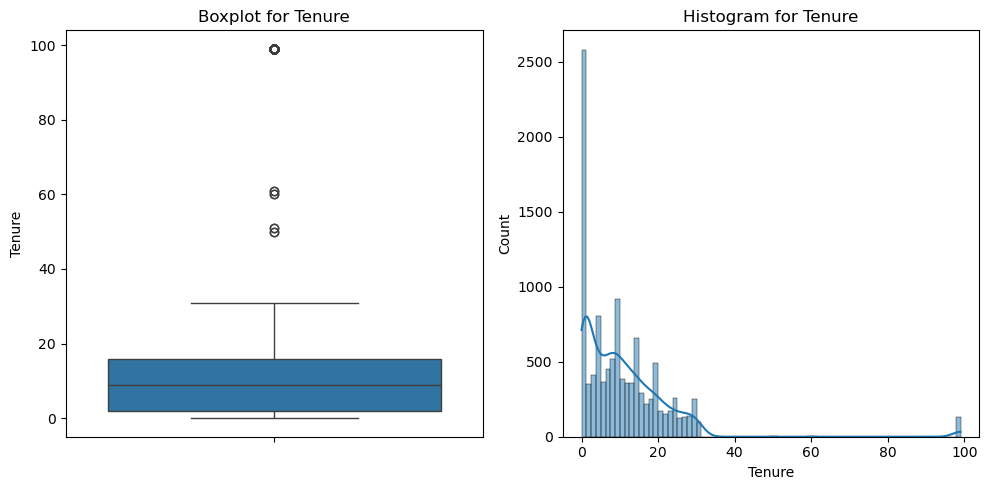

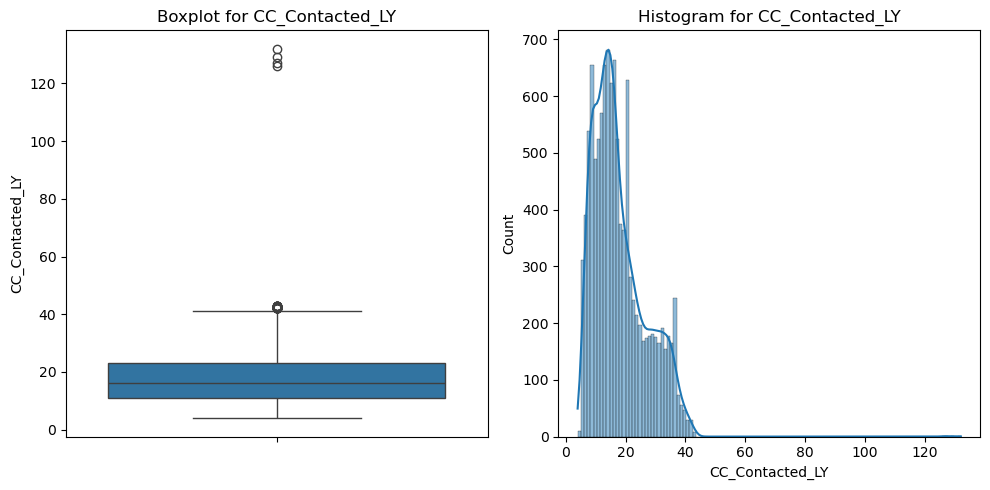

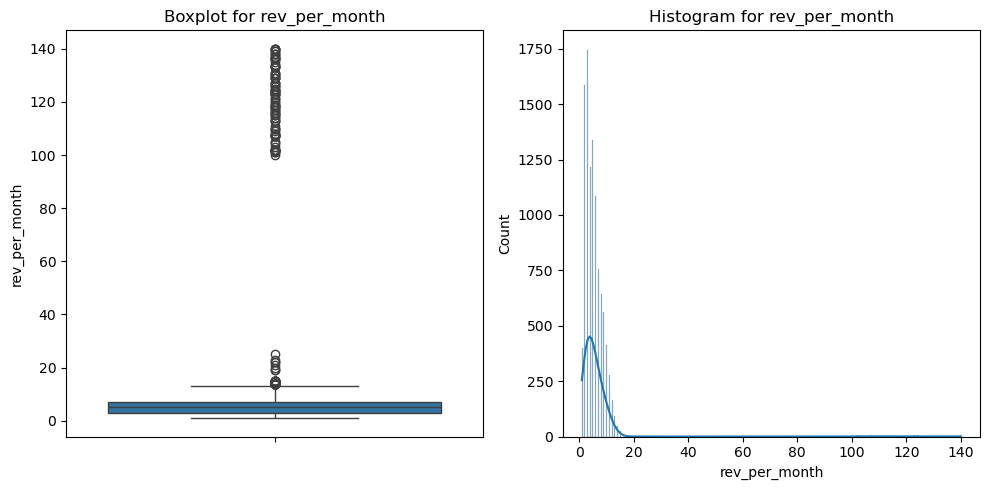

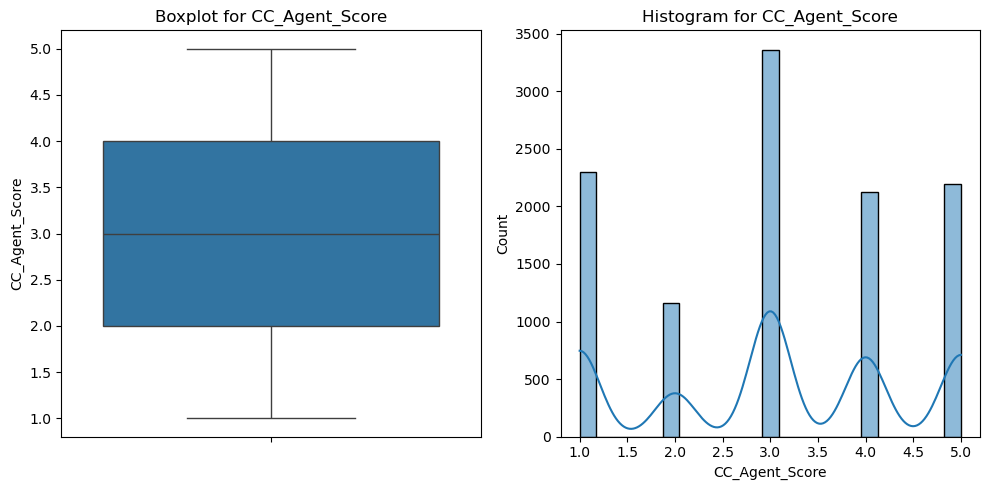

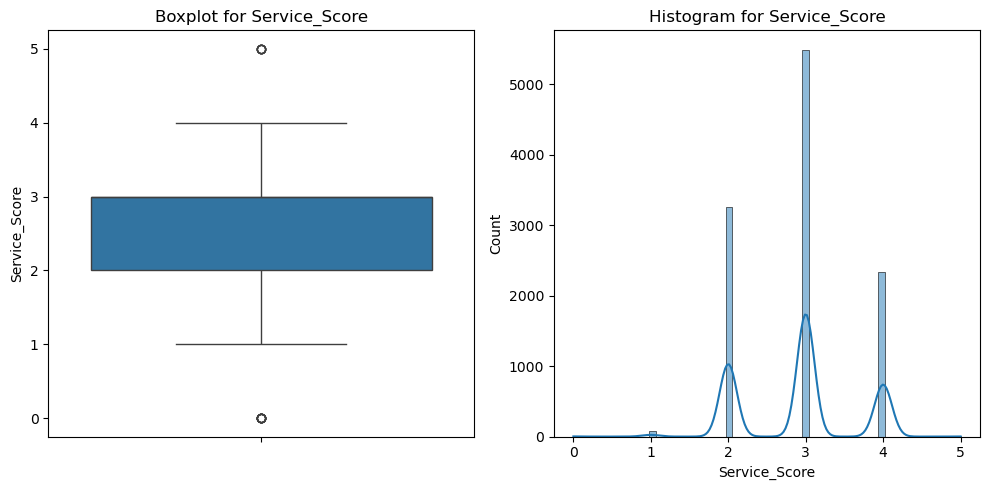

...

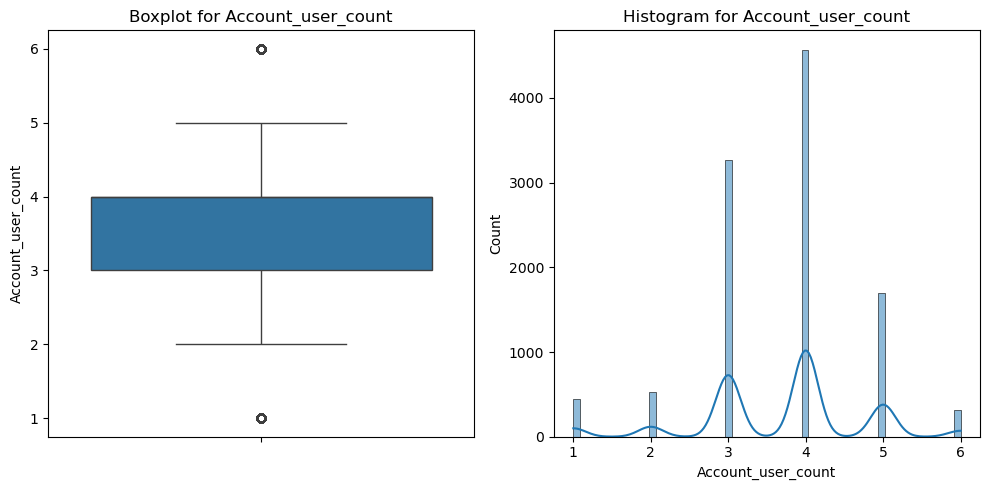

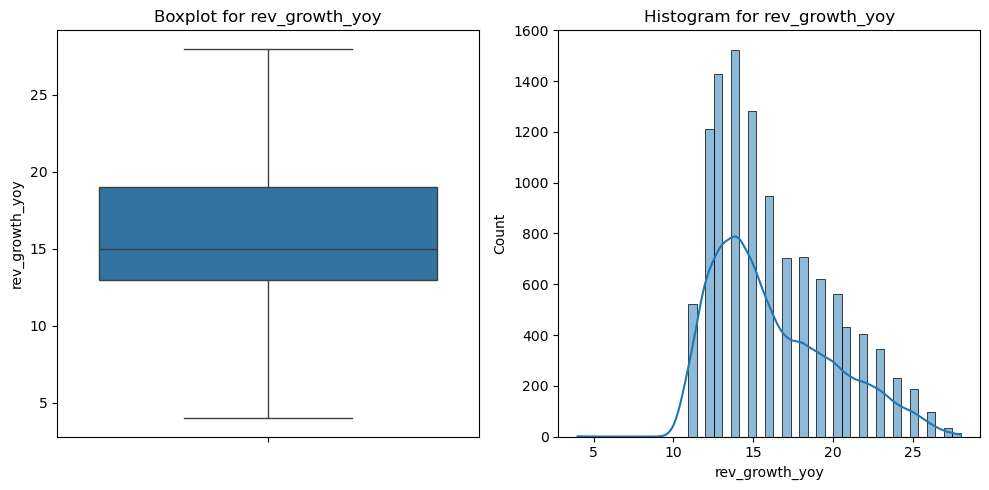

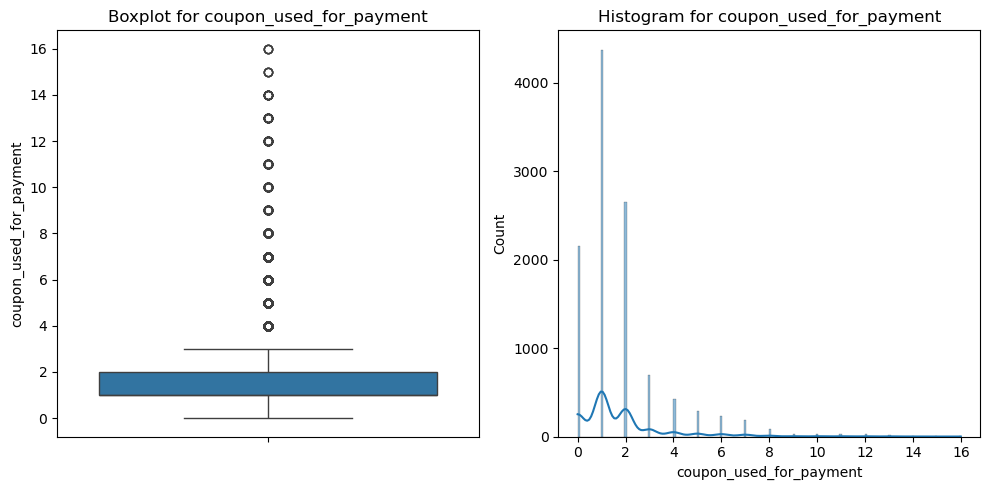

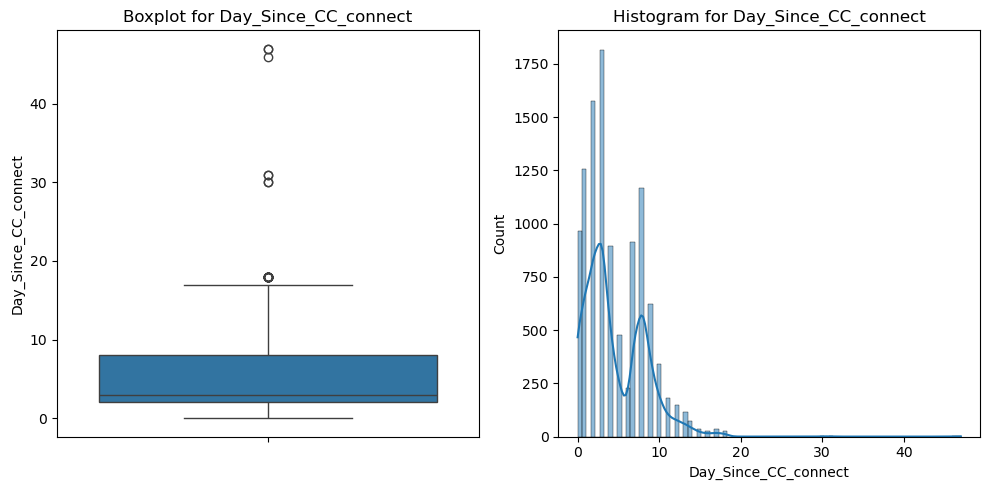

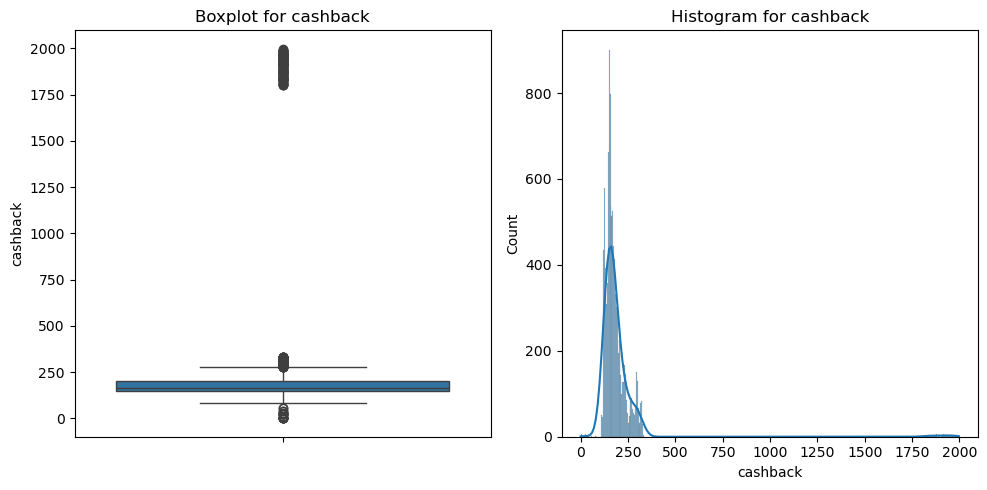

In [177]:
list_columns = df_numerical.columns
for i in range(len(list_columns)):
    plt.figure(figsize=(10, 5))  # Set the figure size for better visibility
    plt.subplot(1, 2, 1)  # Define the first subplot for the boxplot
    plt.title('Boxplot for {}'.format(list_columns[i]))
    sns.boxplot(y=df_numerical[list_columns[i]])  # Use 'y' to specify the vertical boxplot

    plt.subplot(1, 2, 2)  # Define the second subplot for the histogram
    plt.title('Histogram for {}'.format(list_columns[i]))
    sns.histplot(df_numerical[list_columns[i]], kde=True)  # Added KDE (Kernel Density Estimate) for smoothness

    # Save the combined plots as one image 
   # plt.savefig('Boxplot_Histogram_{}.png'.format(list_columns[i]), bbox_inches='tight')
    
    plt.tight_layout()  # Adjust subplots to fit into the figure area.
    plt.show()# Display the plots

In [178]:
for column in df_numerical.select_dtypes(include=np.number).columns:
    
    q1 = df_numerical[column].quantile(0.25)
    q3 = df_numerical[column].quantile(0.75)
    IQR = q3 - q1
    
    uplim = q3 + (1.5 * IQR)
    lowlim = q1 - (1.5 * IQR)
    
    df_numerical[column] = np.where(df_numerical[column] < lowlim, lowlim, df_numerical[column])
    df_numerical[column] = np.where(df_numerical[column] > uplim, uplim, df_numerical[column])

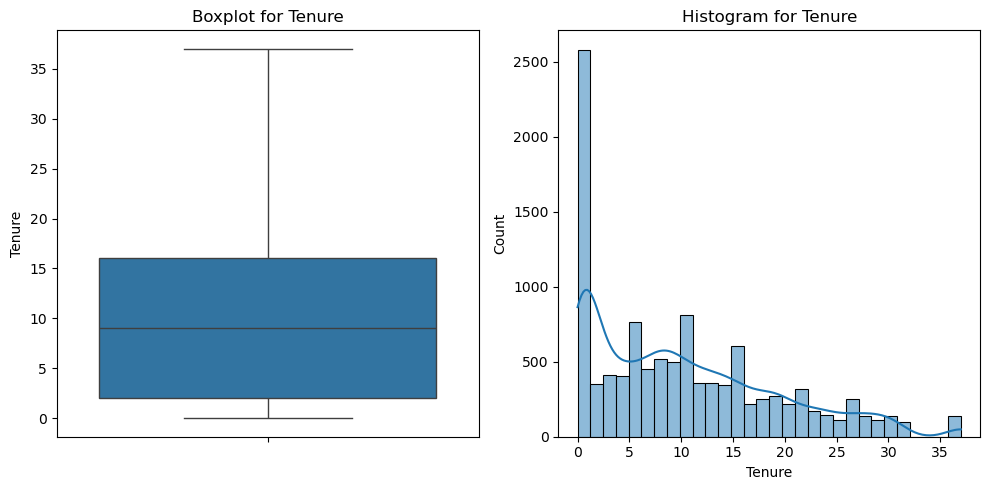

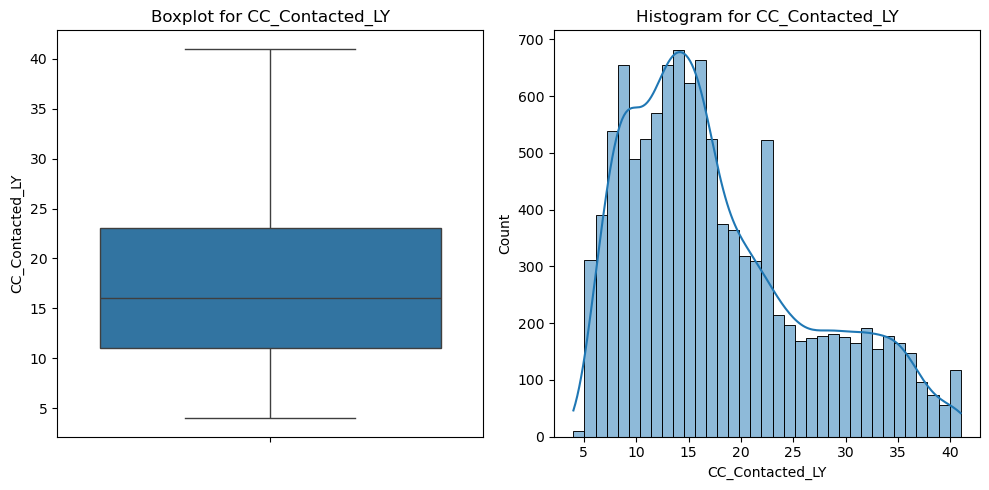

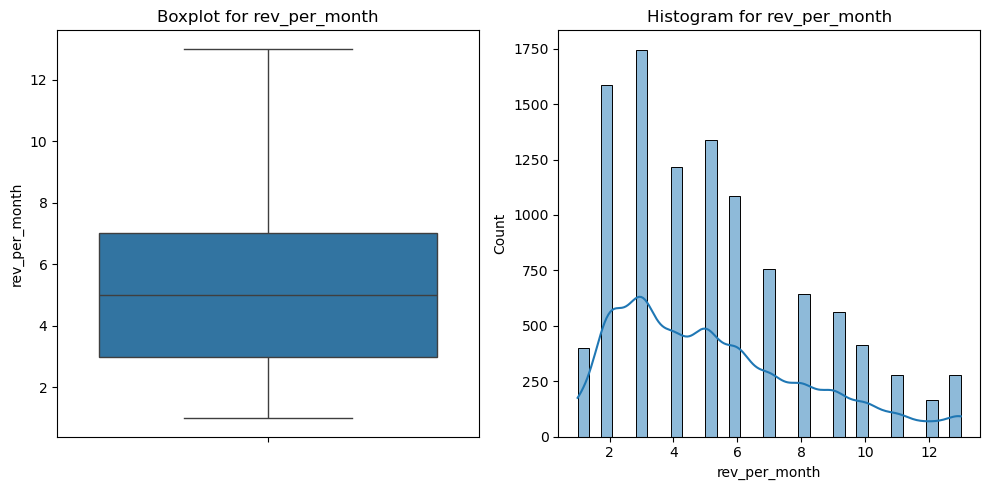

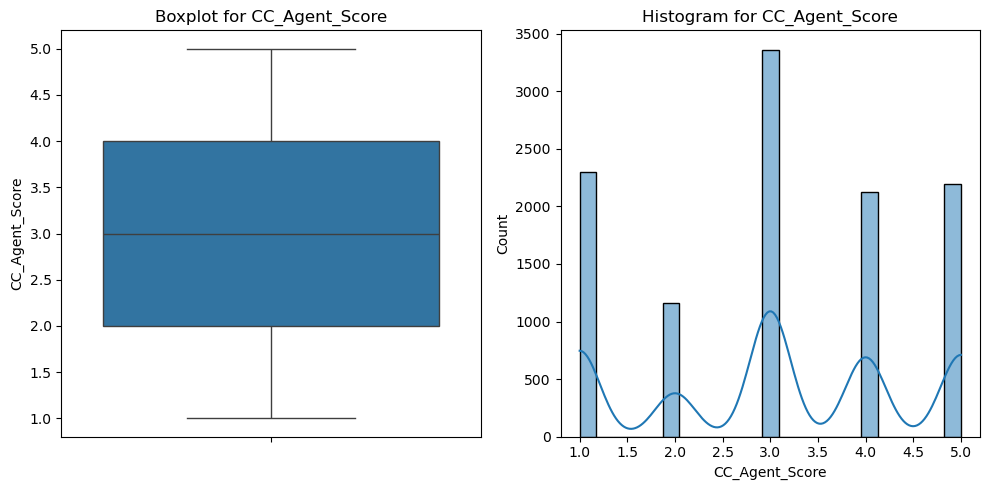

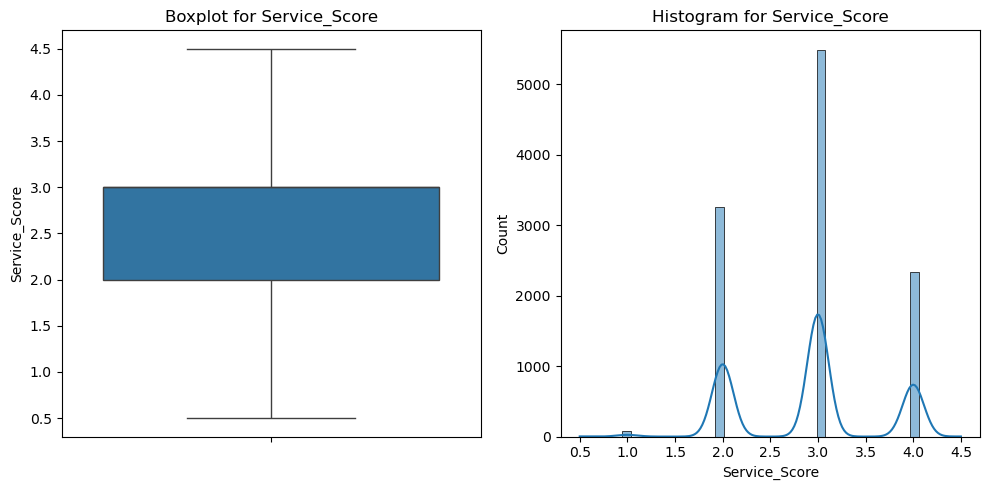

...

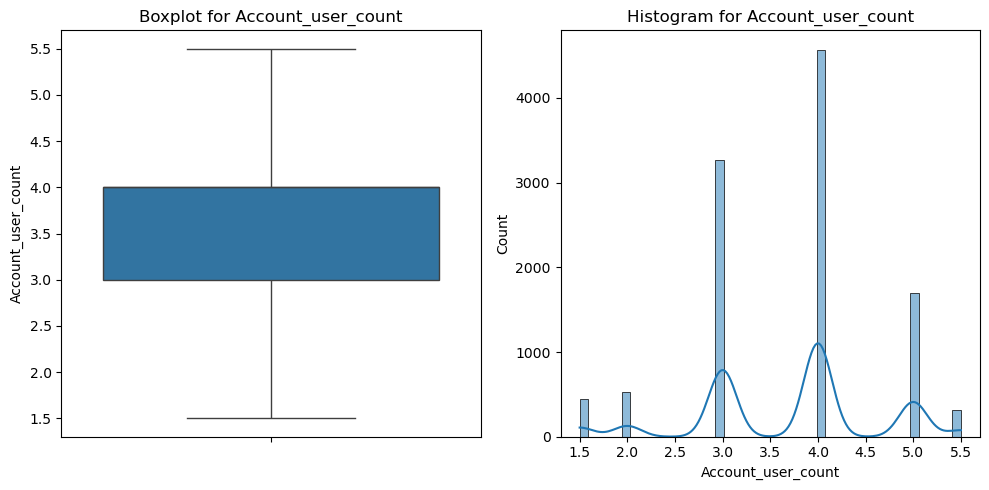

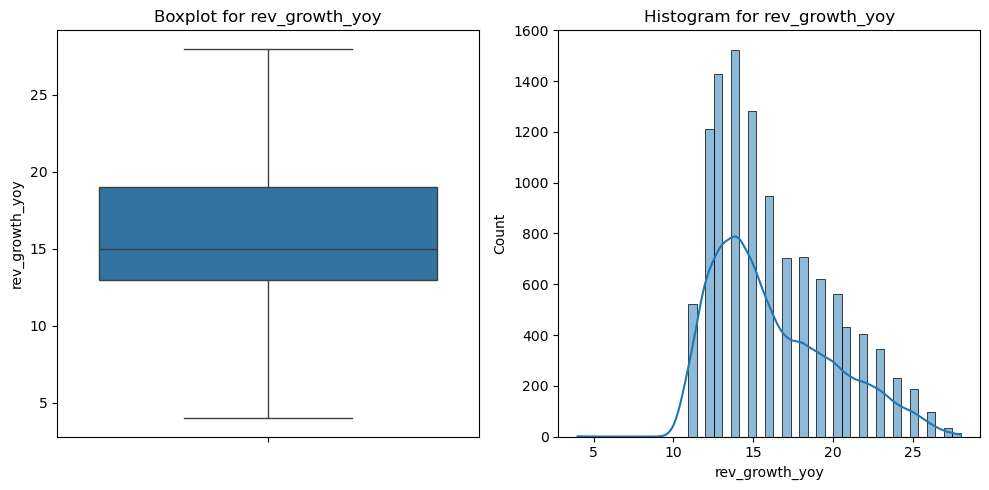

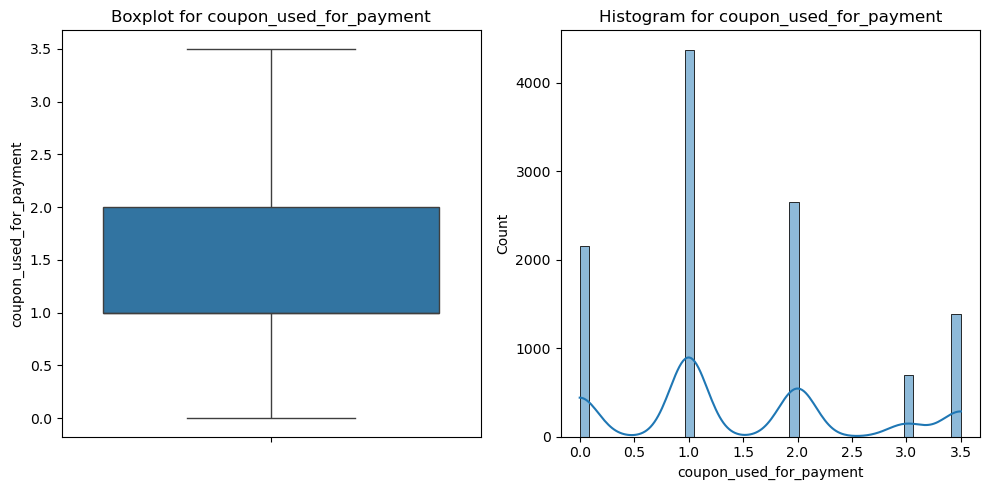

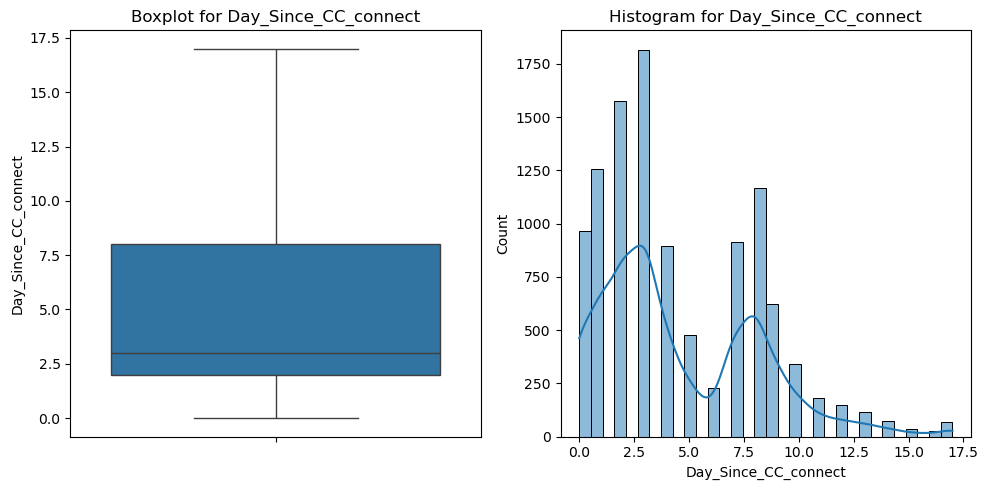

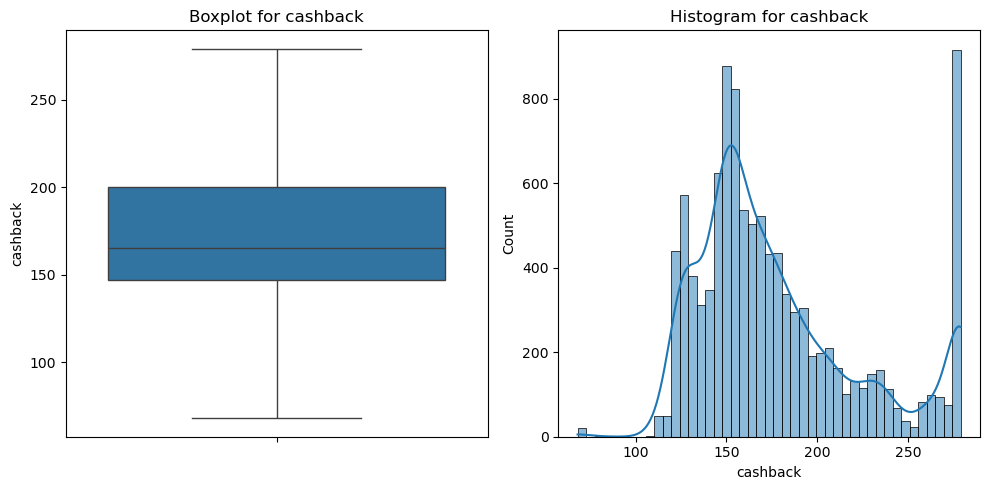

In [179]:
list_columns = df_numerical.columns
for i in range(len(list_columns)):
    plt.figure(figsize=(10, 5))  # Set the figure size for better visibility
    plt.subplot(1, 2, 1)  # Define the first subplot for the boxplot
    plt.title('Boxplot for {}'.format(list_columns[i]))
    sns.boxplot(y=df_numerical[list_columns[i]])  # Use 'y' to specify the vertical boxplot
    #ax_box2.set_title(f'Boxplot for {feature}')
    
    plt.subplot(1, 2, 2)  # Define the second subplot for the histogram
    plt.title('Histogram for {}'.format(list_columns[i]))
    sns.histplot(df_numerical[list_columns[i]], kde=True)  # Added KDE (Kernel Density Estimate) for smoothness

    # Save the combined plots as one image 
    #plt.savefig('Boxplot_Histogram_{}.png'.format(list_columns[i]), bbox_inches='tight')
    
    plt.tight_layout()  # Adjust subplots to fit into the figure area.
    plt.show()# Display the plots

### UNIVARIATE ANALYSIS

Creating plots for: Tenure


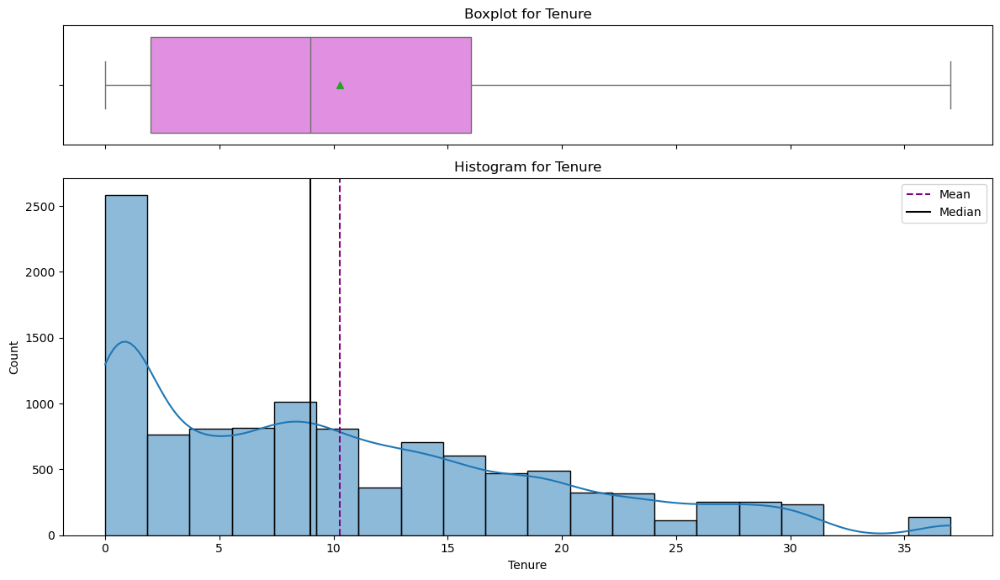

Creating plots for: CC_Contacted_LY


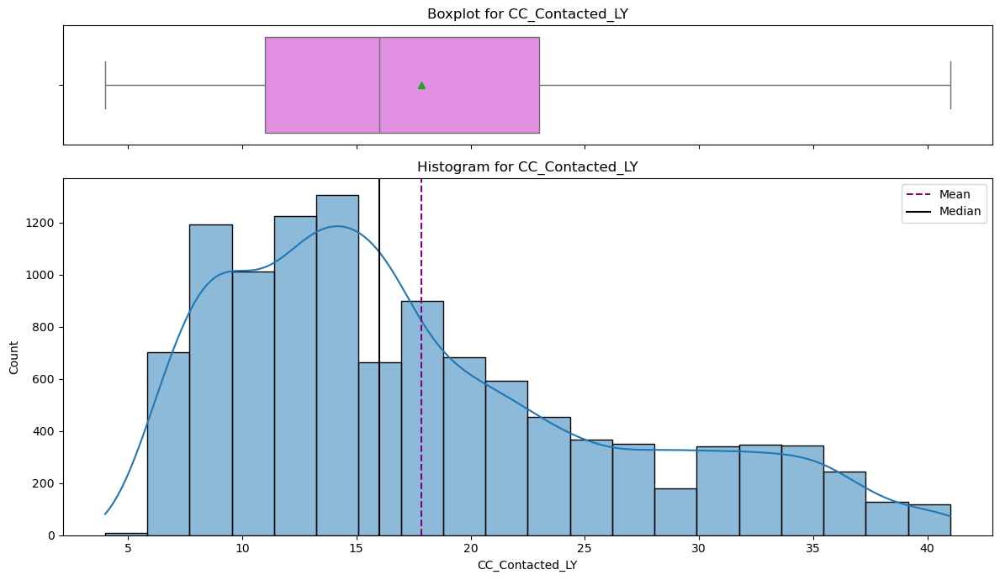

Creating plots for: rev_per_month


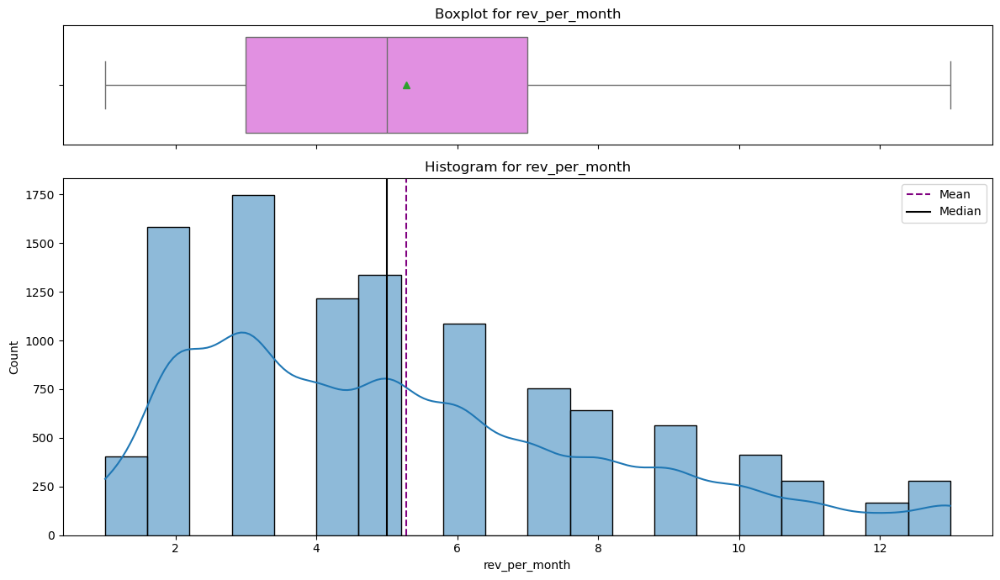

Creating plots for: CC_Agent_Score


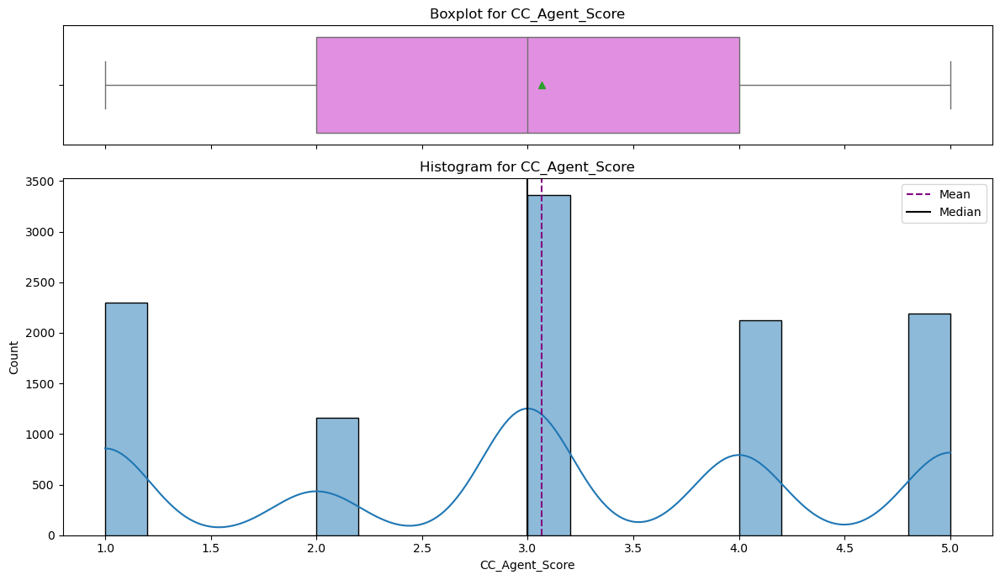

Creating plots for: Service_Score


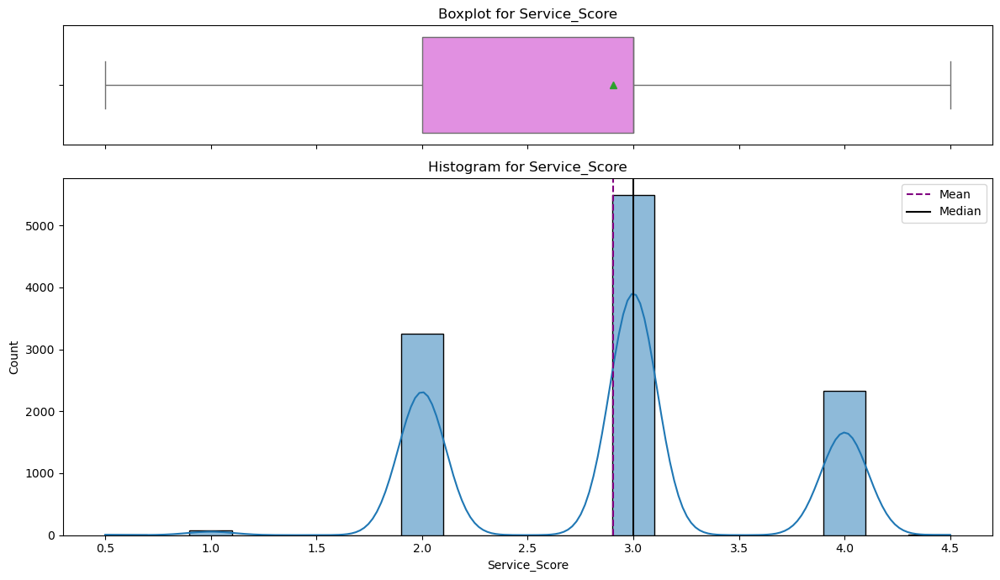

Creating plots for: Complain_ly


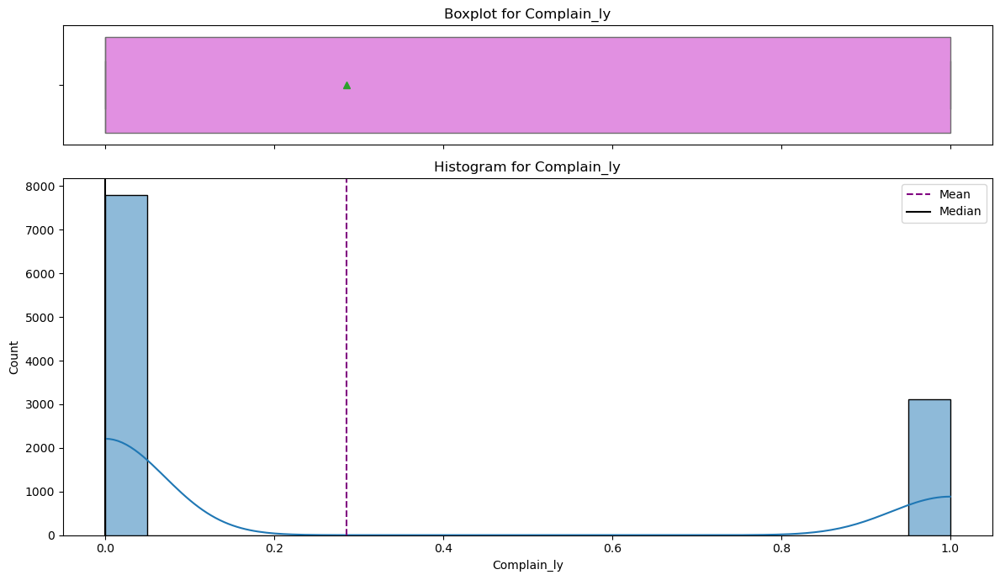

Creating plots for: Account_user_count


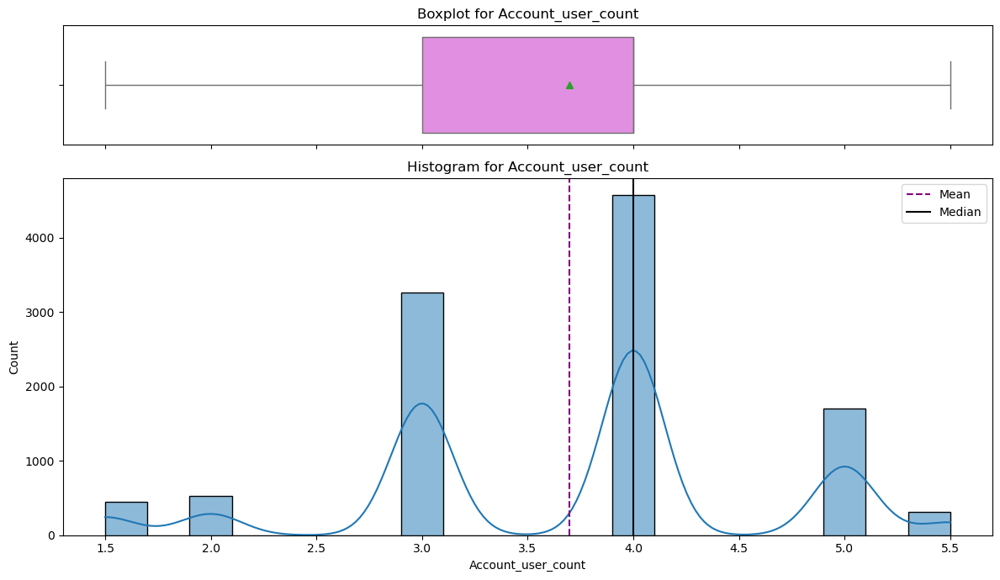

Creating plots for: rev_growth_yoy


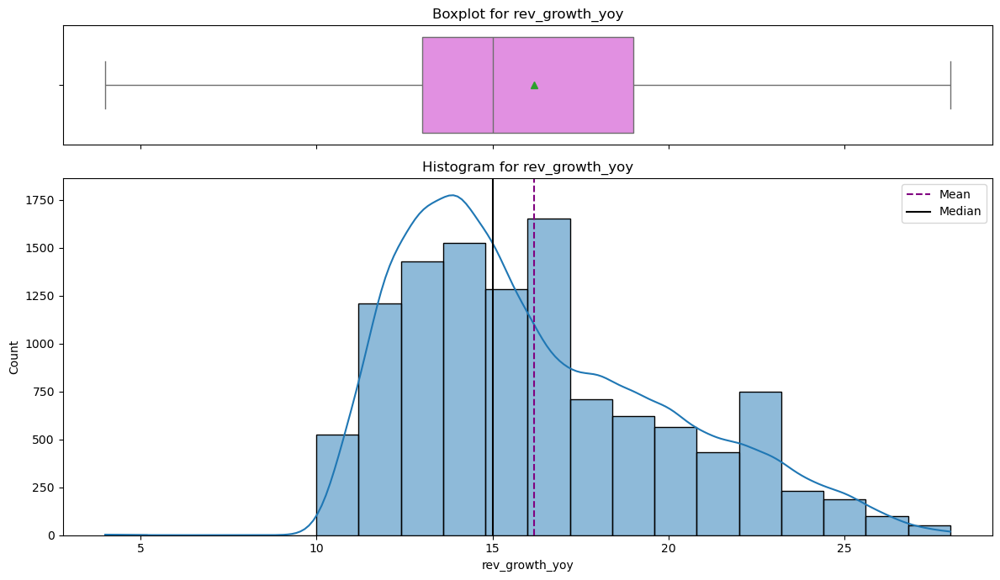

Creating plots for: coupon_used_for_payment


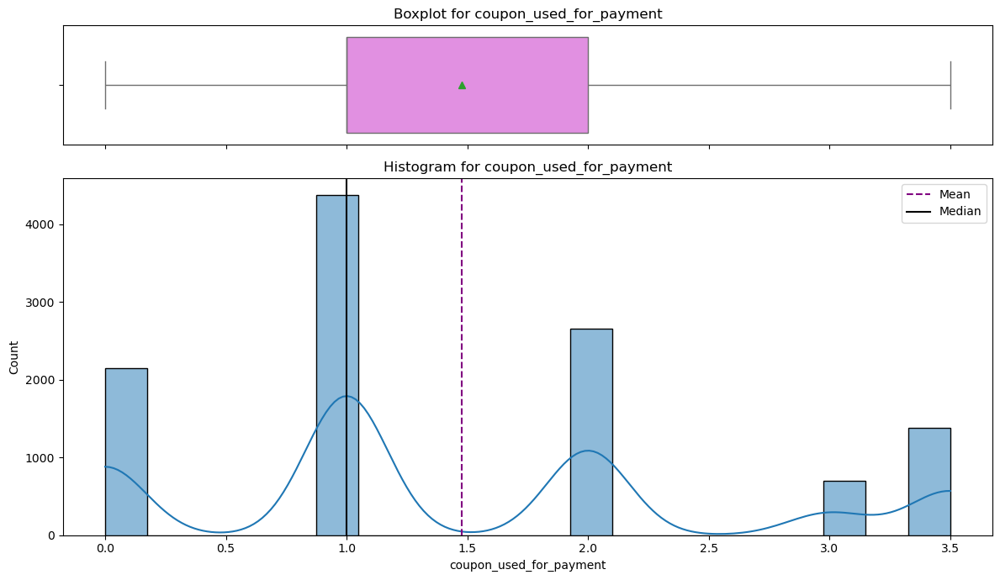

Creating plots for: Day_Since_CC_connect


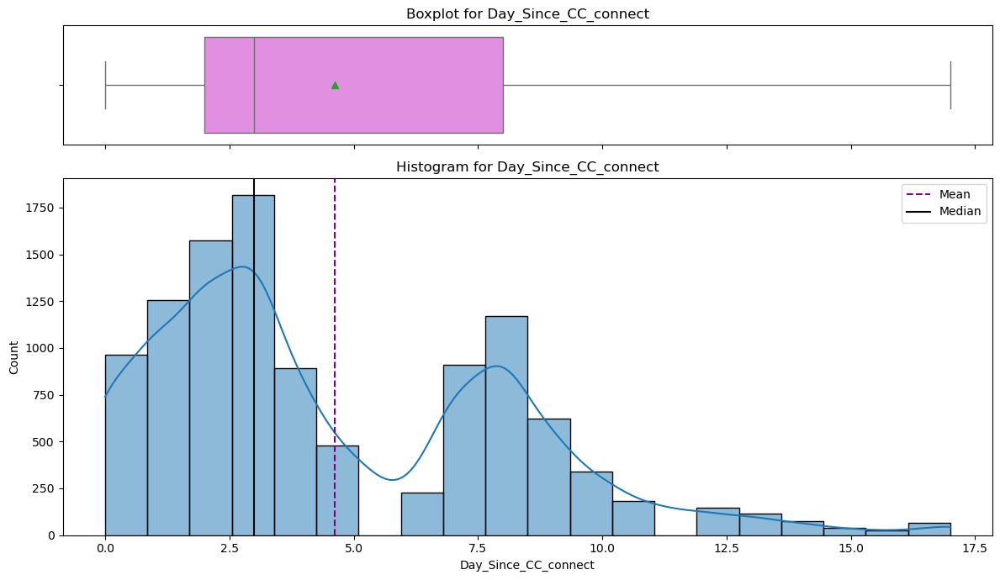

Creating plots for: cashback


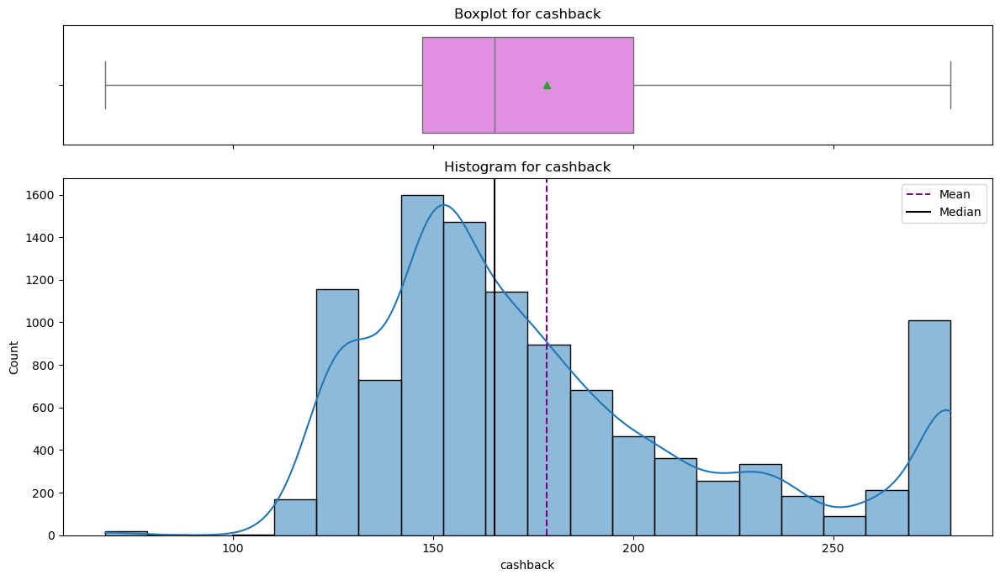

In [181]:
 #List of numerical columns
list_columns = df_numerical.columns

# Loop through each numerical variable and create the combined plot
for feature in list_columns:
    print(f"Creating plots for: {feature}")
    
    # Create subplots
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid = 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=(12, 7)
    )  # Creating the 2 subplots

    # Boxplot
    sns.boxplot(
        data=df_numerical, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )
    ax_box2.set_title(f'Boxplot for {feature}')

    # Histogram
    sns.histplot(
        data=df_numerical, x=feature, kde=True, ax=ax_hist2, bins=20  # Setting bins to 20
    )
    ax_hist2.set_title(f'Histogram for {feature}')
    
    # Add mean and median to the histogram
    mean_val = df_numerical[feature].mean()
    median_val = df_numerical[feature].median()
    ax_hist2.axvline(mean_val, color="purple", linestyle="--", label='Mean')
    ax_hist2.axvline(median_val, color="black", linestyle="-", label='Median')

    # Add a legend to the histogram
    ax_hist2.legend()

    # Adjust subplots to fit into the figure area.
    plt.tight_layout()

    # Save the plot 
   # plt.savefig(f"{feature}_plot.png")

    # Display the plots
    plt.show()


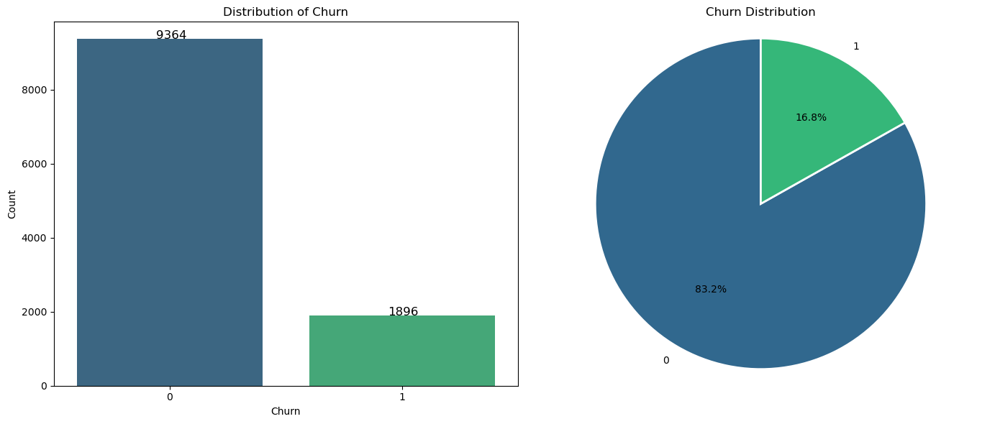

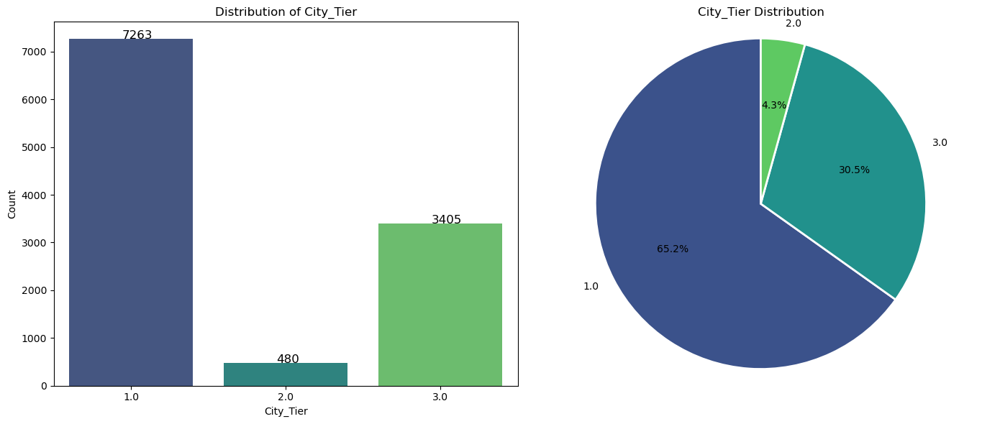

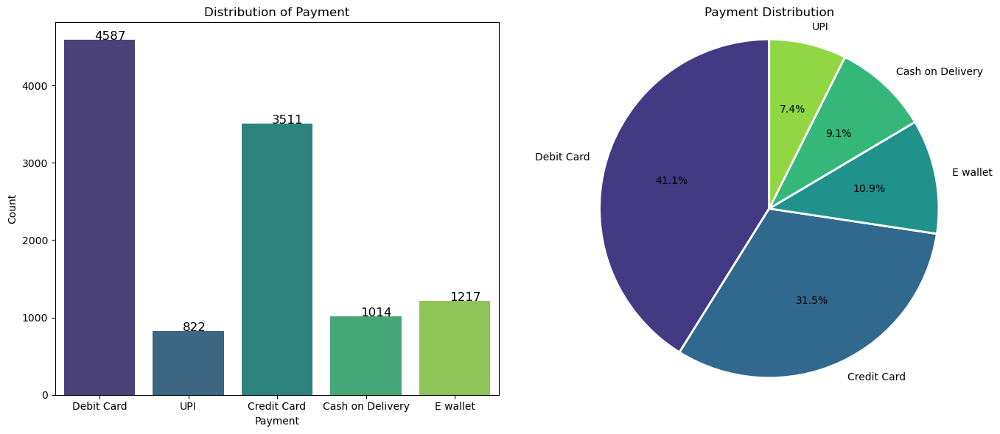

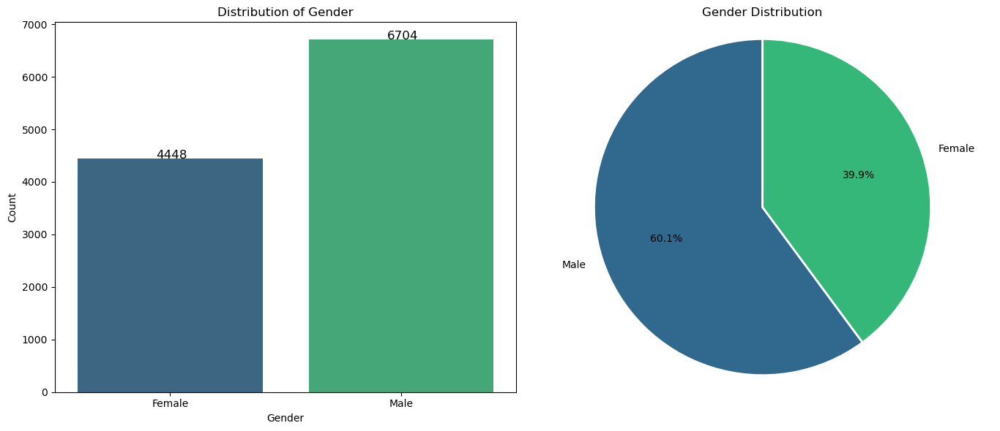

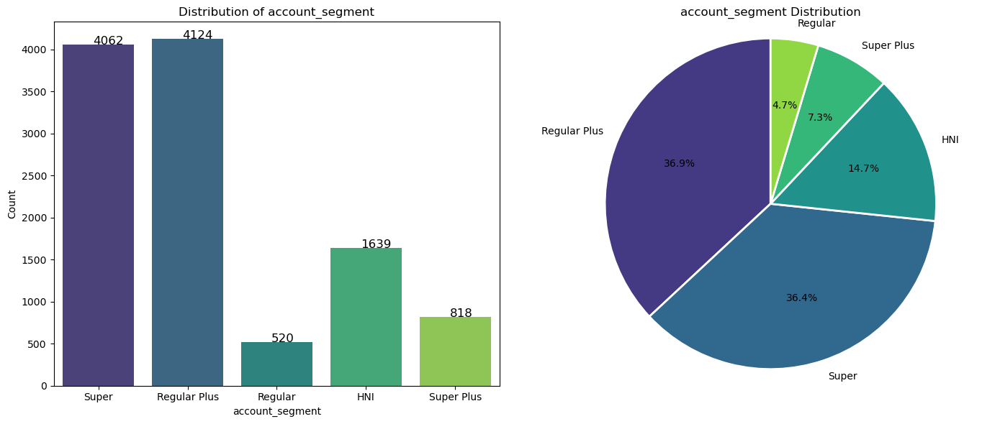

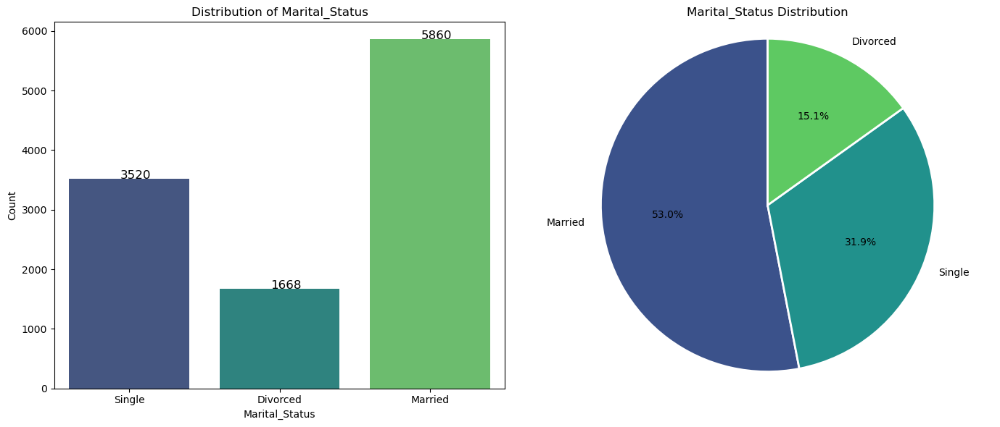

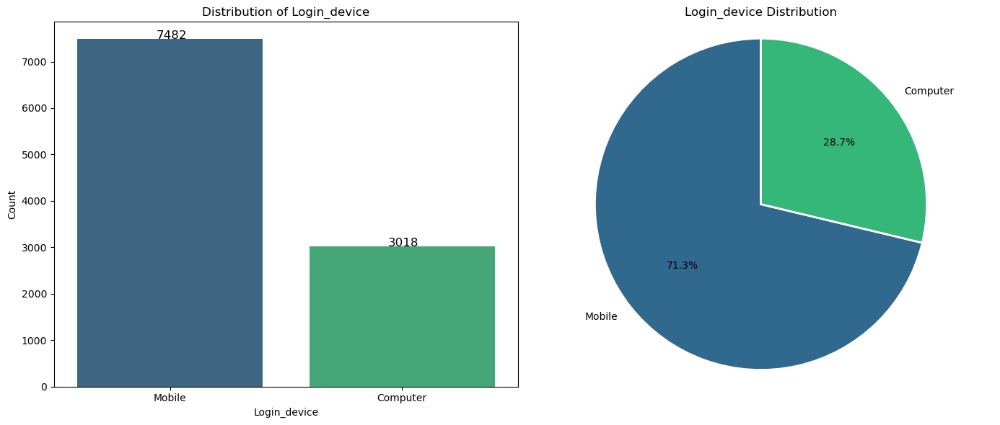

In [182]:
# Loop through each categorical variable and create the plots side by side
for feature in df_categorical:
    counts = df_categorical[feature].value_counts()
    
    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # Bar plot (histogram)
    sns.countplot(x=df_categorical[feature], palette="viridis", ax=ax1)
    for p in ax1.patches:
        count = int(p.get_height())
        x = p.get_x() + p.get_width() / 2 - 0.06
        y = p.get_y() + p.get_height()
        ax1.annotate(count, (x, y), size=12)
    ax1.set_title(f'Distribution of {feature}')
    ax1.set_ylabel('Count')

    # Pie chart
    ax2.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90, wedgeprops={'linewidth': 2, 'edgecolor': 'white'}, colors=sns.color_palette("viridis", len(counts)))
    ax2.set_title(f'{feature} Distribution')
    ax2.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

    # Adjust layout to make room for the titles
    plt.tight_layout()
    
    # Save the plot 
   # plt.savefig(f"{feature}_plot.png")
    
    # Display the plots
    plt.show()


### BIVARIATE ANALYSIS

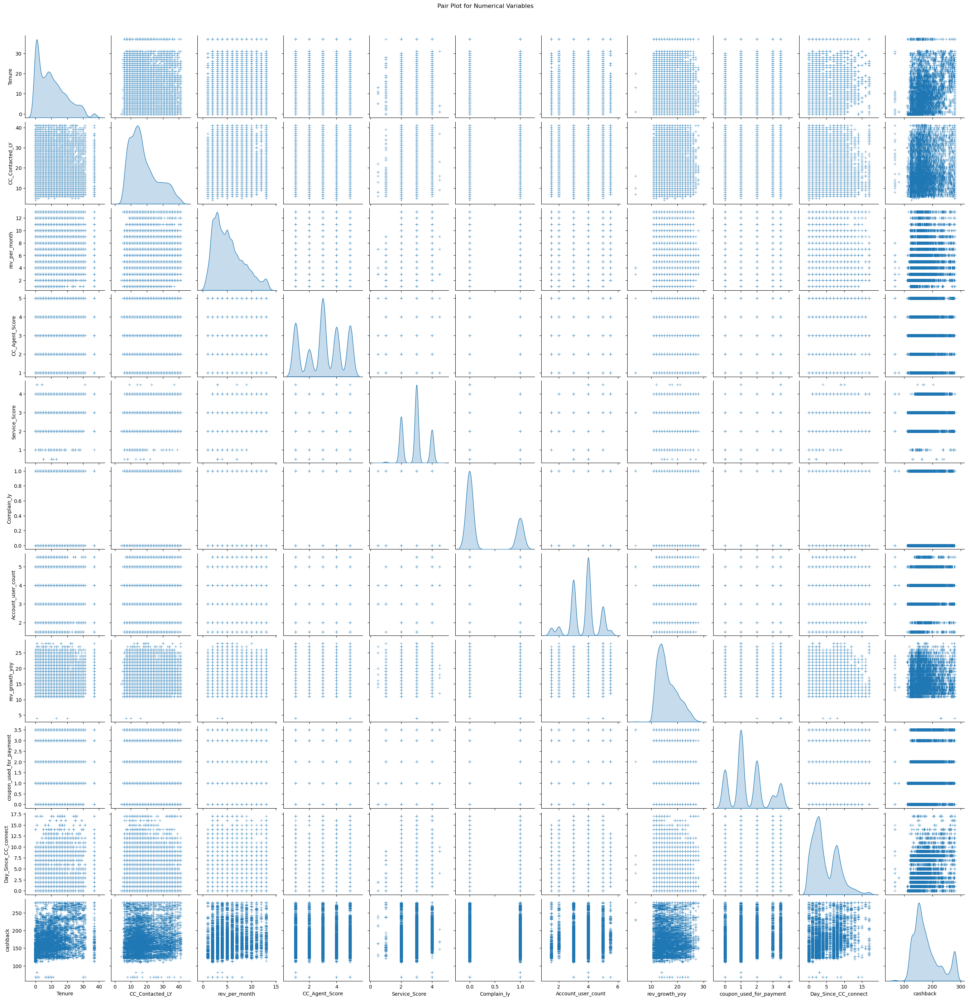

In [184]:
# Pair plot for the numerical variables in the dataframe
sns.pairplot(df_numerical, diag_kind='kde', markers='+')
plt.suptitle('Pair Plot for Numerical Variables', y=1.02)
#plt.savefig("pair_plot.png")
plt.show()


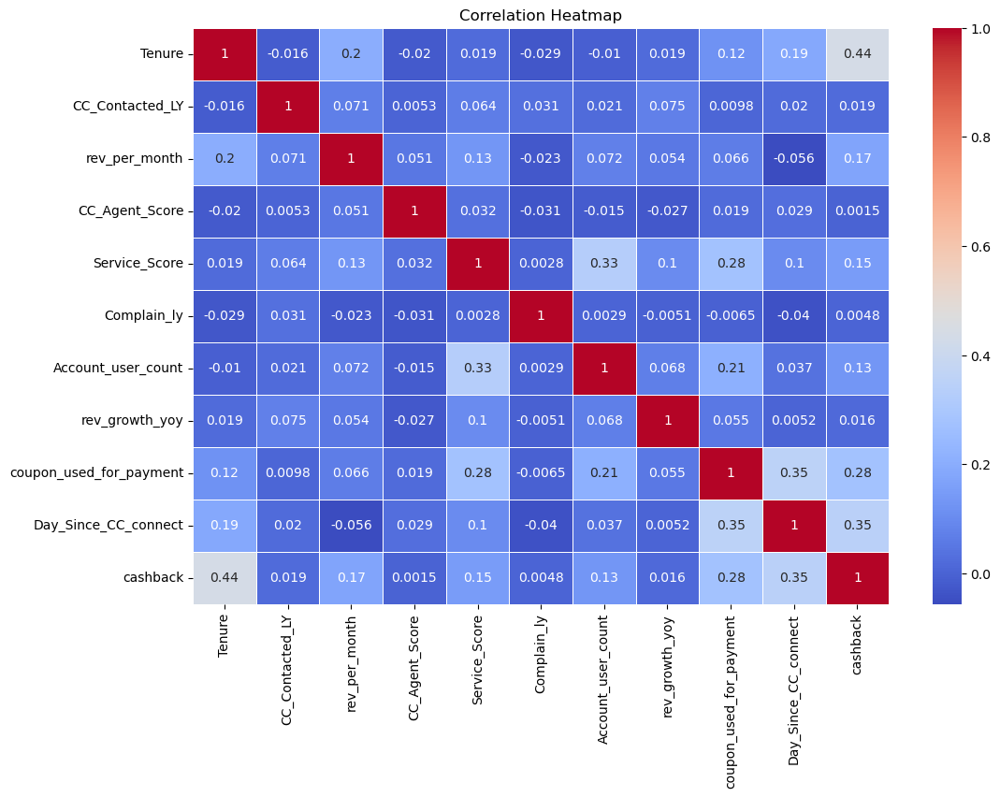

In [185]:
# Correlation heatmap for numerical variables
plt.figure(figsize=(12, 8))
sns.heatmap(df_numerical.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
# Save the heatmap 
#plt.savefig("correlation_heatmap.png")
plt.show()


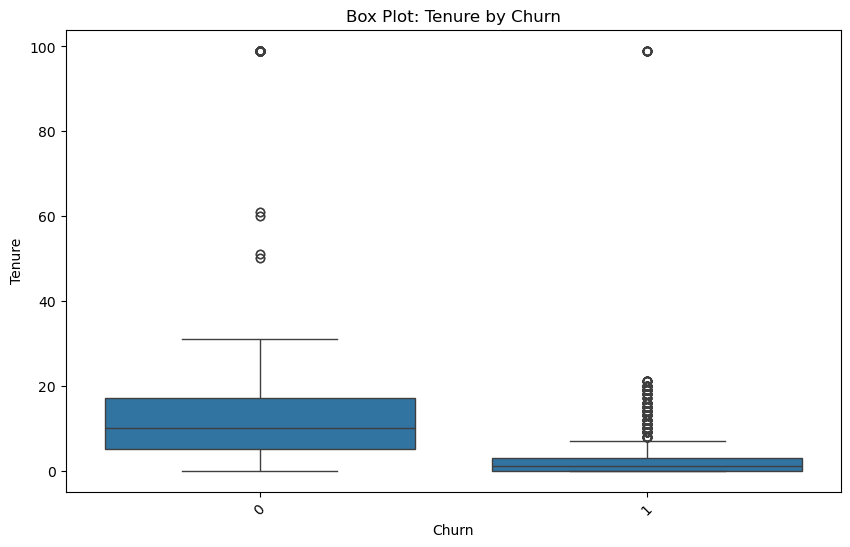

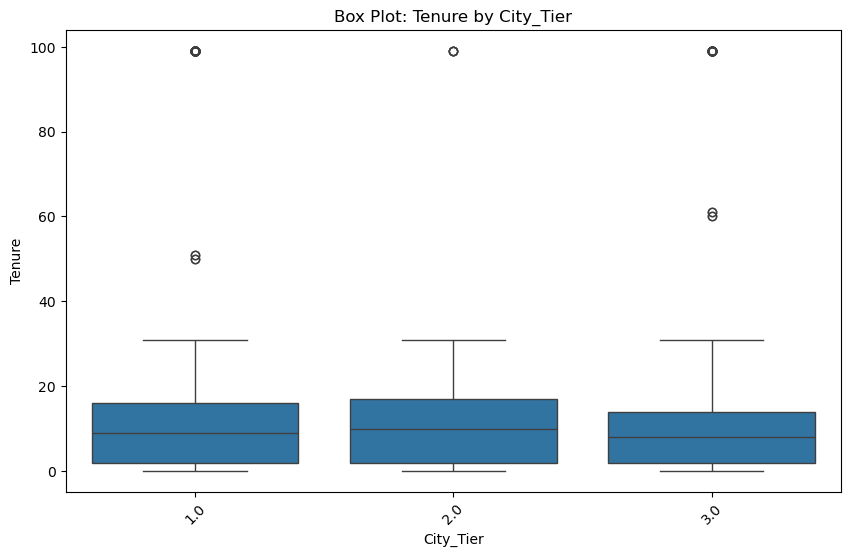

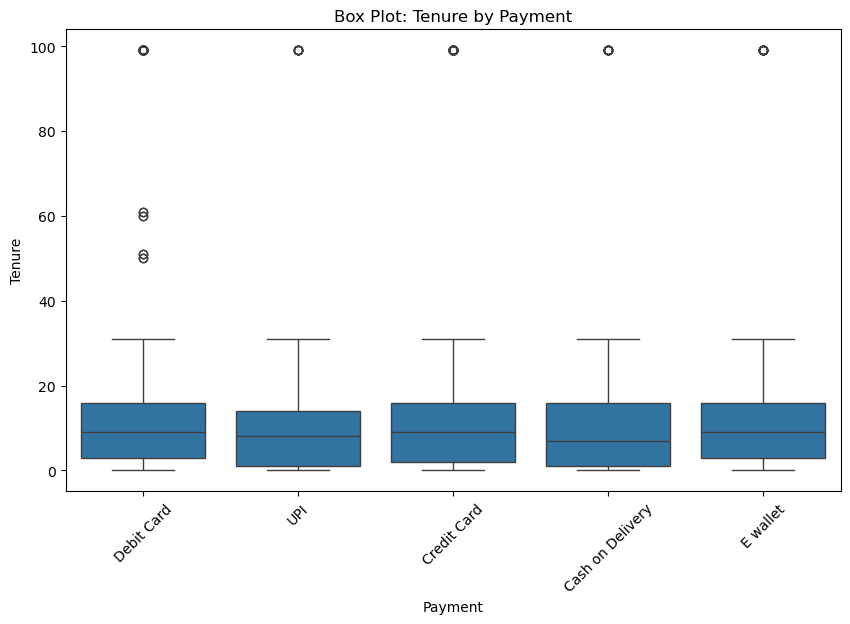

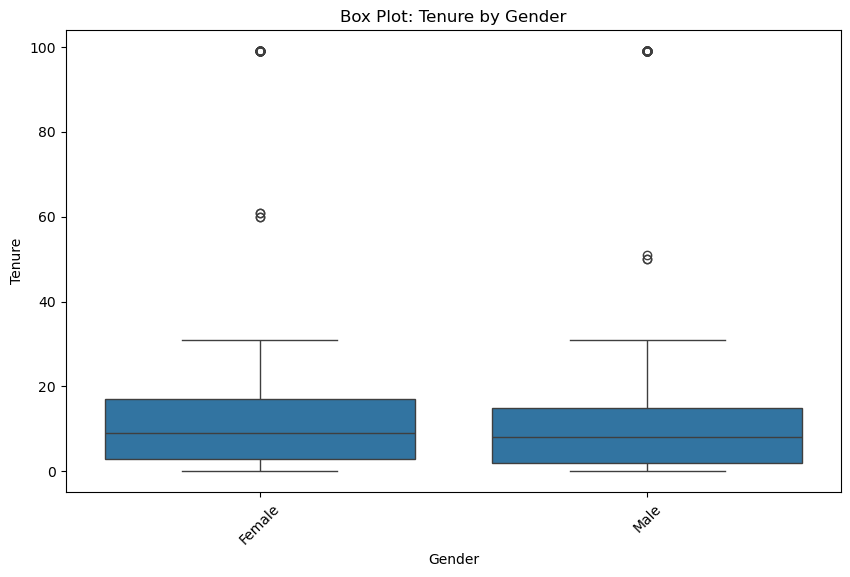

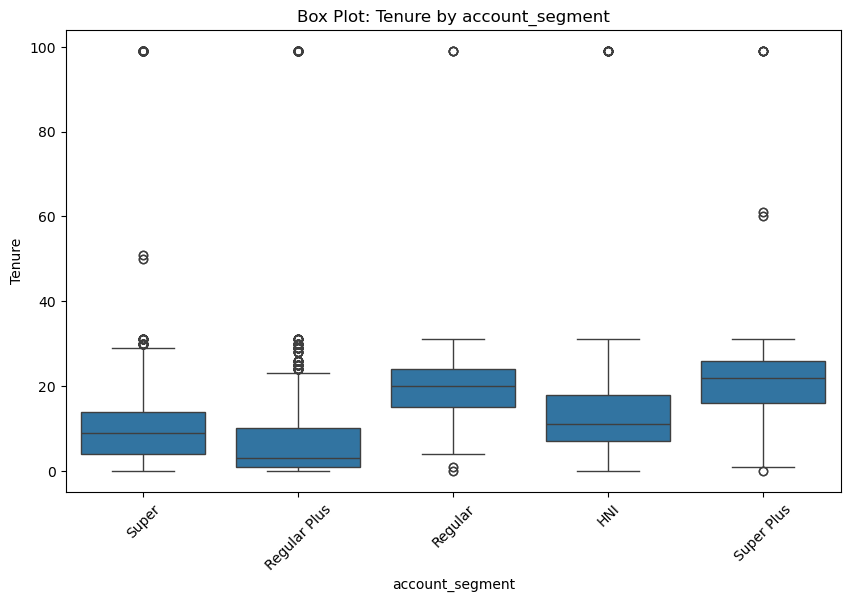

...

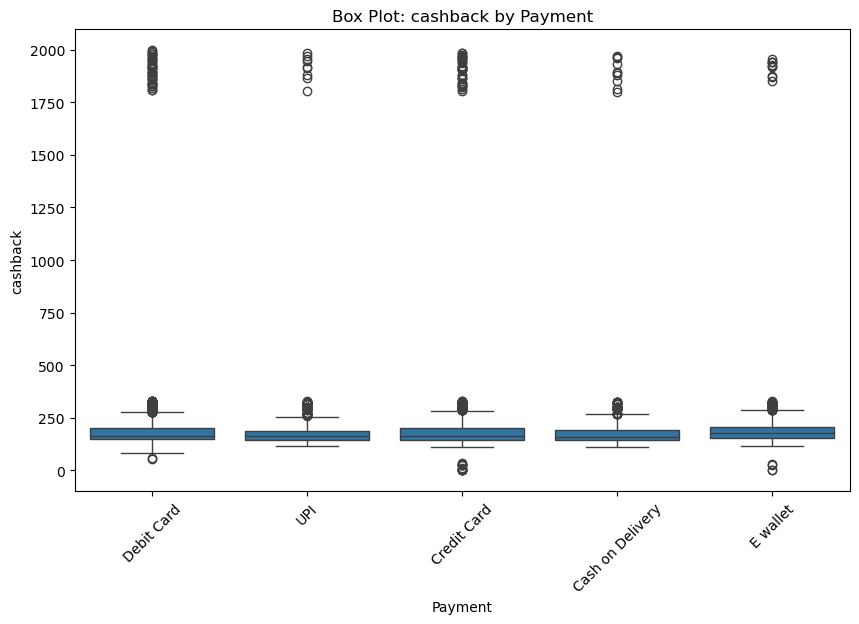

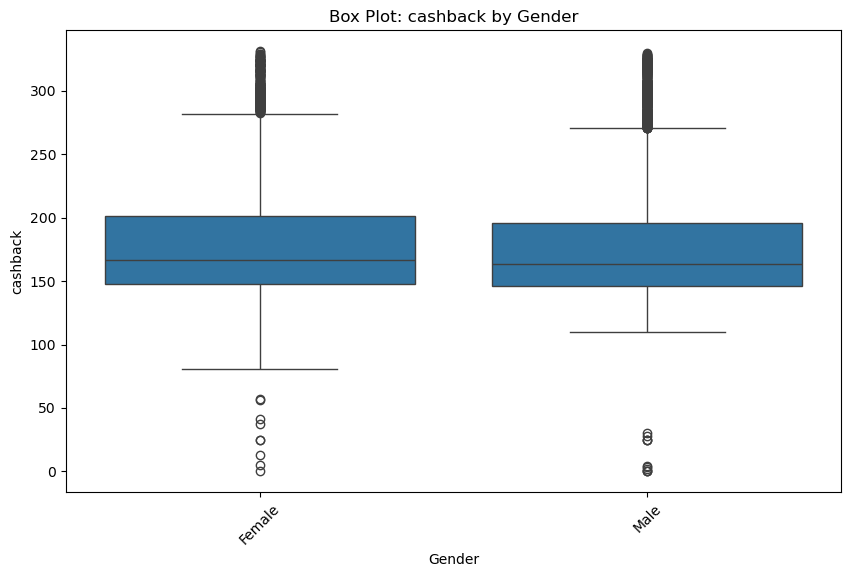

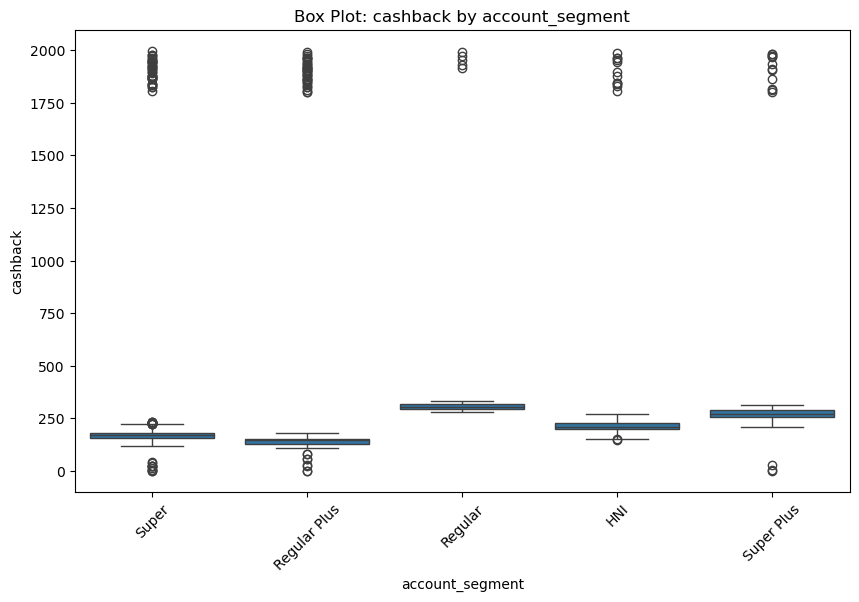

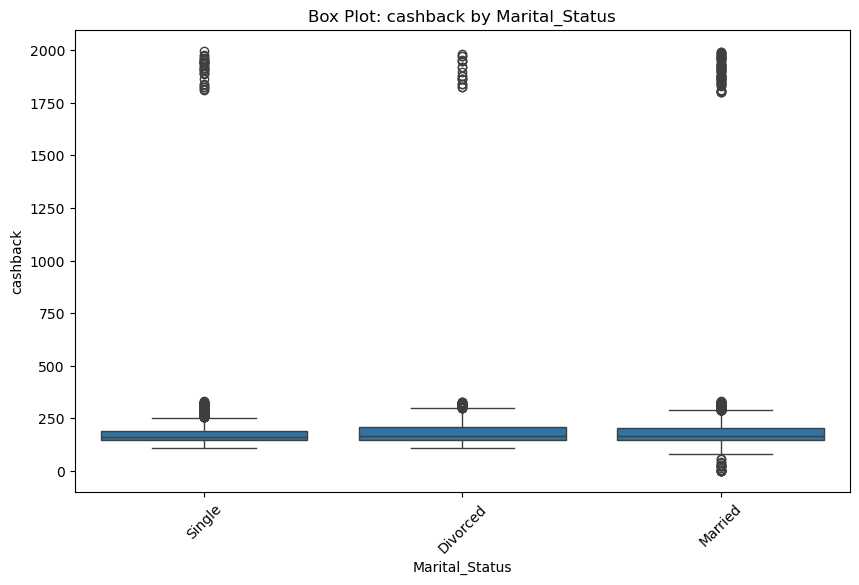

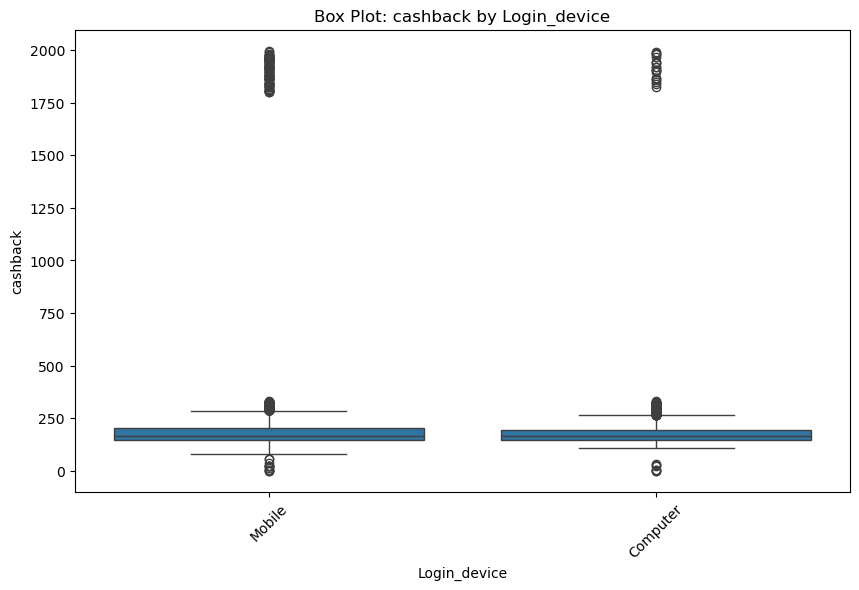

In [186]:
# Loop through each numerical and categorical variable and create the box plots
for num_var in df_numerical.columns:
    for cat_var in df_categorical.columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_var, y=num_var, data=cc_df)
        plt.title(f'Box Plot: {num_var} by {cat_var}')
        plt.xlabel(cat_var)
        plt.ylabel(num_var)
        plt.xticks(rotation=45)  # Rotate category labels if they are too long
        #plt.savefig(f"box_plot_{num_var}_by_{cat_var}.png")
        plt.show()


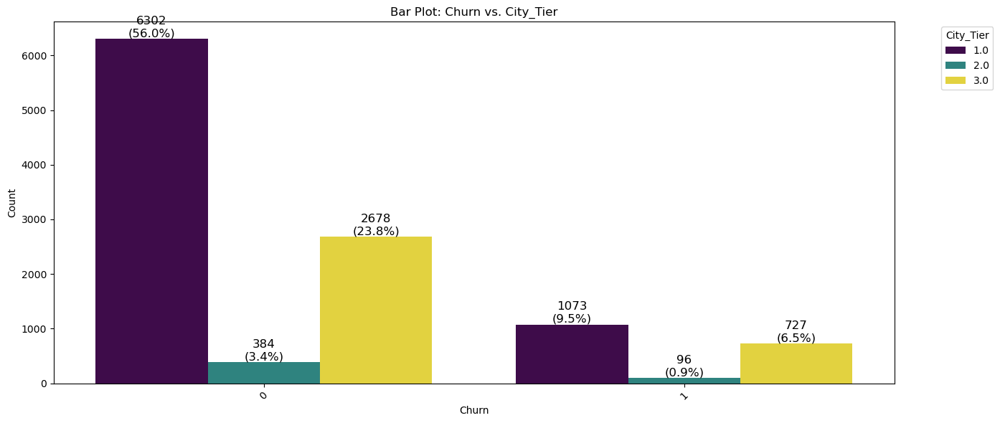

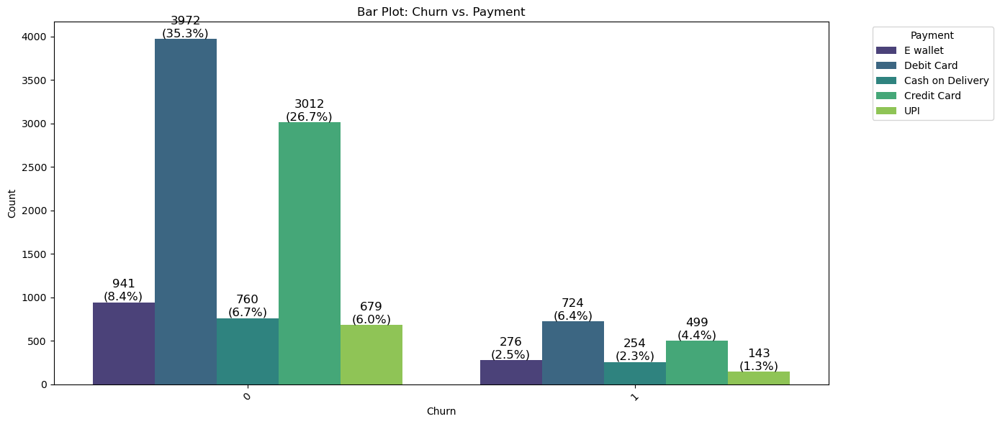

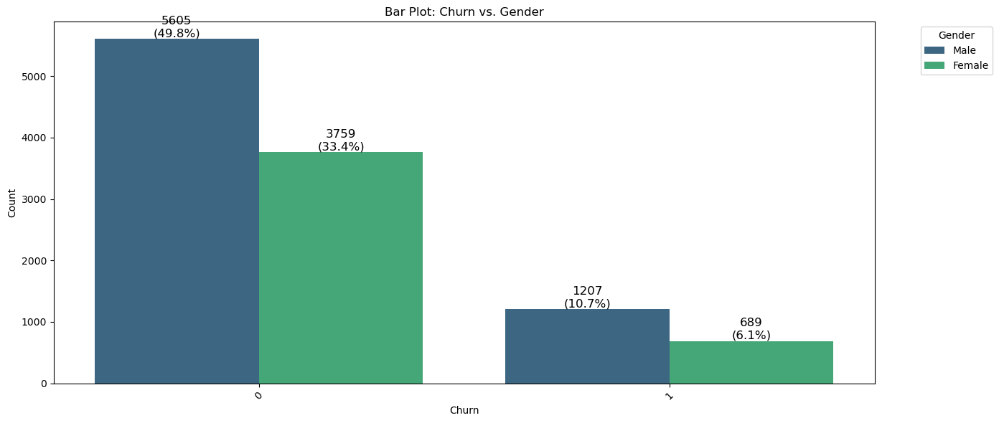

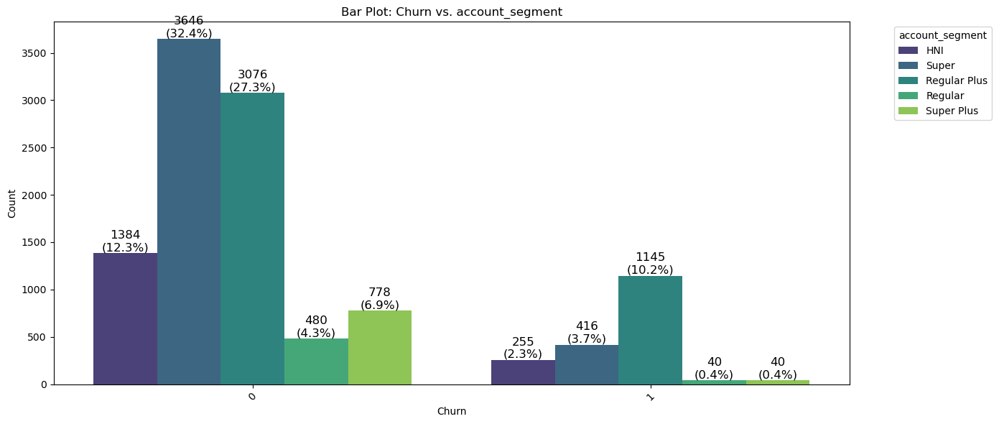

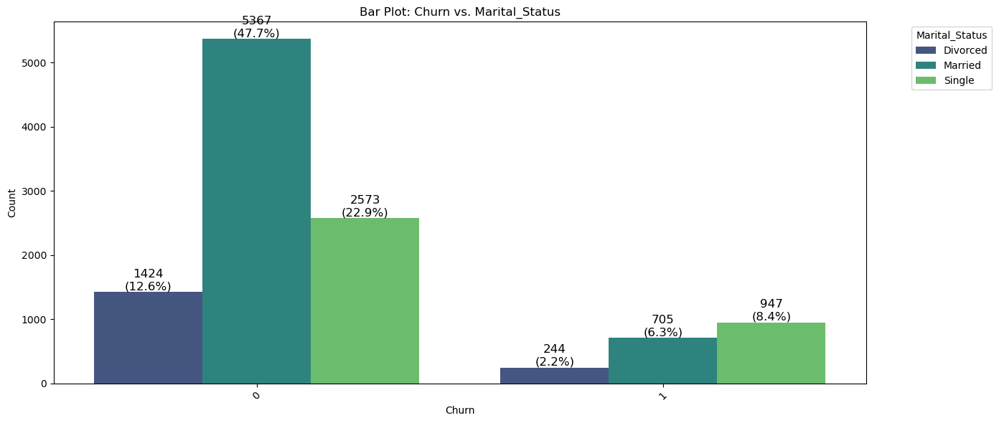

...

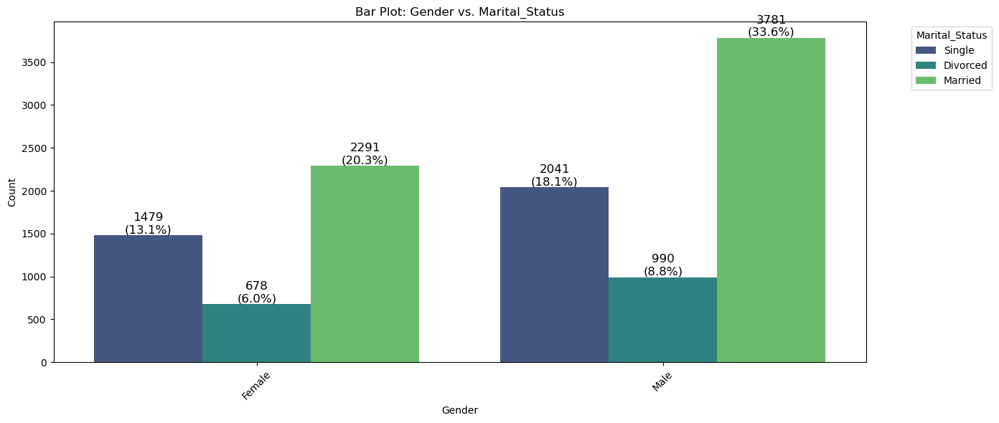

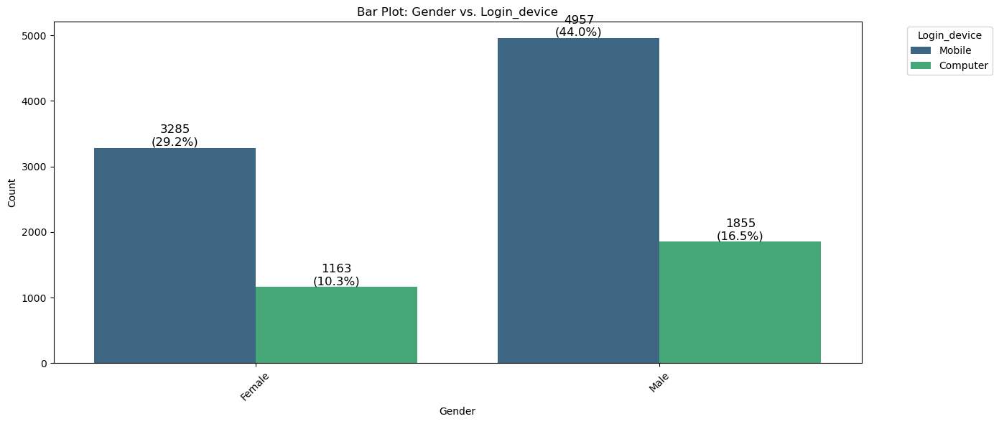

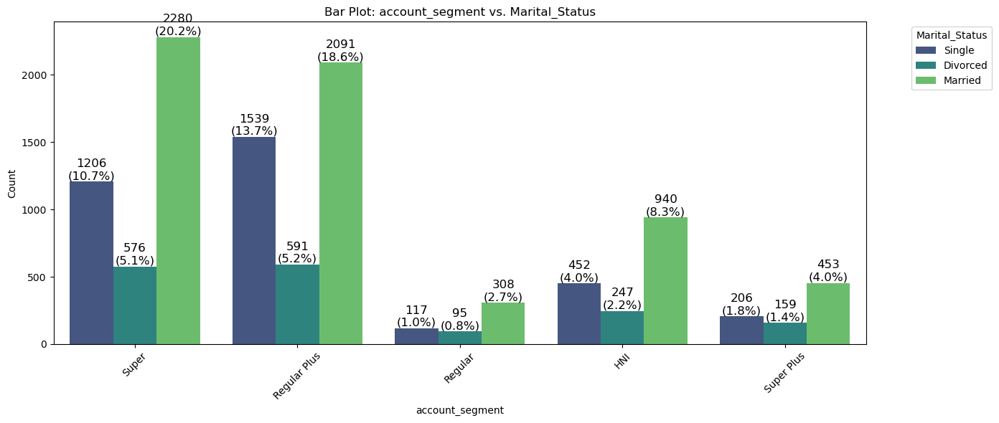

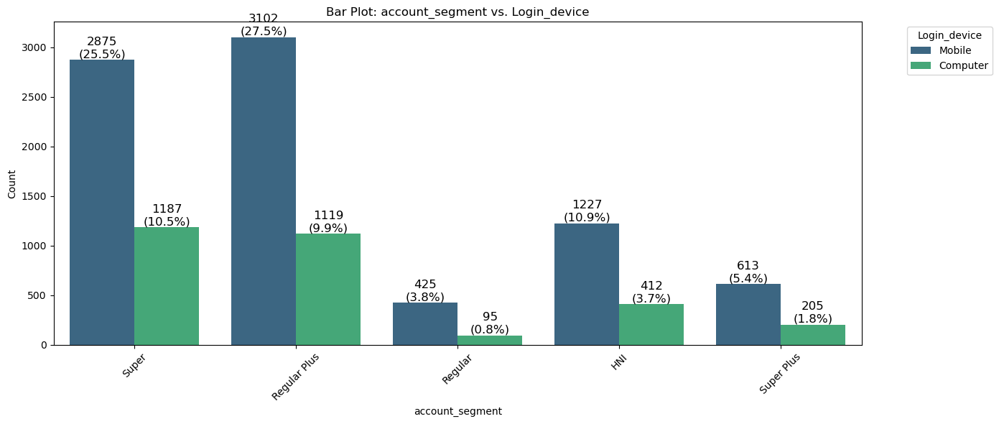

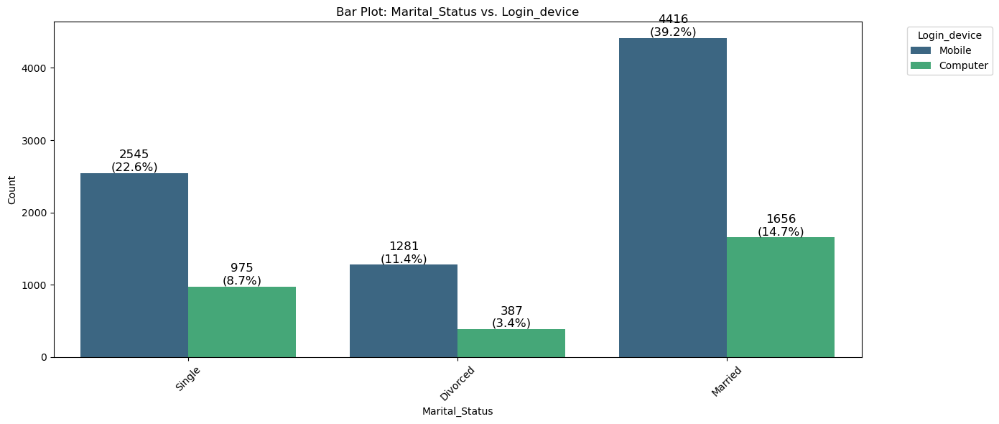

In [187]:
def plot_categorical_relationships(df, cat_var1, cat_var2, plot_type='bar', figsize=(14, 6), palette="viridis", annotate=True, save_path=None):
    plt.figure(figsize=figsize)
    
    if plot_type == 'bar':
        ax = sns.countplot(x=cat_var1, hue=cat_var2, data=df, palette=palette)
        if annotate:
            total = len(df)
            for p in ax.patches:
                count = int(p.get_height())
                if count > 0:  # Only annotate if count is greater than zero
                    percentage = "{:.1f}%".format(100 * p.get_height() / total)
                    x = p.get_x() + p.get_width() / 2
                    y = p.get_y() + p.get_height()
                    ax.annotate(f'{count}\n({percentage})', (x, y), size=12, ha='center', va='bottom')
        plt.title(f'Bar Plot: {cat_var1} vs. {cat_var2}')
    
    elif plot_type == 'box':
        sns.boxplot(x=cat_var1, y=cat_var2, data=df, palette=palette)
        plt.title(f'Box Plot: {cat_var1} vs. {cat_var2}')
    
    elif plot_type == 'scatter':
        sns.scatterplot(x=cat_var1, y=cat_var2, data=df, palette=palette)
        plt.title(f'Scatter Plot: {cat_var1} vs. {cat_var2}')
    
    plt.xlabel(cat_var1)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title=cat_var2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    
    # if save_path:
    #     plt.savefig(save_path)
    
    plt.show()

# Loop through each pair of categorical variables and create different charts
cat_vars = df_categorical.columns

for i in range(len(cat_vars)):
    for j in range(i + 1, len(cat_vars)):
        plot_categorical_relationships(df_cc, cat_vars[i], cat_vars[j], plot_type='bar')#,save_path=f'plot_{cat_vars[i]}_vs_{cat_vars[j]}.png')


### One-way Anova Hypothesis test:

for feature selection

Means for churn=0 and churn=1 observations with respect to the predictor variable are the same.

 : Means for the churn=0 and churn=1 with respect to the predictor variable are not equal.

In [189]:
import pandas as pd
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Assuming you have a DataFrame named `df_cc` with numerical columns and a target variable 'Churn'

# List of all numerical columns
numerical_columns = df_numerical.columns

# Initialize an empty list to store ANOVA results
anova_results = []

# Loop through each numerical variable
for col in numerical_columns:
    formula = f'{col} ~ C(Churn)'
    model = ols(formula, data=df_cc).fit()
    aov_table = anova_lm(model)

    # Iterate through the columns to find the p-value column
    p_value_column = None
    for col_name in aov_table.columns:
        if 'Pr(>F)' in col_name or 'P' in col_name:
            p_value_column = col_name
            break

    if p_value_column is None:
        raise ValueError("Could not find p-value column in ANOVA table")

    f_statistic = aov_table['F'][0]
    p_value = aov_table[p_value_column][0]
    inference = "Reject null hypothesis. The means are different. Variable significant to model building" if p_value < 0.05 else "Cannot reject null hypothesis. The means are equal. Variable can be dropped"

    # Append the results to the list
    anova_results.append([col, f_statistic, p_value, inference])

# Create a DataFrame from the results
df_anova = pd.DataFrame(anova_results, columns=['Variable', 'F-statistic', 'Probability of > F', 'Inference at significance level of 5%'])

# Display the DataFrame
df_anova 

,Variable,F-statistic,Probability of > F,Inference at significance level of 5%
0,Tenure,632.814262,6.633734e-136,Reject null hypothesis. The means are differen...
1,CC_Contacted_LY,58.135818,2.643050e-14,Reject null hypothesis. The means are differen...
2,rev_per_month,5.513580,1.888659e-02,Reject null hypothesis. The means are differen...
3,CC_Agent_Score,125.902638,4.605513e-29,Reject null hypothesis. The means are differen...
4,Service_Score,0.899025,3.430638e-01,Cannot reject null hypothesis. The means are e...
5,Complain_ly,727.372270,2.691200e-155,Reject null hypothesis. The means are differen...
6,Account_user_count,124.378455,9.844343e-29,Reject null hypothesis. The means are differen...
7,rev_growth_yoy,2.156197,1.420237e-01,Cannot reject null hypothesis. The means are e...
8,coupon_used_for_payment,2.458905,1.168883e-01,Cannot reject null hypothesis. The means are e...
9,Day_Since_CC_connect,243.193686,2.919380e-54,Reject null hypothesis. The means are differen...


### Chi squared test: 

for independence - feature selection Hypothesis

Null hypothesis: There is no relationship between two categorical variables
Alternate hypothesis: There is a relationship between two categorical variables
Questions to be answered through this test

Does Churn have any relationship with any of the categorical variables

In [191]:
import pandas as pd
from scipy import stats

# Assuming df_categorical is your DataFrame with categorical variables
op_table = pd.DataFrame(columns=['Variable', 'chi2', 'p-value', 'chi2_output'])

for variable in df_categorical.columns:
    if variable != 'Churn':  # Exclude the target variable itself
        variable_churn_ct = pd.crosstab(index=df_categorical[variable], columns=df_categorical['Churn'])
        print("-"*40)
        print(f"Crosstab for {variable}:\n", variable_churn_ct)
        
        chi2, p, dof, _ = stats.chi2_contingency(variable_churn_ct)

        if p < 0.05:
            chi2_decision = 'Reject Ho; Dependent.'
        else:
            chi2_decision = 'Fail to reject Ho; Independent'

        result = pd.DataFrame([{'Variable': variable, 'chi2': chi2, 'p-value': p, 'chi2_output': chi2_decision}])
        op_table = pd.concat([op_table, result], ignore_index=True)
print("#"*40)
op_table


----------------------------------------
Crosstab for City_Tier:
 Churn         0     1
City_Tier            
1.0        6207  1056
2.0         384    96
3.0        2678   727
----------------------------------------
Crosstab for Payment:
 Churn                0    1
Payment                    
Cash on Delivery   760  254
Credit Card       3012  499
Debit Card        3885  702
E wallet           941  276
UPI                679  143
----------------------------------------
Crosstab for Gender:
 Churn      0     1
Gender            
Female  3759   689
Male    5519  1185
----------------------------------------
Crosstab for account_segment:
 Churn               0     1
account_segment            
HNI              1384   255
Regular           480    40
Regular Plus     2997  1127
Super            3646   416
Super Plus        778    40
----------------------------------------
Crosstab for Marital_Status:
 Churn              0    1
Marital_Status           
Divorced        1424  244
Married 

,Variable,chi2,p-value,chi2_output
0,City_Tier,80.288817,3.677095e-18,Reject Ho; Dependent.
1,Payment,103.799617,1.526348e-21,Reject Ho; Dependent.
2,Gender,8.983146,2.724812e-03,Reject Ho; Dependent.
3,account_segment,567.068402,2.073937e-121,Reject Ho; Dependent.
4,Marital_Status,379.808123,3.355165e-83,Reject Ho; Dependent.
5,Login_device,25.726928,3.933008e-07,Reject Ho; Dependent.


### Encoding and Scaling

label encoding on Payment and account_segment variables while we do one hot encoding on Martial_status,Gender, Login_device and City_Tier

EFFECTS OF SCALING:

The influence of scaling on an algorithm’s efficiency is significant. Analyzing the dataset’s statistical summary reveals a broad spectrum of values, ranging from minimal to substantial. These values are not uniform in scale and carry varying degrees of significance, which underscores the necessity of scaling. 

Essentially, scaling standardizes the range of independent variables or features of data, ensuring that each feature contributes proportionately to the final prediction. This homogenization is crucial because it can impact the performance of many machine learning algorithms, particularly those that use distance calculations like k-nearest neighbors (k-NN) or gradient descent-based algorithms like linear regression. Without scaling, features with larger ranges could unduly influence the model, leading to biased results. 

Therefore, scaling helps to balance the contribution of each feature, facilitating a more accurate and fair evaluation by the algorithm.

In [195]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Assuming df_numerical and df_categorical are already defined
# One-Hot Encoding
one_hot_cols = ['Payment', 'Gender', 'account_segment', 'Marital_Status', 'Login_device']
df_categorical_encoded = pd.get_dummies(df_categorical, columns=one_hot_cols, drop_first=True)

# Label Encoding City_Tier
label_cols = ['City_Tier']
label_encoder = LabelEncoder()

for col in label_cols:
    df_categorical_encoded[col] = label_encoder.fit_transform(df_categorical_encoded[col])

# Convert boolean columns to integers
bool_cols = df_categorical_encoded.select_dtypes(include=['bool']).columns
df_categorical_encoded[bool_cols] = df_categorical_encoded[bool_cols].astype(int)

# Separate the target variable
target = df_categorical_encoded['Churn']
df_categorical_encoded = df_categorical_encoded.drop(columns=['Churn'])

# # Unscaled Encoded Dataset
# unscaled_df = pd.concat([df_numerical, df_categorical_encoded], axis=1)
# unscaled_df['Churn'] = target.values

# # Check for NaN or infinite values
# if not np.all(np.isfinite(unscaled_df)):
#     print("Data contains NaN or infinite values. Handling them...")

# # Replace NaN or infinite values with a specific value (e.g., zero)
# unscaled_df.replace([np.inf, -np.inf], np.nan, inplace=True)
# unscaled_df.fillna(0, inplace=True)

# Scale numerical features
scaler = StandardScaler()
scaled_numerical_features = scaler.fit_transform(df_numerical)

# Convert scaled numerical features back to DataFrame
df_numerical_scaled = pd.DataFrame(scaled_numerical_features, columns=df_numerical.columns)

# Combine numerical and categorical features
scaled_df = pd.concat([df_numerical_scaled, df_categorical_encoded], axis=1)
scaled_df['Churn'] = target.values

# Check for NaN or infinite values
if not np.all(np.isfinite(scaled_df)):
    print("Data contains NaN or infinite values. Handling them...")

# Replace NaN or infinite values with a specific value (e.g., zero)
scaled_df.replace([np.inf, -np.inf], np.nan, inplace=True)
scaled_df.fillna(0, inplace=True)

# print("Unscaled Encoded Dataset without outlier presence:")
# print(unscaled_df.head())

print("Scaled and Encoded Dataset without outlier presence:")
print(scaled_df.head())


Data contains NaN or infinite values. Handling them...
Scaled and Encoded Dataset without outlier presence:
     Tenure  CC_Contacted_LY  rev_per_month  CC_Agent_Score  Service_Score  \
0 -0.699363        -1.375600       1.249484       -0.772983       0.134508   
1 -1.145091        -1.143070       0.579565       -0.048194       0.134508   
2 -1.145091         1.414758       0.244605       -0.048194      -1.247341   
3 -1.145091        -0.329216       0.914524        1.401386      -1.247341   
4 -1.145091        -0.678011      -0.760274        1.401386      -1.247341   

   Complain_ly  Account_user_count  rev_growth_yoy  coupon_used_for_payment  \
0     1.582612           -0.742646       -1.382120                -0.431307   
1     1.582612            0.319919       -0.317598                -1.338485   
2     1.582612            0.319919       -0.583728                -1.338485   
3    -0.631867            0.319919        1.811447                -1.338485   
4    -0.631867           -0.

In [196]:
scaled_df.isnull().sum()

Tenure                          0
CC_Contacted_LY                 0
rev_per_month                   0
CC_Agent_Score                  0
Service_Score                   0
Complain_ly                     0
Account_user_count              0
rev_growth_yoy                  0
coupon_used_for_payment         0
Day_Since_CC_connect            0
cashback                        0
City_Tier                       0
Payment_Credit Card             0
Payment_Debit Card              0
Payment_E wallet                0
Payment_UPI                     0
Gender_Male                     0
account_segment_Regular         0
account_segment_Regular Plus    0
account_segment_Super           0
account_segment_Super Plus      0
Marital_Status_Married          0
Marital_Status_Single           0
Login_device_Mobile             0
Churn                           0
dtype: int64

In [197]:
scaled_df.head(5)

,Tenure,CC_Contacted_LY,rev_per_month,CC_Agent_Score,Service_Score,Complain_ly,Account_user_count,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,...,Payment_UPI,Gender_Male,account_segment_Regular,account_segment_Regular Plus,account_segment_Super,account_segment_Super Plus,Marital_Status_Married,Marital_Status_Single,Login_device_Mobile,Churn
0,-0.699363,-1.375600,1.249484,-0.772983,0.134508,1.582612,-0.742646,-1.382120,-0.431307,0.106133,...,0,0,0,0,1,0,0,1,1,1
1,-1.145091,-1.143070,0.579565,-0.048194,0.134508,1.582612,0.319919,-0.317598,-1.338485,-1.281898,...,1,1,0,1,0,0,0,1,1,1
2,-1.145091,1.414758,0.244605,-0.048194,-1.247341,1.582612,0.319919,-0.583728,-1.338485,-0.449080,...,0,1,0,1,0,0,0,1,1,1
3,-1.145091,-0.329216,0.914524,1.401386,-1.247341,-0.631867,0.319919,1.811447,-1.338485,-0.449080,...,0,1,0,0,1,0,0,1,1,1
4,-1.145091,-0.678011,-0.760274,1.401386,-1.247341,-0.631867,-0.742646,-1.382120,-0.431307,-0.449080,...,0,1,0,1,0,0,0,1,1,1


### Hierarchical Clustering

In [199]:
df_copy = scaled_df.copy()

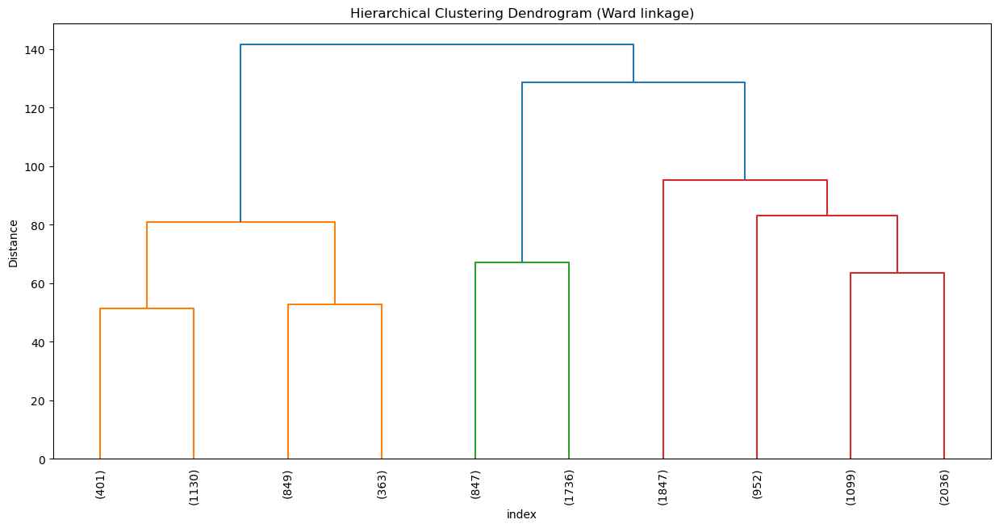

In [200]:

# Perform hierarchical clustering
wardlink = linkage(df_copy.drop(columns=['Churn']), method='ward', metric='euclidean')

# Plot the dendrogram
plt.figure(figsize=(15, 7))
dend = dendrogram(wardlink, truncate_mode='lastp', p=10, leaf_rotation=90, leaf_font_size=10)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('index')
plt.ylabel('Distance')
plt.show()

# Create clusters based on the number of clusters
clusters_maxclust = fcluster(wardlink, 4, criterion='maxclust')
df_copy['clusters_maxclust'] = clusters_maxclust

# Create clusters based on distance
clusters_distance = fcluster(wardlink, 85, criterion='distance')
df_copy['clusters_distance'] = clusters_distance

### Kmean-CLustering

In [202]:
# Within-Cluster Sum of Squares (WSS) calculation for Elbow Plot
wss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=123)
    kmeans.fit(df_copy.drop(columns=['Churn']))
    wss.append(kmeans.inertia_)

wss

[187207.50346358793,
 151825.410867079,
 138526.65751535876,
 134393.66357314782,
 133232.76537151323,
 125360.48446853418,
 119211.61013023689,
 117366.30737494533,
 114389.14102182245,
 113194.62536520373]

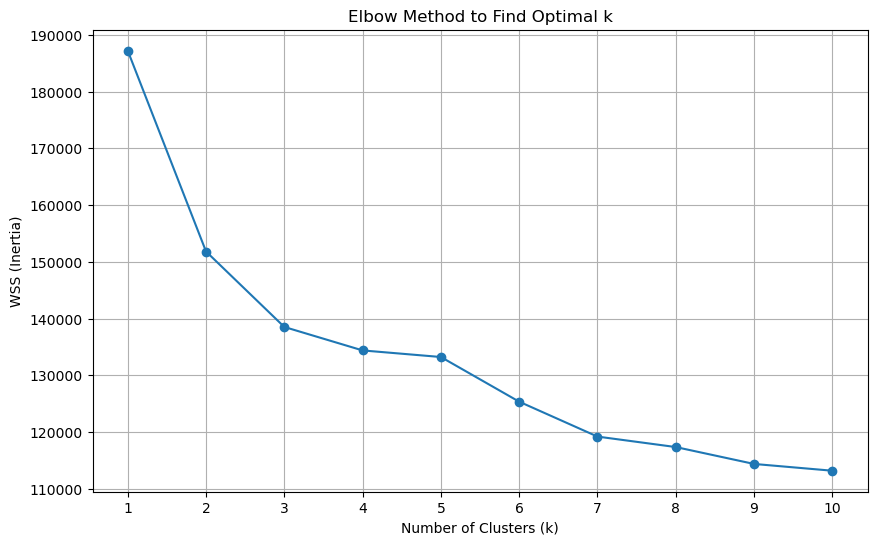

In [203]:
# Elbow Plot to determine the optimal number of clusters
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wss, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WSS (Inertia)')
plt.title('Elbow Method to Find Optimal k')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

In [204]:
# Silhouette Score to evaluate the quality of clustering
ss = {1: 0}
for i in range(2, 11):
    clust = KMeans(n_clusters=i, init='k-means++', random_state=123)
    y = clust.fit_predict(df_copy.drop(columns=['Churn']))
    s = silhouette_score(df_copy.drop(columns=['Churn']), y)
    ss[i] = round(s, 5)
    print(f"The Average Silhouette Score for {i} clusters is {ss[i]}")



The Average Silhouette Score for 2 clusters is 0.18095
The Average Silhouette Score for 3 clusters is 0.157
The Average Silhouette Score for 4 clusters is 0.14509
The Average Silhouette Score for 5 clusters is 0.10974
The Average Silhouette Score for 6 clusters is 0.09832
The Average Silhouette Score for 7 clusters is 0.09555
The Average Silhouette Score for 8 clusters is 0.0933
The Average Silhouette Score for 9 clusters is 0.09061
The Average Silhouette Score for 10 clusters is 0.08901


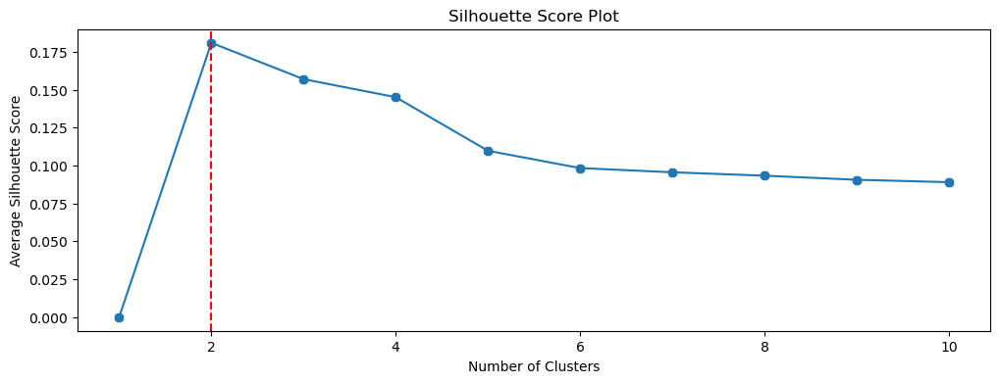

In [205]:
# Plotting Silhouette Scores
optimal_k = max(ss, key=ss.get)
fig, ax = plt.subplots(figsize=(12, 4))
plt.plot(list(ss.keys()), list(ss.values()), marker='8')
ax.axvline(x=optimal_k, color='red', linestyle='--')
plt.title('Silhouette Score Plot')
plt.xlabel('Number of Clusters')
plt.ylabel('Average Silhouette Score')
plt.show()



In [206]:
# Applying K-Means with optimal k based on Silhouette Score
kmeans = KMeans(n_clusters=optimal_k, random_state=123)
labels = kmeans.fit_predict(df_copy.drop(columns=['Churn']))
df_copy['Kmeans'] = labels


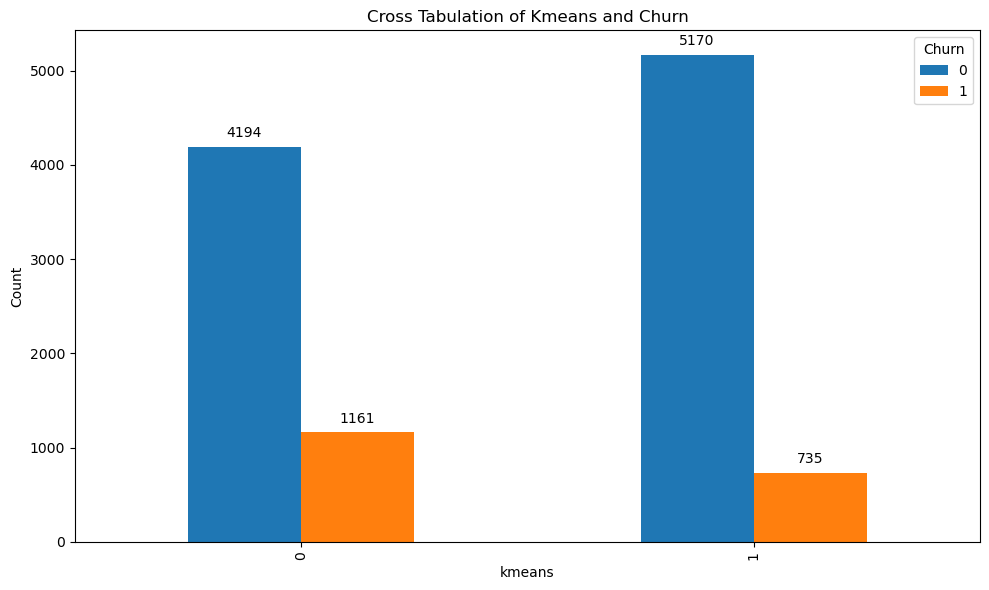

In [207]:

# Cross-tabulation to analyze clusters vs churn
crosstab_data = pd.crosstab(df_copy['Kmeans'], df_copy['Churn'])

# Plotting the crosstab data as a bar plot
ax = crosstab_data.plot(kind='bar', figsize=(10, 6))
ax.set_title('Cross Tabulation of Kmeans and Churn')
ax.set_xlabel('kmeans')
ax.set_ylabel('Count')

# Annotating values on top of the bars
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.tight_layout()
plt.show()

In [208]:
df_copy.head()

,Tenure,CC_Contacted_LY,rev_per_month,CC_Agent_Score,Service_Score,Complain_ly,Account_user_count,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,...,account_segment_Regular Plus,account_segment_Super,account_segment_Super Plus,Marital_Status_Married,Marital_Status_Single,Login_device_Mobile,Churn,clusters_maxclust,clusters_distance,Kmeans
0,-0.699363,-1.375600,1.249484,-0.772983,0.134508,1.582612,-0.742646,-1.382120,-0.431307,0.106133,...,0,1,0,0,1,1,1,2,2,0
1,-1.145091,-1.143070,0.579565,-0.048194,0.134508,1.582612,0.319919,-0.317598,-1.338485,-1.281898,...,1,0,0,0,1,1,1,2,2,0
2,-1.145091,1.414758,0.244605,-0.048194,-1.247341,1.582612,0.319919,-0.583728,-1.338485,-0.449080,...,1,0,0,0,1,1,1,2,2,0
3,-1.145091,-0.329216,0.914524,1.401386,-1.247341,-0.631867,0.319919,1.811447,-1.338485,-0.449080,...,0,1,0,0,1,1,1,3,3,1
4,-1.145091,-0.678011,-0.760274,1.401386,-1.247341,-0.631867,-0.742646,-1.382120,-0.431307,-0.449080,...,1,0,0,0,1,1,1,4,4,1


In [209]:
df_copy.head()

,Tenure,CC_Contacted_LY,rev_per_month,CC_Agent_Score,Service_Score,Complain_ly,Account_user_count,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,...,account_segment_Regular Plus,account_segment_Super,account_segment_Super Plus,Marital_Status_Married,Marital_Status_Single,Login_device_Mobile,Churn,clusters_maxclust,clusters_distance,Kmeans
0,-0.699363,-1.375600,1.249484,-0.772983,0.134508,1.582612,-0.742646,-1.382120,-0.431307,0.106133,...,0,1,0,0,1,1,1,2,2,0
1,-1.145091,-1.143070,0.579565,-0.048194,0.134508,1.582612,0.319919,-0.317598,-1.338485,-1.281898,...,1,0,0,0,1,1,1,2,2,0
2,-1.145091,1.414758,0.244605,-0.048194,-1.247341,1.582612,0.319919,-0.583728,-1.338485,-0.449080,...,1,0,0,0,1,1,1,2,2,0
3,-1.145091,-0.329216,0.914524,1.401386,-1.247341,-0.631867,0.319919,1.811447,-1.338485,-0.449080,...,0,1,0,0,1,1,1,3,3,1
4,-1.145091,-0.678011,-0.760274,1.401386,-1.247341,-0.631867,-0.742646,-1.382120,-0.431307,-0.449080,...,1,0,0,0,1,1,1,4,4,1


In [210]:
df1 = df_copy[['Churn','Kmeans','clusters_maxclust','clusters_distance']]

In [211]:
df1.head()

,Churn,Kmeans,clusters_maxclust,clusters_distance
0,1,0,2,2
1,1,0,2,2
2,1,0,2,2
3,1,1,3,3
4,1,1,4,4


In [212]:
df1[df1.Churn ==1]

,Churn,Kmeans,clusters_maxclust,clusters_distance
0,1,0,2,2
1,1,0,2,2
2,1,0,2,2
3,1,1,3,3
4,1,1,4,4
...,...,...,...,...
11228,1,1,3,3
11232,1,0,2,2
11234,1,0,1,1
11242,1,1,3,3


In [213]:
df1[df1.Churn ==0]

,Churn,Kmeans,clusters_maxclust,clusters_distance
26,0,1,3,3
27,0,0,2,2
28,0,0,1,1
29,0,0,1,1
30,0,1,4,4
...,...,...,...,...
11255,0,1,4,4
11256,0,0,1,1
11257,0,0,2,2
11258,0,0,1,1


# END OF PROJECT NOTE-1
For business Insight reference to the report

# PROJECT NOTES-2


In [216]:
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import roc_auc_score, roc_curve, classification_report, confusion_matrix 

In [217]:
scaled_X = scaled_df.drop(['Churn'], axis=1)
scaled_y = scaled_df['Churn']

# VIF:

In [219]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = scaled_X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif


In [220]:
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
18,account_segment_Regular Plus,5.338301
10,cashback,4.300283
13,Payment_Debit Card,3.653854
19,account_segment_Super,3.512520
21,Marital_Status_Married,3.420541
12,Payment_Credit Card,3.030998
23,Login_device_Mobile,2.795489
22,Marital_Status_Single,2.477961
16,Gender_Male,2.352846
14,Payment_E wallet,2.126314


In [221]:
X = scaled_X.drop('Login_device_Mobile', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
18,account_segment_Regular Plus,5.338301
10,cashback,4.300283
13,Payment_Debit Card,3.653854
19,account_segment_Super,3.512520
21,Marital_Status_Married,3.420541
12,Payment_Credit Card,3.030998
23,Login_device_Mobile,2.795489
22,Marital_Status_Single,2.477961
16,Gender_Male,2.352846
14,Payment_E wallet,2.126314


In [222]:
X = scaled_X.drop('Payment_E wallet', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
18,account_segment_Regular Plus,5.338301
10,cashback,4.300283
13,Payment_Debit Card,3.653854
19,account_segment_Super,3.512520
21,Marital_Status_Married,3.420541
12,Payment_Credit Card,3.030998
23,Login_device_Mobile,2.795489
22,Marital_Status_Single,2.477961
16,Gender_Male,2.352846
14,Payment_E wallet,2.126314


In [223]:
scaled_X = scaled_X.drop('Marital_Status_Married', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
18,account_segment_Regular Plus,4.979649
10,cashback,4.234028
13,Payment_Debit Card,3.325450
19,account_segment_Super,3.289149
12,Payment_Credit Card,2.771683
22,Login_device_Mobile,2.767844
16,Gender_Male,2.308441
11,City_Tier,2.078833
14,Payment_E wallet,2.062751
20,account_segment_Super Plus,1.984985


In [224]:
scaled_X = scaled_X.drop('Gender_Male', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
17,account_segment_Regular Plus,4.814029
10,cashback,4.226358
18,account_segment_Super,3.206614
13,Payment_Debit Card,3.179815
21,Login_device_Mobile,2.754913
12,Payment_Credit Card,2.671751
11,City_Tier,2.074109
14,Payment_E wallet,2.036057
19,account_segment_Super Plus,1.983176
16,account_segment_Regular,1.817810


In [225]:
scaled_X = scaled_X.drop('Service_Score', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
16,account_segment_Regular Plus,4.632365
9,cashback,4.015484
12,Payment_Debit Card,3.171009
17,account_segment_Super,3.170317
20,Login_device_Mobile,2.753875
11,Payment_Credit Card,2.660583
10,City_Tier,2.073743
13,Payment_E wallet,2.033782
18,account_segment_Super Plus,1.932692
15,account_segment_Regular,1.778252


In [226]:
scaled_X = X.drop('Account_user_count', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
16,account_segment_Regular Plus,5.101217
9,cashback,4.173232
17,account_segment_Super,3.327910
19,Marital_Status_Married,3.318001
21,Login_device_Mobile,2.724117
12,Payment_Debit Card,2.693887
20,Marital_Status_Single,2.428261
11,Payment_Credit Card,2.346088
14,Gender_Male,2.334342
18,account_segment_Super Plus,1.964563


In [227]:
scaled_X = scaled_X.drop('account_segment_Regular', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
15,account_segment_Regular Plus,4.943549
16,account_segment_Super,3.327768
18,Marital_Status_Married,3.317834
9,cashback,2.997482
20,Login_device_Mobile,2.722757
12,Payment_Debit Card,2.689486
19,Marital_Status_Single,2.428064
11,Payment_Credit Card,2.341169
14,Gender_Male,2.323119
10,City_Tier,1.665859


In [228]:
scaled_X = scaled_X.drop('CC_Agent_Score', axis = 1)
calc_vif(scaled_X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
14,account_segment_Regular Plus,4.941710
15,account_segment_Super,3.327714
17,Marital_Status_Married,3.315895
8,cashback,2.997463
19,Login_device_Mobile,2.717737
11,Payment_Debit Card,2.686814
18,Marital_Status_Single,2.426563
10,Payment_Credit Card,2.341149
13,Gender_Male,2.322320
9,City_Tier,1.665859


We have performed  VIF, One way ANOVA and chi-sqaure method and found out some variable are not needed in our dataset.


In [230]:
scaled_X.drop(columns=['Service_Score','rev_growth_yoy','coupon_used_for_payment','CC_Contacted_LY','rev_per_month','Complain_ly'], axis=1, inplace=True) 

# SMOTE

In [232]:
from imblearn.over_sampling import SMOTE 

In [233]:
X_train, X_test, y_train, y_test = train_test_split(scaled_X, scaled_y, test_size=0.30 , random_state=1) 

In [234]:
sm_scaled = SMOTE(random_state=1) 
X_train_resampled, y_train_resampled = sm_scaled.fit_resample(X_train, y_train)

In [235]:
X_train.shape

(7882, 14)

In [236]:
X_test.shape

(3378, 14)

In [237]:
y_train.shape

(7882,)

In [238]:
y_test.shape

(3378,)

In [239]:
#!pip install imbalanced-learn

In [240]:
#import statsmodels.api as sm

In [241]:
#from sklearn.impute import SimpleImputer 

# Linear Logistic Regression

In [243]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Initialize the Logistic Regression model
model1= LogisticRegression(random_state=1)


In [244]:
# Fit the model on the training data
model1.fit(X_train, y_train)

LogisticRegression(random_state=1)

In [245]:
# Make predictions on the test data
y_pred = model1.predict(X_test)

In [246]:
ytest_predict_prob = model1.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.505369,0.494631
1,0.357574,0.642426
2,0.905884,0.094116
3,0.574179,0.425821
4,0.979001,0.020999


In [247]:
coef=model1.coef_
coef

array([[-1.44555961, -0.25461341,  0.23423343,  0.23261735, -0.82760394,
        -0.59600832, -0.53723706,  0.11733433,  0.17151168, -0.96341139,
        -0.32062367, -0.32129805,  0.56578629, -0.29647326]])

In [248]:
feature_names=X_train.columns
feature_names

Index(['Tenure', 'Day_Since_CC_connect', 'cashback', 'City_Tier',
       'Payment_Credit Card', 'Payment_Debit Card', 'Payment_UPI',
       'Gender_Male', 'account_segment_Regular Plus', 'account_segment_Super',
       'account_segment_Super Plus', 'Marital_Status_Married',
       'Marital_Status_Single', 'Login_device_Mobile'],
      dtype='object')

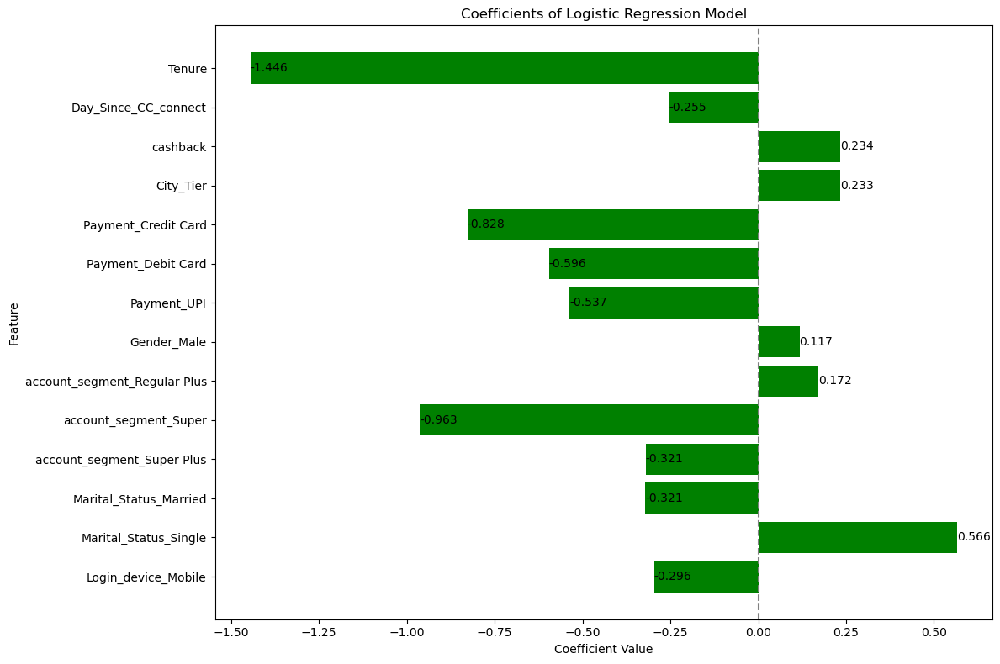

In [249]:
coef = model1.coef_[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Logistic Regression Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

# Add coefficient values on top of the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 3), va='center')

plt.tight_layout()
plt.show()


In [250]:
# Make predictions on the training data
y_train_pred = model1.predict(X_train)

# Classification report for training data
print("Classification Report for Training Data:")
print(classification_report(y_train, y_train_pred))

Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.70      0.29      0.41      1326

    accuracy                           0.86      7882
   macro avg       0.79      0.63      0.66      7882
weighted avg       0.84      0.86      0.83      7882



In [251]:
# Make predictions on the test data
y_test_pred = model1.predict(X_test)

# Classification report for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92      2808
           1       0.66      0.26      0.38       570

    accuracy                           0.85      3378
   macro avg       0.76      0.62      0.65      3378
weighted avg       0.83      0.85      0.83      3378



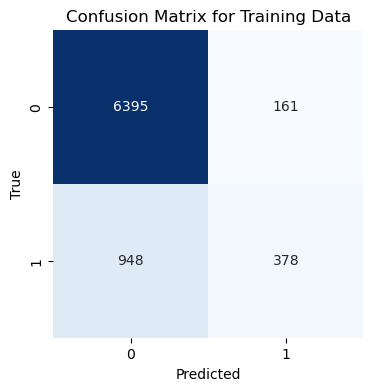

In [252]:
from sklearn.metrics import confusion_matrix

cm_train = confusion_matrix(y_train, y_train_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for Training Data')
plt.show()

In [253]:
cm_train 

array([[6395,  161],
       [ 948,  378]], dtype=int64)

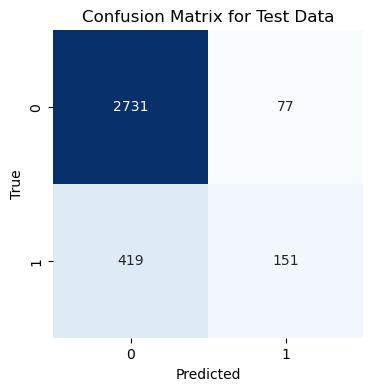

In [254]:
cm_test = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix for the test data as a heatmap
plt.figure(figsize=(4, 4))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for Test Data')
plt.show()

In [255]:
cm_test

array([[2731,   77],
       [ 419,  151]], dtype=int64)

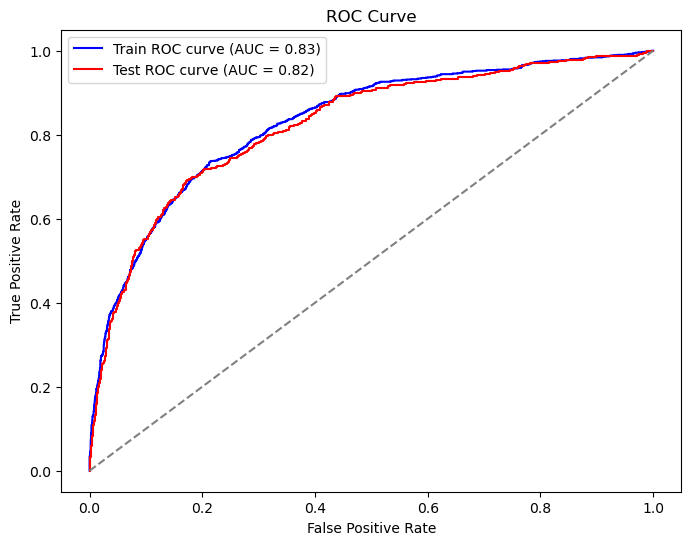

In [256]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate the probabilities for positive class for both train and test data
y_train_prob = model1.predict_proba(X_train)[:, 1]
y_test_prob = model1.predict_proba(X_test)[:, 1]

# Calculate the ROC curve values for both train and test data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)

# Calculate the AUC score for both train and test data
auc_train = roc_auc_score(y_train, y_train_prob)
auc_test = roc_auc_score(y_test, y_test_prob)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train ROC curve (AUC = {:.2f})'.format(auc_train), color='blue')
plt.plot(fpr_test, tpr_test, label='Test ROC curve (AUC = {:.2f})'.format(auc_test), color='red')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Linear Logistic Regression Hyper-tuned

In [258]:
model2 = LogisticRegression(random_state=1)
model2

LogisticRegression(random_state=1)

In [259]:
# Define the hyperparameters and their potential values for tuning
hyperparameters = {
    'penalty': ['l1', 'l2'], 
    'C': [0.01, 0.1, 1.0, 10.0],  
    'solver': ['liblinear', 'lbfgs', 'newton-cg', 'saga'], 
    'class_weight': [None, 'balanced'],  
    'max_iter': [100, 200, 500],  
    'dual': [False, True]}

In [260]:
from sklearn.model_selection import GridSearchCV
# Perform grid search using 5-fold cross-validation
grid_search = GridSearchCV(model2, hyperparameters, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1),
             param_grid={'C': [0.01, 0.1, 1.0, 10.0],
                         'class_weight': [None, 'balanced'],
                         'dual': [False, True], 'max_iter': [100, 200, 500],
                         'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'lbfgs', 'newton-cg', 'saga']},
             scoring='accuracy')

In [261]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'C': 10.0, 'class_weight': None, 'dual': True, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'} 

LogisticRegression(C=10.0, dual=True, random_state=1, solver='liblinear')


In [262]:
best_logreg = grid_search.best_estimator_

In [263]:
# Fit the best model on the training data
best_logreg.fit(X_train, y_train)

LogisticRegression(C=10.0, dual=True, random_state=1, solver='liblinear')

In [264]:
y_pred_train = best_logreg.predict(X_train)
y_pred_test = best_logreg.predict(X_test)

In [265]:
y_pred_test 

array([0, 1, 0, ..., 1, 1, 0], dtype=int64)

In [266]:
coef1=best_logreg.coef_
coef1

array([[-1.44353656, -0.25254378,  0.24085038,  0.22282337, -0.8336042 ,
        -0.60024723, -0.5544774 ,  0.11506983,  0.15674683, -0.97535854,
        -0.34881692, -0.31438385,  0.56695708, -0.29894956]])

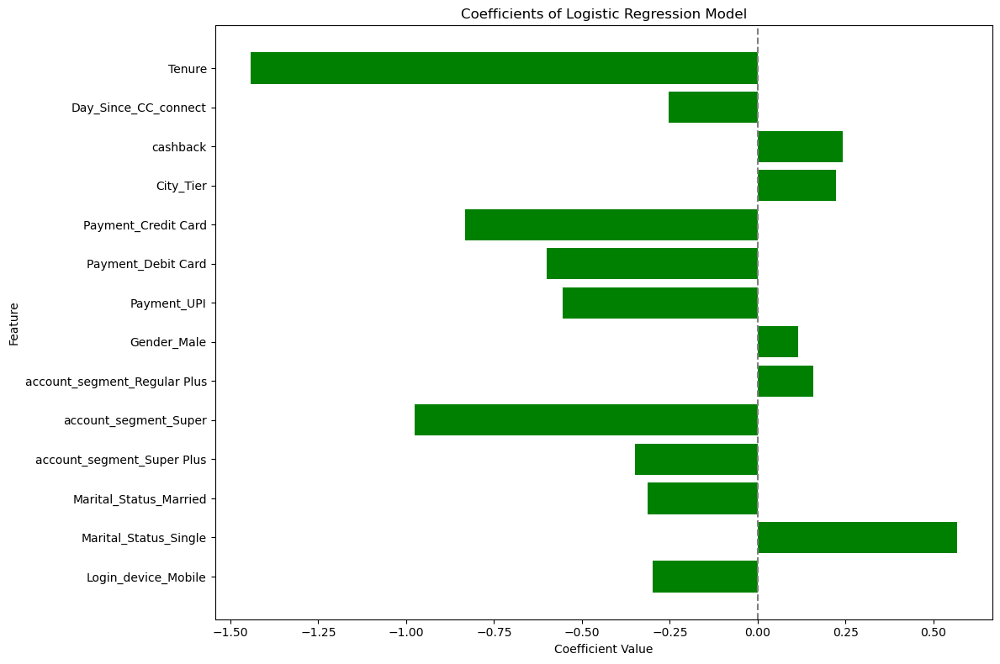

In [267]:
import matplotlib.pyplot as plt

coef = coef1[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Logistic Regression Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

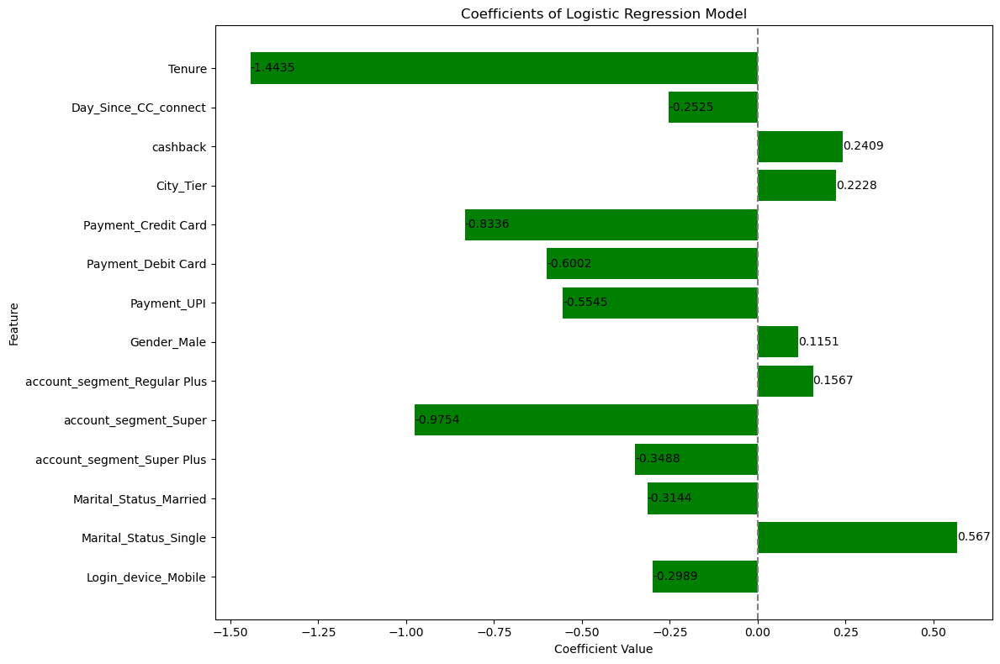

In [268]:
import matplotlib.pyplot as plt

coef = coef1[0]
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Logistic Regression Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()


In [269]:
print("Classification report for training data:")
print(classification_report(y_train, y_pred_train))

Classification report for training data:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.71      0.28      0.40      1326

    accuracy                           0.86      7882
   macro avg       0.79      0.63      0.66      7882
weighted avg       0.84      0.86      0.83      7882



In [270]:
print("Classification report for test data:")
print(classification_report(y_test, y_pred_test))

Classification report for test data:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      2808
           1       0.68      0.26      0.37       570

    accuracy                           0.85      3378
   macro avg       0.77      0.62      0.65      3378
weighted avg       0.83      0.85      0.83      3378



In [271]:
# Compute the confusion matrices
cm_train = confusion_matrix(y_train, y_pred_train)
cm_test = confusion_matrix(y_test, y_pred_test)

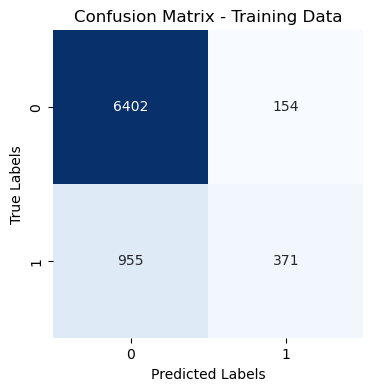

In [272]:
plt.figure(figsize=(4, 4))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Training Data')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

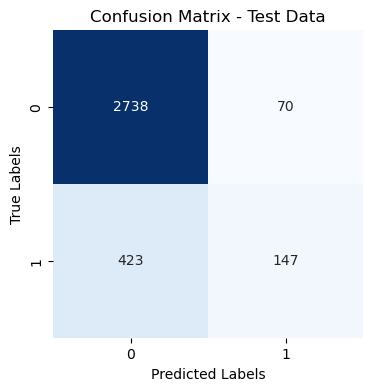

In [273]:
plt.figure(figsize=(4, 4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

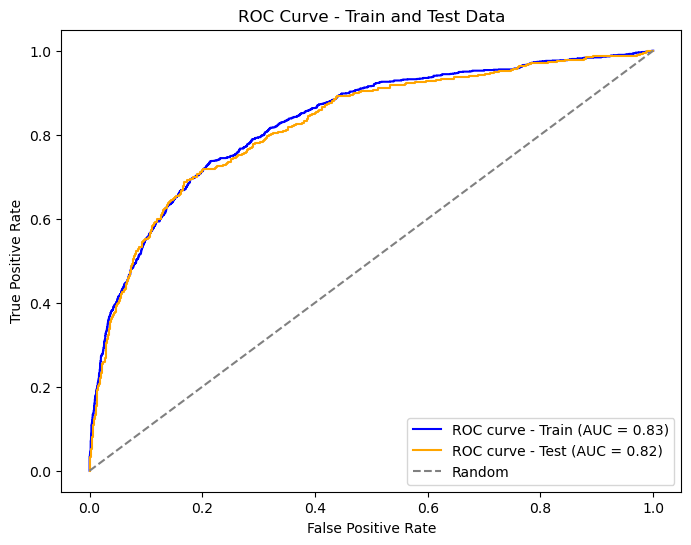

In [274]:
from sklearn.metrics import roc_curve, roc_auc_score

# Get the predicted probabilities for the positive class (class 1)
y_pred_prob_train = best_logreg.predict_proba(X_train)[:, 1]
y_pred_prob_test = best_logreg.predict_proba(X_test)[:, 1]

# Compute the ROC curve and AUC for the training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_pred_prob_train)
roc_auc_train = roc_auc_score(y_train, y_pred_prob_train)

# Compute the ROC curve and AUC for the test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_prob_test)
roc_auc_test = roc_auc_score(y_test, y_pred_prob_test)

# Plot the ROC curves for both training and test data
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='ROC curve - Train (AUC = {:.2f})'.format(roc_auc_train), color='blue')
plt.plot(fpr_test, tpr_test, label='ROC curve - Test (AUC = {:.2f})'.format(roc_auc_test), color='orange')
plt.plot([0, 1], [0, 1], 'k--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Train and Test Data')
plt.legend(loc='lower right')
plt.show()

# Linear Logistic Regression SMOTE

In [276]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=1)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [277]:
#Build and fit the Logistic Regression model on the oversampled training data
model3 = LogisticRegression(random_state=1)
model3.fit(X_train_resampled, y_train_resampled)

LogisticRegression(random_state=1)

In [278]:
X_train_resampled.shape

(13112, 14)

In [279]:
y_pred_test = model3.predict(X_test)
y_pred_test

array([1, 1, 0, ..., 1, 1, 1], dtype=int64)

In [280]:
coef2=best_logreg.coef_
coef2

array([[-1.44353656, -0.25254378,  0.24085038,  0.22282337, -0.8336042 ,
        -0.60024723, -0.5544774 ,  0.11506983,  0.15674683, -0.97535854,
        -0.34881692, -0.31438385,  0.56695708, -0.29894956]])

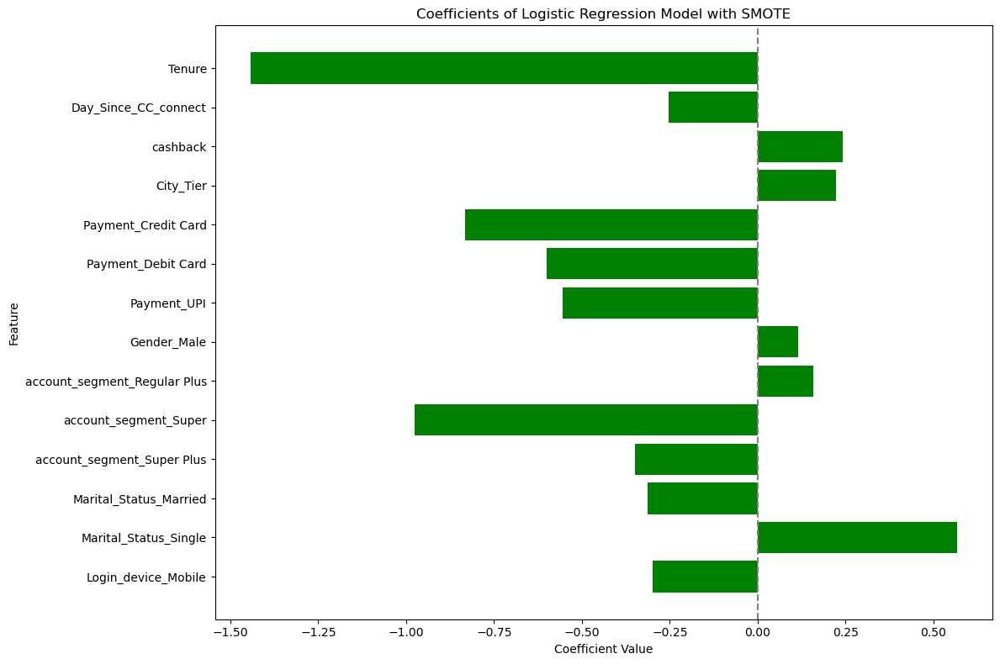

In [281]:
coef = coef2[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Logistic Regression Model with SMOTE')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

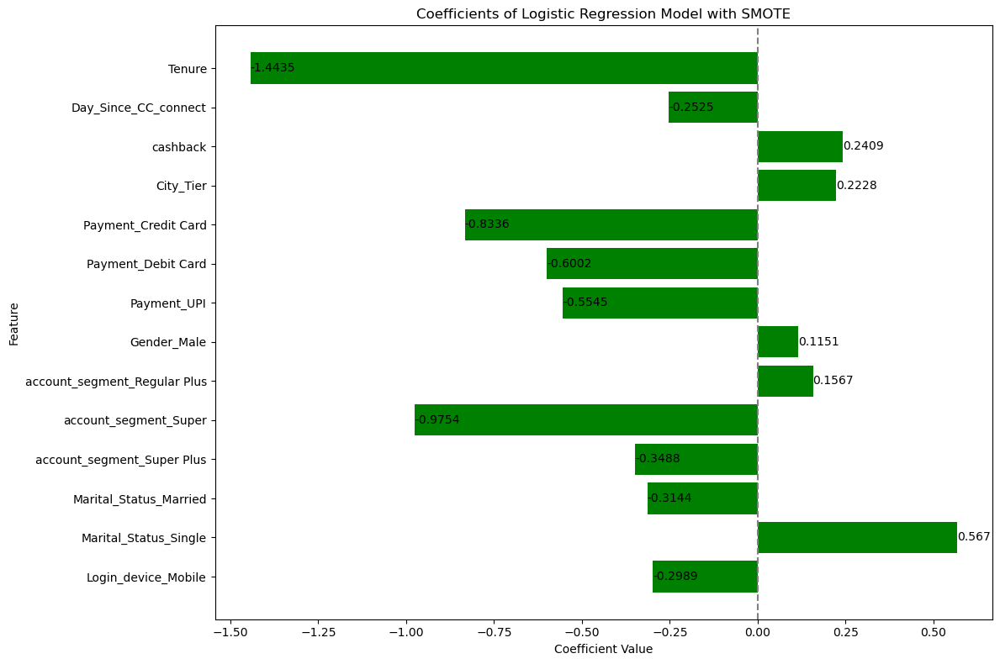

In [282]:
coef = coef2[0]
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Logistic Regression Model with SMOTE')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()


In [283]:
y_pred_train = model3.predict(X_train_resampled)
y_pred_test = model3.predict(X_test)

In [284]:
# Classification Report-Train
print("Classification Report (Train Data):\n", classification_report(y_train_resampled, y_pred_train))

Classification Report (Train Data):
               precision    recall  f1-score   support

           0       0.77      0.72      0.75      6556
           1       0.74      0.79      0.76      6556

    accuracy                           0.75     13112
   macro avg       0.76      0.75      0.75     13112
weighted avg       0.76      0.75      0.75     13112



In [285]:
# Classification Report-Test
print("Classification Report (Test Data):\n", classification_report(y_test, y_pred_test))

Classification Report (Test Data):
               precision    recall  f1-score   support

           0       0.94      0.72      0.81      2808
           1       0.36      0.76      0.48       570

    accuracy                           0.73      3378
   macro avg       0.65      0.74      0.65      3378
weighted avg       0.84      0.73      0.76      3378



Confusion Matrix (Train Data):
 [[4710 1846]
 [1369 5187]]


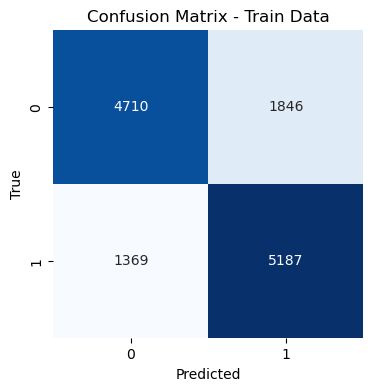

In [286]:
conf_matrix_train = confusion_matrix(y_train_resampled, y_pred_train)
print("Confusion Matrix (Train Data):\n", conf_matrix_train)

# Plot confusion matrix for train data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Train Data')
plt.show()

Confusion Matrix (Test Data):
 [[2026  782]
 [ 139  431]]


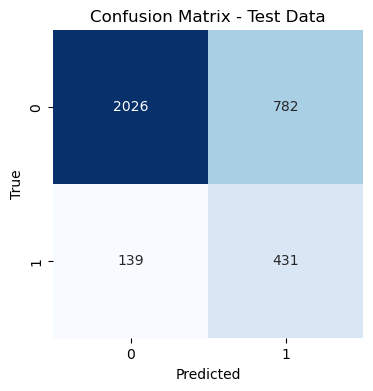

In [287]:
conf_matrix_test = confusion_matrix(y_test, y_pred_test)
print("Confusion Matrix (Test Data):\n", conf_matrix_test)

# Plot confusion matrix for test data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Test Data')
plt.show()

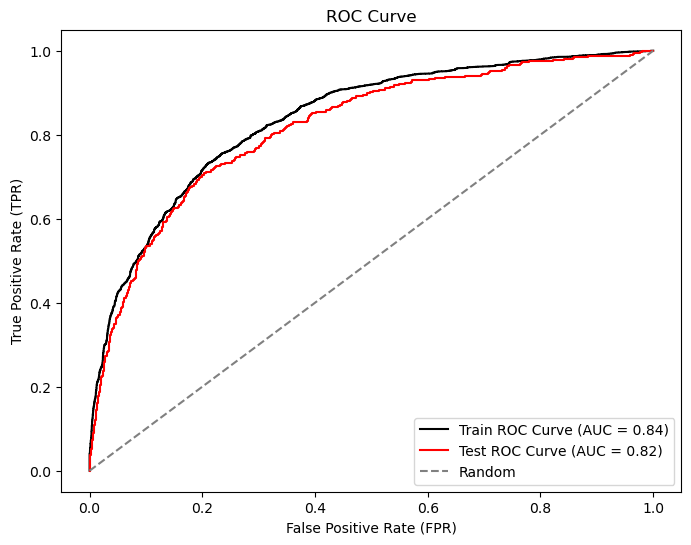

In [288]:
y_prob_train = model3.predict_proba(X_train_resampled)[:, 1]
y_prob_test = model3.predict_proba(X_test)[:, 1]


fpr_train, tpr_train, thresholds_train = roc_curve(y_train_resampled, y_prob_train)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_prob_test)


auc_train = roc_auc_score(y_train_resampled, y_prob_train)
auc_test = roc_auc_score(y_test, y_prob_test)


plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train ROC Curve (AUC = {auc_train:.2f})', color='black')
plt.plot(fpr_test, tpr_test, label=f'Test ROC Curve (AUC = {auc_test:.2f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', color='gray', label='Random')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Linear DIscriminant Analysis

In [290]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [291]:
model4= LinearDiscriminantAnalysis()
model4

LinearDiscriminantAnalysis()

In [292]:
model4.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [293]:
y_pred_test = model4.predict(X_test)
y_pred_train = model4.predict(X_train)

In [294]:
ytest_predict_prob = model4.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.513728,0.486272
1,0.377527,0.622473
2,0.893128,0.106872
3,0.557352,0.442648
4,0.978753,0.021247


In [295]:
coef=model4.coef_
coef

array([[-0.96027771, -0.25736371,  0.12224609,  0.23154197, -0.86256127,
        -0.71099294, -0.66178061,  0.07187795,  0.40937592, -0.82402769,
        -0.07833687, -0.24407616,  0.81762196, -0.32603494]])

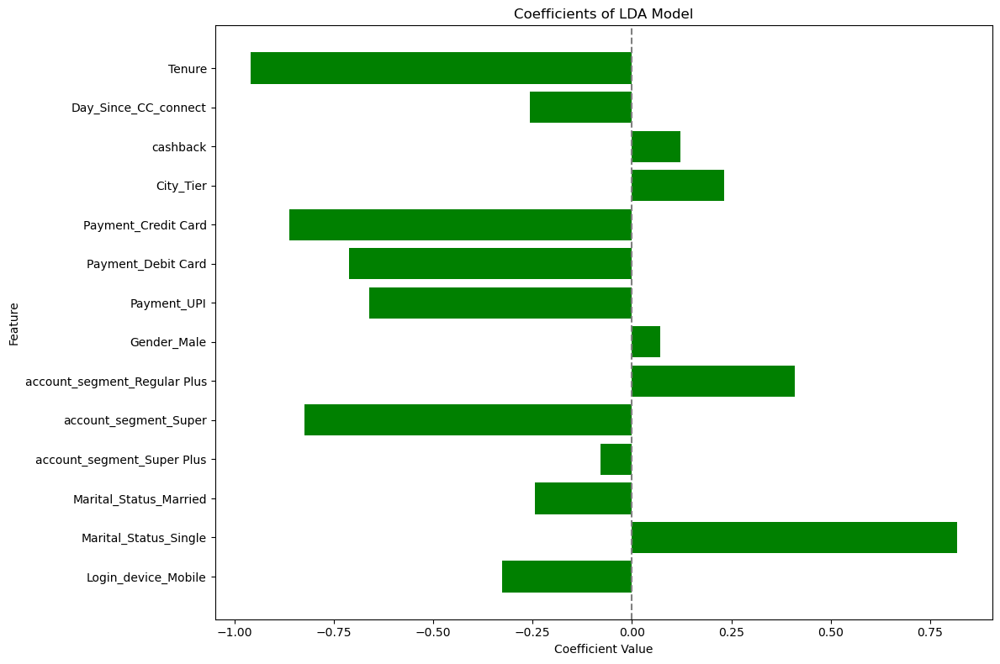

In [296]:
coef = model4.coef_[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of LDA Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

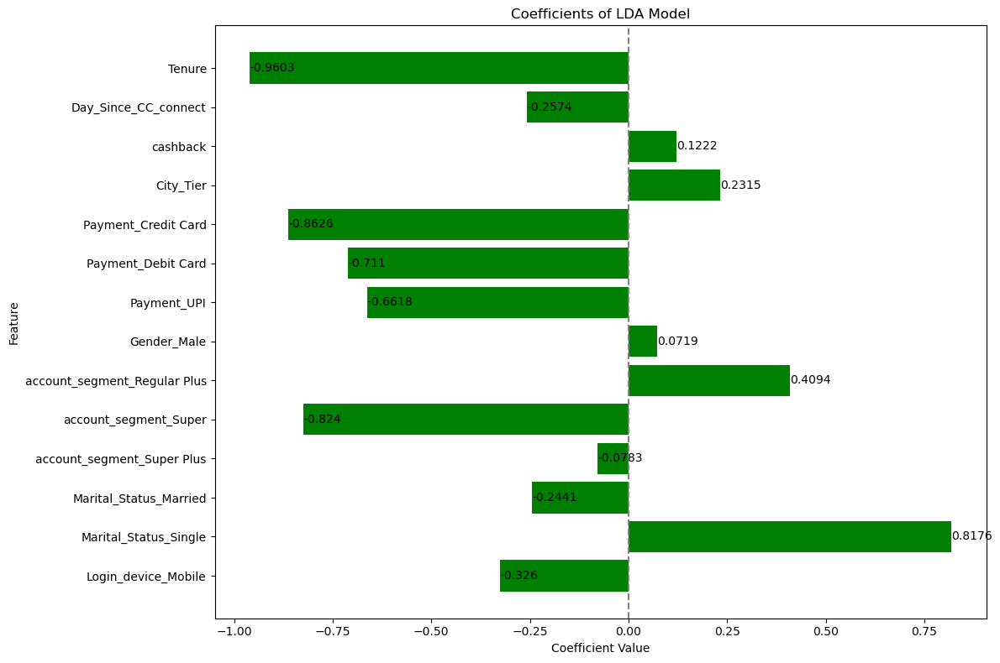

In [297]:
coef = model4.coef_[0]
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of LDA Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

In [298]:
print("Classification Report for Train Data:")
print(classification_report(y_train, y_pred_train))

Classification Report for Train Data:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.68      0.26      0.37      1326

    accuracy                           0.85      7882
   macro avg       0.77      0.62      0.64      7882
weighted avg       0.84      0.85      0.83      7882



In [299]:
print("\nClassification Report for Test Data:")
print(classification_report(y_test, y_pred_test))


Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92      2808
           1       0.67      0.24      0.35       570

    accuracy                           0.85      3378
   macro avg       0.77      0.61      0.63      3378
weighted avg       0.83      0.85      0.82      3378



In [300]:
cm_train = confusion_matrix(y_train, y_pred_train)
cm_test = confusion_matrix(y_test, y_pred_test)

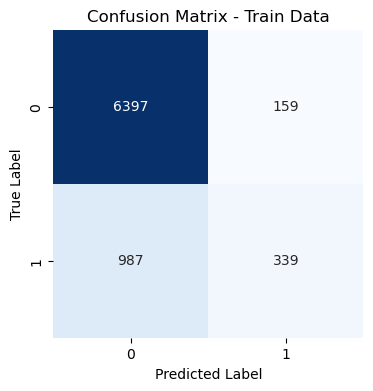

In [301]:
plt.figure(figsize=(4, 4))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Train Data")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

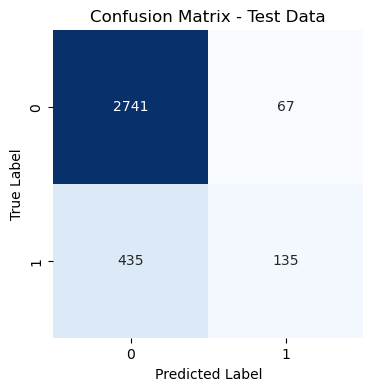

In [302]:
plt.figure(figsize=(4, 4))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Test Data")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

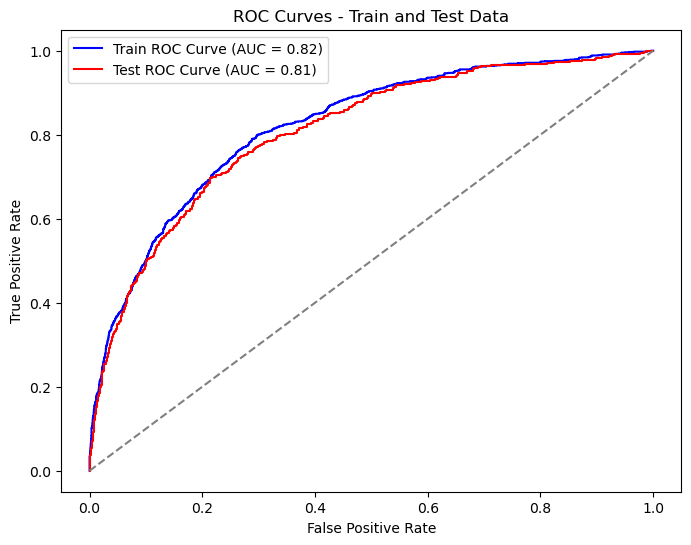

AUC Score - Train Data: 0.8199818917100797
AUC Score - Test Data: 0.8079884540410855


In [303]:
from sklearn.metrics import roc_curve, roc_auc_score

y_prob_train = model4.predict_proba(X_train)[:, 1]
y_prob_test = model4.predict_proba(X_test)[:, 1]

fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_prob_train)
auc_train = roc_auc_score(y_train, y_prob_train)

fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_prob_test)
auc_test = roc_auc_score(y_test, y_prob_test)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train ROC Curve (AUC = {auc_train:.2f})', color='b')
plt.plot(fpr_test, tpr_test, label=f'Test ROC Curve (AUC = {auc_test:.2f})', color='r')
plt.plot([0, 1], [0, 1], 'k--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves - Train and Test Data')
plt.legend()
plt.show()

print("AUC Score - Train Data:", auc_train)
print("AUC Score - Test Data:", auc_test)

# Linear Discriminant Analysis Hyper tuned

In [305]:
from sklearn.model_selection import GridSearchCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

model5 = LinearDiscriminantAnalysis()

In [306]:
param_grid = {
    'solver': ['svd', 'lsqr', 'eigen'],  
    'shrinkage': [None, 'auto', 0.0, 0.5, 1.0]  
}

In [307]:
grid_search = GridSearchCV(model5, param_grid, cv=5, scoring='accuracy')

In [308]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LinearDiscriminantAnalysis(),
             param_grid={'shrinkage': [None, 'auto', 0.0, 0.5, 1.0],
                         'solver': ['svd', 'lsqr', 'eigen']},
             scoring='accuracy')

In [309]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'shrinkage': 0.5, 'solver': 'lsqr'}


In [310]:
best_lda_model = grid_search.best_estimator_
best_lda_model

LinearDiscriminantAnalysis(shrinkage=0.5, solver='lsqr')

In [311]:
coef=best_lda_model.coef_
coef

array([[-1.25894853, -0.39242212, -0.07664982,  0.37271421, -0.27871593,
        -0.16929027, -0.038709  ,  0.06316347,  0.48448409, -0.60545739,
        -0.01423485, -0.45428001,  0.57555423, -0.20039673]])

In [312]:
X_train.columns

Index(['Tenure', 'Day_Since_CC_connect', 'cashback', 'City_Tier',
       'Payment_Credit Card', 'Payment_Debit Card', 'Payment_UPI',
       'Gender_Male', 'account_segment_Regular Plus', 'account_segment_Super',
       'account_segment_Super Plus', 'Marital_Status_Married',
       'Marital_Status_Single', 'Login_device_Mobile'],
      dtype='object')

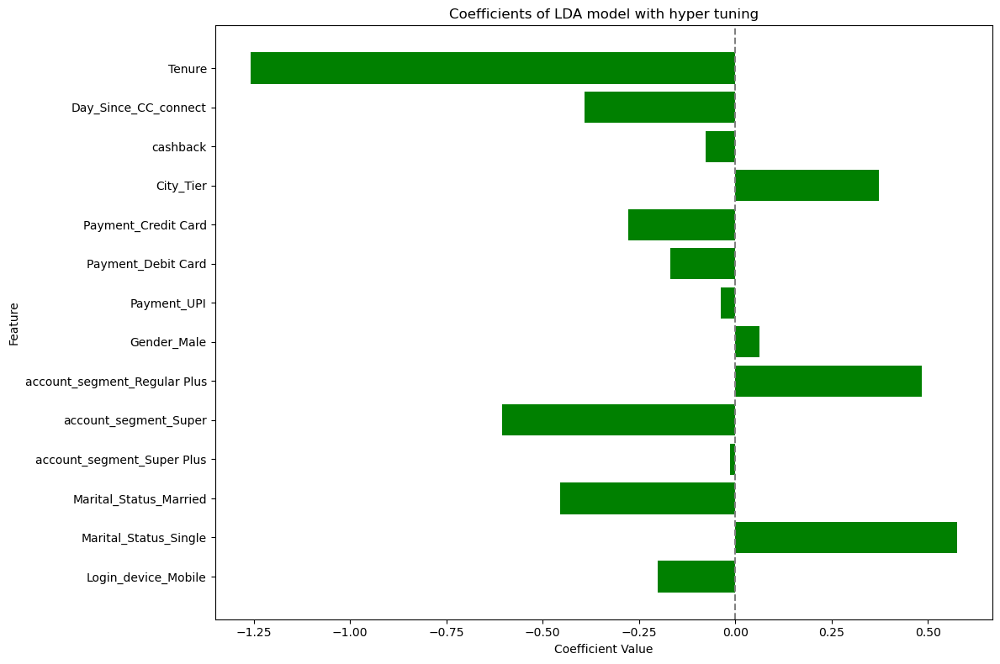

In [313]:
coef = best_lda_model.coef_[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of LDA model with hyper tuning')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

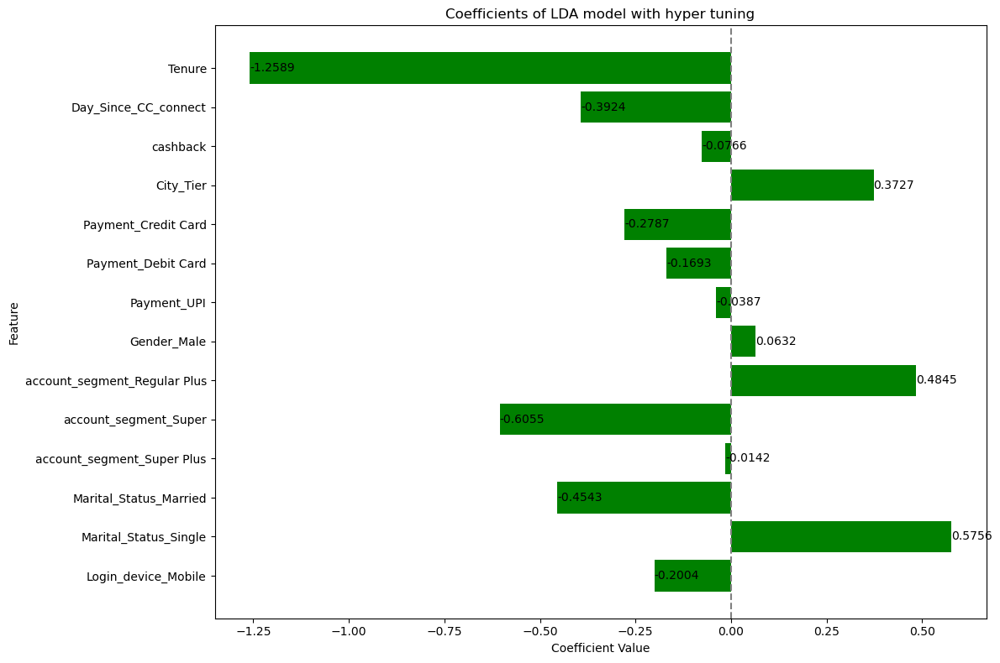

In [314]:
coef = best_lda_model.coef_[0]
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of LDA model with hyper tuning')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

In [315]:
y_train_pred = best_lda_model.predict(X_train)

print("Classification Report for Train Data:")
print(classification_report(y_train, y_train_pred))

Classification Report for Train Data:
              precision    recall  f1-score   support

           0       0.88      0.95      0.92      6556
           1       0.61      0.36      0.45      1326

    accuracy                           0.85      7882
   macro avg       0.75      0.66      0.69      7882
weighted avg       0.84      0.85      0.84      7882



In [316]:
y_test_pred = best_lda_model.predict(X_test)

print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.88      0.96      0.91      2808
           1       0.61      0.33      0.43       570

    accuracy                           0.85      3378
   macro avg       0.74      0.64      0.67      3378
weighted avg       0.83      0.85      0.83      3378



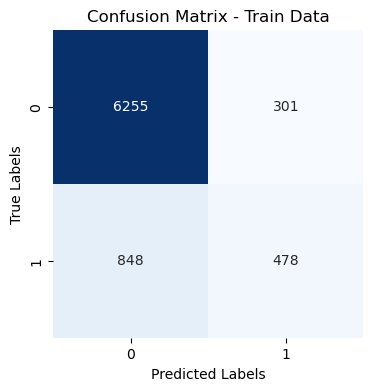

In [317]:
confusion_train = confusion_matrix(y_train, y_train_pred)

# Plot the confusion matrix for the training data
plt.figure(figsize=(4, 4))
sns.heatmap(confusion_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix - Train Data')
plt.show()

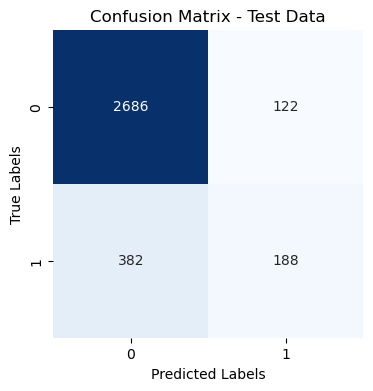

In [318]:
confusion_test = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(confusion_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix - Test Data')
plt.show()

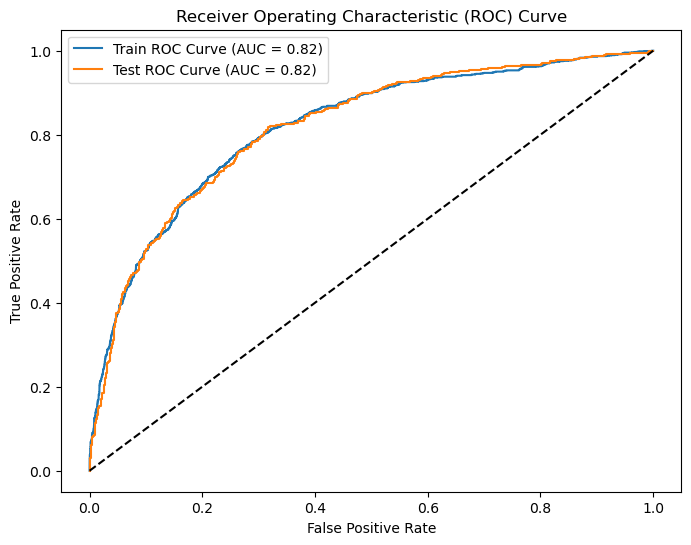

In [319]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

y_train_prob = best_lda_model.predict_proba(X_train)[:, 1]

fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
roc_auc_train = roc_auc_score(y_train, y_train_prob)

y_test_prob = best_lda_model.predict_proba(X_test)[:, 1]

fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
roc_auc_test = roc_auc_score(y_test, y_test_prob)

# Plot the ROC curve for both train and test data on a single graph
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train ROC Curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, label=f'Test ROC Curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Linear DIscriminant Analysis SMOTE

In [321]:
smote = SMOTE(random_state=1)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [322]:
#Build and fit the Logistic Regression model on the oversampled training data
model6 = LinearDiscriminantAnalysis()
model6.fit(X_train_resampled, y_train_resampled)

LinearDiscriminantAnalysis()

In [323]:
X_train_resampled.shape

(13112, 14)

In [324]:
X_train.shape

(7882, 14)

In [325]:
y_pred_test = model6.predict(X_test)
y_pred_test

array([1, 1, 0, ..., 1, 1, 1], dtype=int64)

In [326]:
coef = model6.coef_
coef

array([[-1.23670674, -0.27242711,  0.12421362,  0.20009414, -0.87854702,
        -0.77238349, -0.78900941,  0.09109661,  0.12935424, -1.1515041 ,
        -0.45929648, -0.70081724,  0.29378917, -0.3263617 ]])

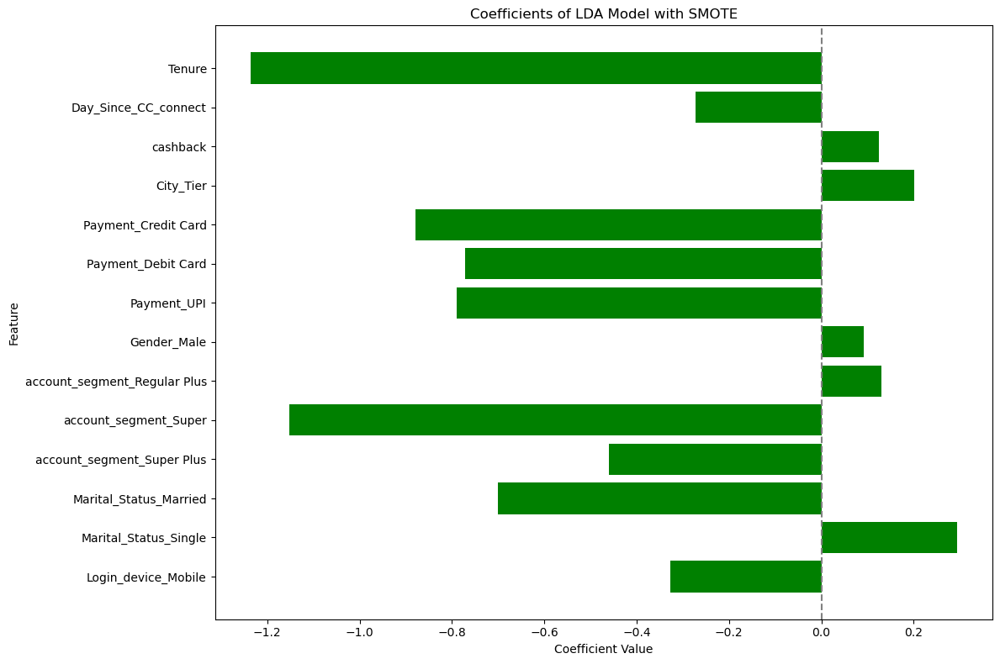

In [327]:
coef = coef[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of LDA Model with SMOTE')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [328]:
coef = model6.coef_
coef

array([[-1.23670674, -0.27242711,  0.12421362,  0.20009414, -0.87854702,
        -0.77238349, -0.78900941,  0.09109661,  0.12935424, -1.1515041 ,
        -0.45929648, -0.70081724,  0.29378917, -0.3263617 ]])

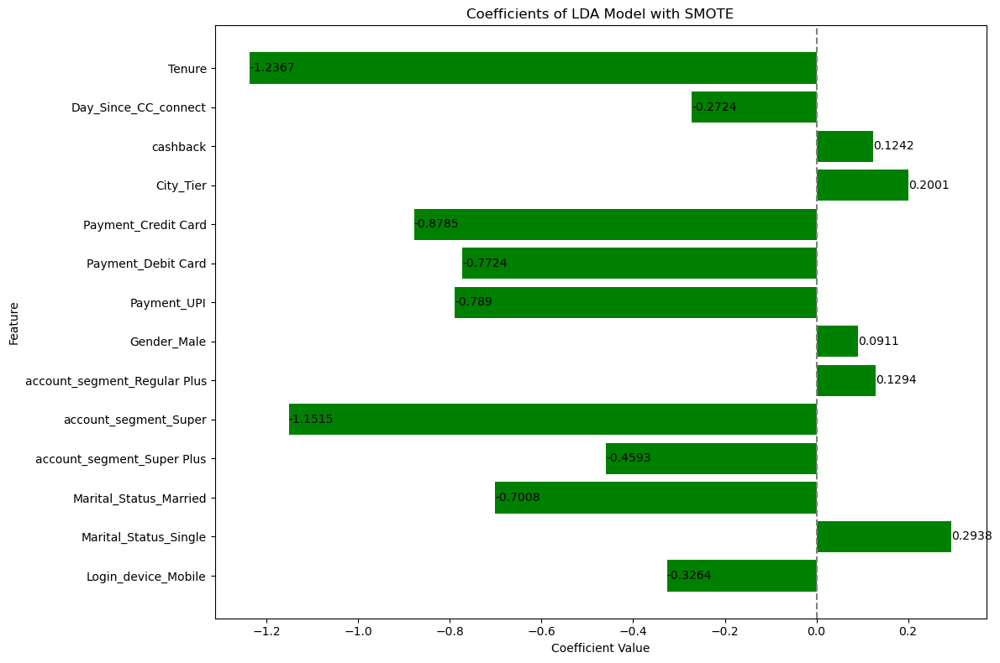

In [329]:
coef = coef[0]

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of LDA Model with SMOTE')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

In [330]:
y_pred_train = model6.predict(X_train_resampled)
y_pred_test = model6.predict(X_test)

In [331]:
# Classification Report-Train
print("Classification Report (Train Data):\n", classification_report(y_train_resampled, y_pred_train))

Classification Report (Train Data):
               precision    recall  f1-score   support

           0       0.78      0.70      0.74      6556
           1       0.73      0.80      0.76      6556

    accuracy                           0.75     13112
   macro avg       0.76      0.75      0.75     13112
weighted avg       0.76      0.75      0.75     13112



In [332]:
# Classification Report-Test
print("Classification Report (Test Data):\n", classification_report(y_test, y_pred_test))

Classification Report (Test Data):
               precision    recall  f1-score   support

           0       0.94      0.70      0.80      2808
           1       0.34      0.76      0.47       570

    accuracy                           0.71      3378
   macro avg       0.64      0.73      0.64      3378
weighted avg       0.84      0.71      0.75      3378



Confusion Matrix (Train Data):
 [[4600 1956]
 [1289 5267]]


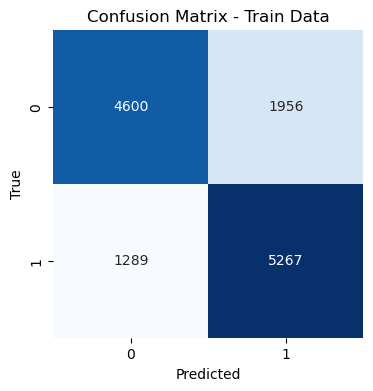

In [333]:
conf_matrix_train = confusion_matrix(y_train_resampled, y_pred_train)
print("Confusion Matrix (Train Data):\n", conf_matrix_train)

# Plot confusion matrix for train data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Train Data')
plt.show()

Confusion Matrix (Test Data):
 [[1976  832]
 [ 135  435]]


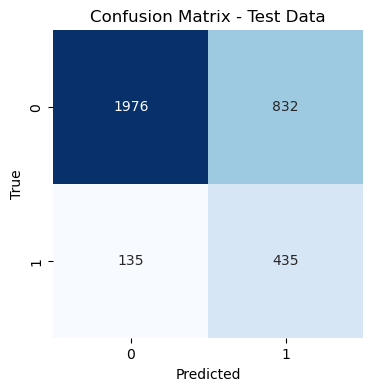

In [334]:
conf_matrix_test = confusion_matrix(y_test, y_pred_test)
print("Confusion Matrix (Test Data):\n", conf_matrix_test)

# Plot confusion matrix for test data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Test Data')
plt.show()

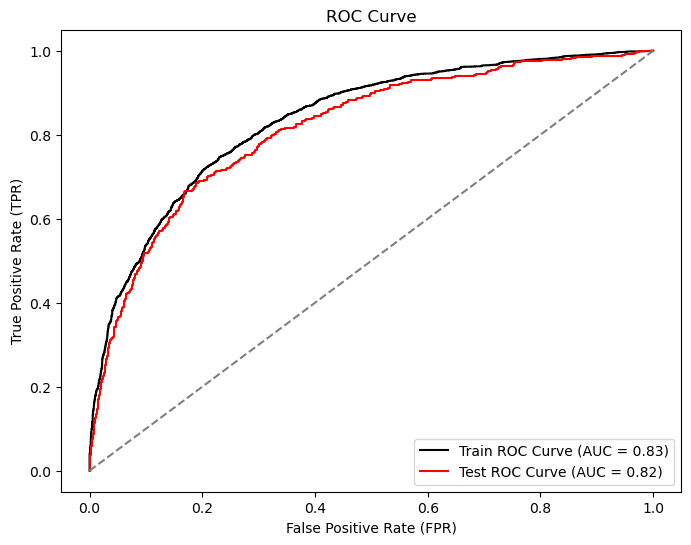

In [335]:
y_prob_train = model6.predict_proba(X_train_resampled)[:, 1]
y_prob_test = model6.predict_proba(X_test)[:, 1]


fpr_train, tpr_train, thresholds_train = roc_curve(y_train_resampled, y_prob_train)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_prob_test)


auc_train = roc_auc_score(y_train_resampled, y_prob_train)
auc_test = roc_auc_score(y_test, y_prob_test)


plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train ROC Curve (AUC = {auc_train:.2f})', color='black')
plt.plot(fpr_test, tpr_test, label=f'Test ROC Curve (AUC = {auc_test:.2f})', color='red')
plt.plot([0, 1], [0, 1], 'k--', color='gray')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# KNN model method

In [337]:
from sklearn.neighbors import KNeighborsClassifier

In [338]:
KNN_model = KNeighborsClassifier()
KNN_model.fit(X_train,y_train)

KNeighborsClassifier()

In [339]:
from sklearn import metrics

## Performance Matrix on train data set
y_train_predict = KNN_model.predict(X_train)
model_score = KNN_model.score(X_train, y_train)
print(model_score)
print(metrics.confusion_matrix(y_train, y_train_predict))
print(metrics.classification_report(y_train, y_train_predict))

0.9448109616848516
[[6410  146]
 [ 289 1037]]
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      6556
           1       0.88      0.78      0.83      1326

    accuracy                           0.94      7882
   macro avg       0.92      0.88      0.90      7882
weighted avg       0.94      0.94      0.94      7882



In [340]:
## Performance Matrix on test data set
y_test_predict = KNN_model.predict(X_test)
model_score = KNN_model.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.9085257548845471
[[2716   92]
 [ 217  353]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2808
           1       0.79      0.62      0.70       570

    accuracy                           0.91      3378
   macro avg       0.86      0.79      0.82      3378
weighted avg       0.90      0.91      0.90      3378



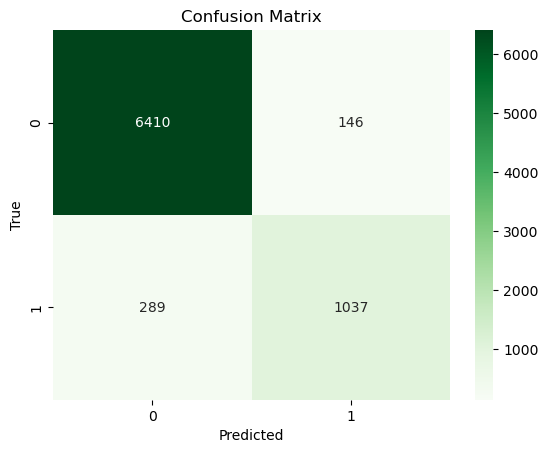

In [341]:
cm = metrics.confusion_matrix(y_train, y_train_predict)

sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

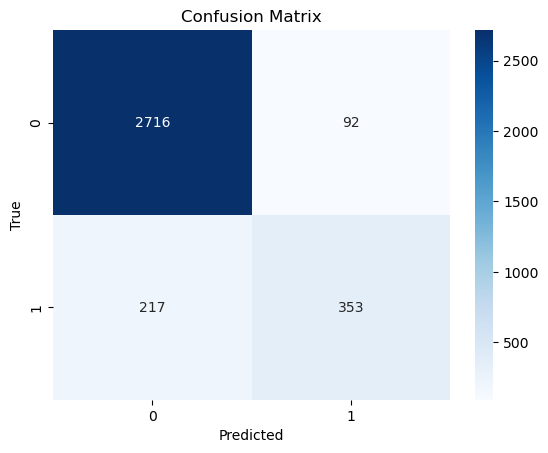

In [342]:
cm = metrics.confusion_matrix(y_test, y_test_predict)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [343]:
pred_prob_train = KNN_model.predict_proba(X_train)
pred_prob_test = KNN_model.predict_proba(X_test)

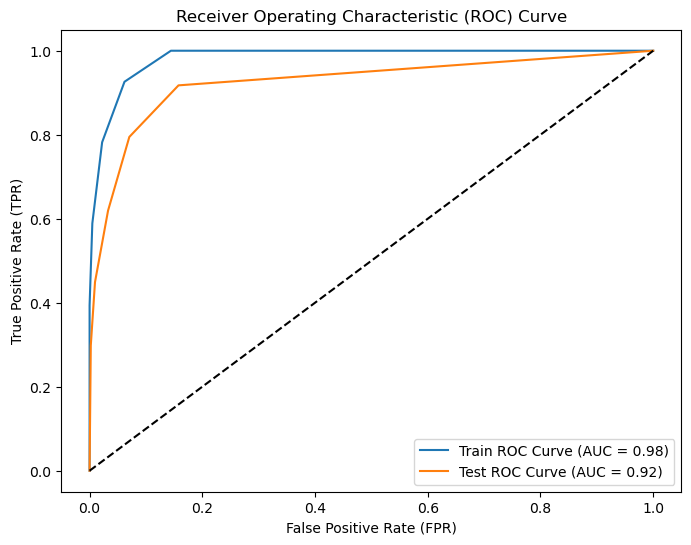

In [344]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculate the predicted probabilities for both train and test data
pred_prob_train = KNN_model.predict_proba(X_train)[:, 1]
pred_prob_test = KNN_model.predict_proba(X_test)[:, 1]

# Calculate the ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, pred_prob_train)
roc_auc_train = roc_auc_score(y_train, pred_prob_train)

# Calculate the ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train ROC Curve (AUC = {:.2f})'.format(roc_auc_train))
plt.plot(fpr_test, tpr_test, label='Test ROC Curve (AUC = {:.2f})'.format(roc_auc_test))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# KNN- Model Method Hyper tuned

In [346]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

param_grid = {'n_neighbors': [3, 5, 7, 9,11,13,15],
              'weights': ['uniform', 'distance'],
              'algorithm': ['auto','ball_tree', 'kd_tree', 'brute']}

knn = KNeighborsClassifier()

grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [347]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [348]:
best_model

KNeighborsClassifier(algorithm='brute', weights='distance')

In [349]:
print("Best Hyperparameters:")
print(best_params)

Best Hyperparameters:
{'algorithm': 'brute', 'n_neighbors': 5, 'weights': 'distance'}


In [350]:
y_pred_train = best_model.predict(X_train)
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report (Train):\n", classification_report_train)

Classification Report (Train):
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



In [351]:
y_pred_test = best_model.predict(X_test)
classification_report_test = classification_report(y_test, y_pred_test)

print("Classification Report (Test):\n", classification_report_test)

Classification Report (Test):
               precision    recall  f1-score   support

           0       0.95      0.98      0.96      2808
           1       0.86      0.77      0.81       570

    accuracy                           0.94      3378
   macro avg       0.91      0.87      0.89      3378
weighted avg       0.94      0.94      0.94      3378



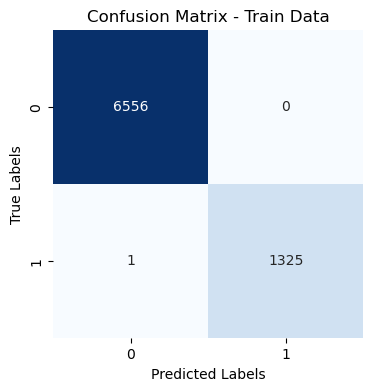

In [352]:
cm_train = confusion_matrix(y_train, y_pred_train)

# Plot the confusion matrix for the train data using a heatmap
plt.figure(figsize=(4, 4))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Train Data')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

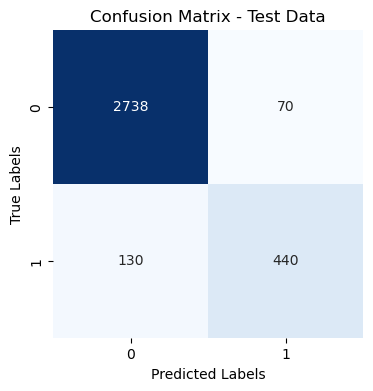

In [353]:
cm_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(4, 4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

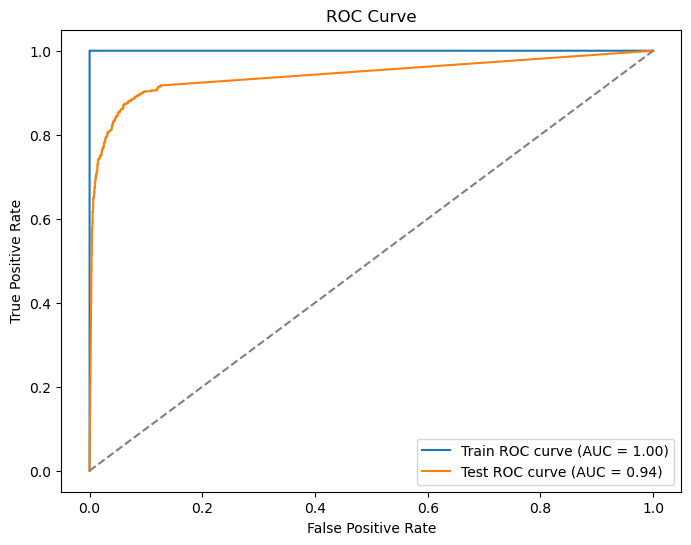

In [354]:
from sklearn.metrics import roc_curve, roc_auc_score


y_pred_prob_train = best_model.predict_proba(X_train)[:, 1]
y_pred_prob_test = best_model.predict_proba(X_test)[:, 1]

# Calculate the false positive rate (fpr) and true positive rate (tpr) for the train set
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_pred_prob_train)

# Calculate the false positive rate (fpr) and true positive rate (tpr) for the test set
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_prob_test)

auc_train = roc_auc_score(y_train, y_pred_prob_train)

auc_test = roc_auc_score(y_test, y_pred_prob_test)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train ROC curve (AUC = {:.2f})'.format(auc_train))
plt.plot(fpr_test, tpr_test, label='Test ROC curve (AUC = {:.2f})'.format(auc_test))
plt.plot([0, 1], [0, 1], 'k--', color='gray')  # Diagonal line (random classifier)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


# KNN-Model Method SMOTE

In [356]:
from imblearn.over_sampling import SMOTE

In [357]:
sm = SMOTE(random_state=1)
X_train_res , y_train_res = sm.fit_resample(X_train,y_train)

In [358]:
X_train_res.shape

(13112, 14)

In [359]:
from sklearn.neighbors import KNeighborsClassifier

KNN_SM_model=KNeighborsClassifier()
KNN_SM_model.fit(X_train_res,y_train_res)

KNeighborsClassifier()

In [360]:
from sklearn import metrics
## Performance Matrix on train data set
y_train_predict = KNN_SM_model.predict(X_train_res)
model_score = KNN_SM_model.score(X_train_res, y_train_res)
print(model_score)
print(metrics.confusion_matrix(y_train_res, y_train_predict))
print(metrics.classification_report(y_train_res, y_train_predict))

0.9617907260524711
[[6144  412]
 [  89 6467]]
              precision    recall  f1-score   support

           0       0.99      0.94      0.96      6556
           1       0.94      0.99      0.96      6556

    accuracy                           0.96     13112
   macro avg       0.96      0.96      0.96     13112
weighted avg       0.96      0.96      0.96     13112



In [361]:
## Performance Matrix on test data set
y_test_predict = KNN_SM_model.predict(X_test)
model_score = KNN_SM_model.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.9031971580817052
[[2568  240]
 [  87  483]]
              precision    recall  f1-score   support

           0       0.97      0.91      0.94      2808
           1       0.67      0.85      0.75       570

    accuracy                           0.90      3378
   macro avg       0.82      0.88      0.84      3378
weighted avg       0.92      0.90      0.91      3378



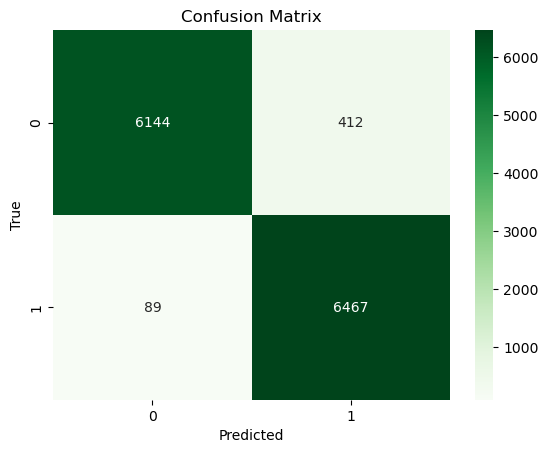

In [362]:
y_train_predict = KNN_SM_model.predict(X_train_res)

cm = metrics.confusion_matrix(y_train_res, y_train_predict)

sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

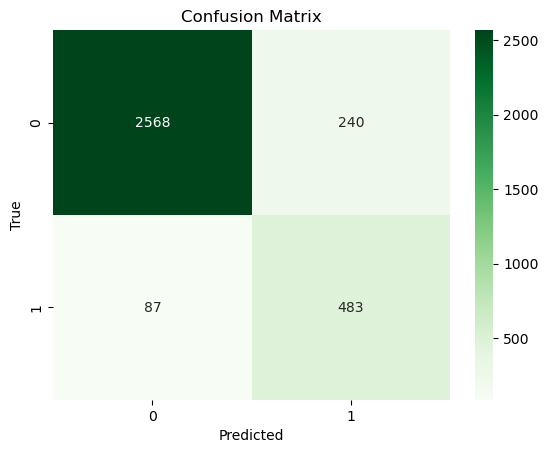

In [363]:
y_test_predict = KNN_SM_model.predict(X_test)


cm = metrics.confusion_matrix(y_test, y_test_predict)


sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [364]:
pred_prob_train = KNN_SM_model.predict_proba(X_train)
pred_prob_test= KNN_SM_model.predict_proba(X_test)

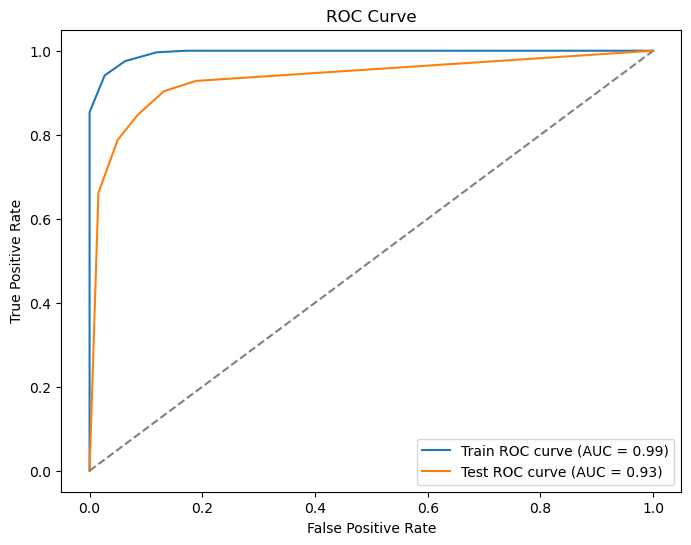

In [365]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate the predicted probabilities for both train and test sets
y_pred_prob_train = KNN_SM_model.predict_proba(X_train)[:, 1]
y_pred_prob_test = KNN_SM_model.predict_proba(X_test)[:, 1]

# Calculate the false positive rate (fpr) and true positive rate (tpr) for the train set
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_pred_prob_train)

# Calculate the false positive rate (fpr) and true positive rate (tpr) for the test set
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_prob_test)

# Calculate the AUC for the train set
auc_train = roc_auc_score(y_train, y_pred_prob_train)

# Calculate the AUC for the test set
auc_test = roc_auc_score(y_test, y_pred_prob_test)

# Plot the ROC curve for both train and test sets
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train ROC curve (AUC = {:.2f})'.format(auc_train))
plt.plot(fpr_test, tpr_test, label='Test ROC curve (AUC = {:.2f})'.format(auc_test))
plt.plot([0, 1], [0, 1], 'k--', color='gray')  # Diagonal line (random classifier)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Navie Bayes Method

In [367]:
from sklearn.naive_bayes import GaussianNB

In [368]:
NB_model = GaussianNB()
NB_model.fit(X_train,y_train)

GaussianNB()

In [369]:
y_train_predict = NB_model.predict(X_train)
model_score = NB_model.score(X_train, y_train)                      
print(model_score)
print(metrics.confusion_matrix(y_train, y_train_predict))          
print(metrics.classification_report(y_train, y_train_predict))

0.7597056584623192
[[5166 1390]
 [ 504  822]]
              precision    recall  f1-score   support

           0       0.91      0.79      0.85      6556
           1       0.37      0.62      0.46      1326

    accuracy                           0.76      7882
   macro avg       0.64      0.70      0.65      7882
weighted avg       0.82      0.76      0.78      7882



In [370]:
## Performance Matrix on test data set
y_test_predict = NB_model.predict(X_test)
model_score = NB_model.score(X_test, y_test)          
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))         
print(metrics.classification_report(y_test, y_test_predict))

0.7584369449378331
[[2227  581]
 [ 235  335]]
              precision    recall  f1-score   support

           0       0.90      0.79      0.85      2808
           1       0.37      0.59      0.45       570

    accuracy                           0.76      3378
   macro avg       0.64      0.69      0.65      3378
weighted avg       0.81      0.76      0.78      3378



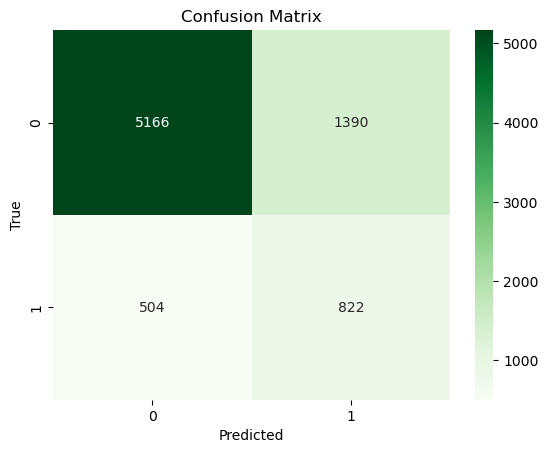

In [371]:
cm = metrics.confusion_matrix(y_train, y_train_predict)

sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

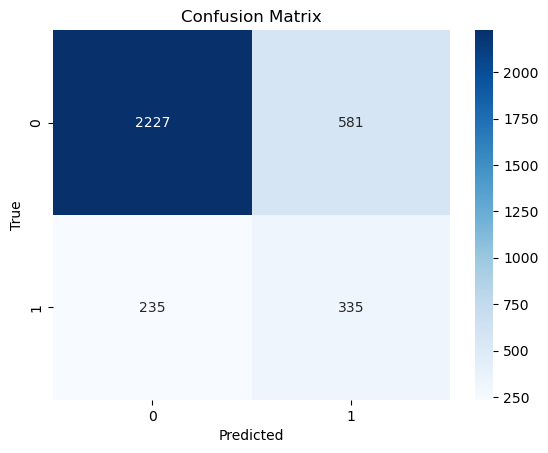

In [372]:
cm = metrics.confusion_matrix(y_test, y_test_predict)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [373]:
pred_prob_train = NB_model.predict_proba(X_train)
pred_prob_test = NB_model.predict_proba(X_test)

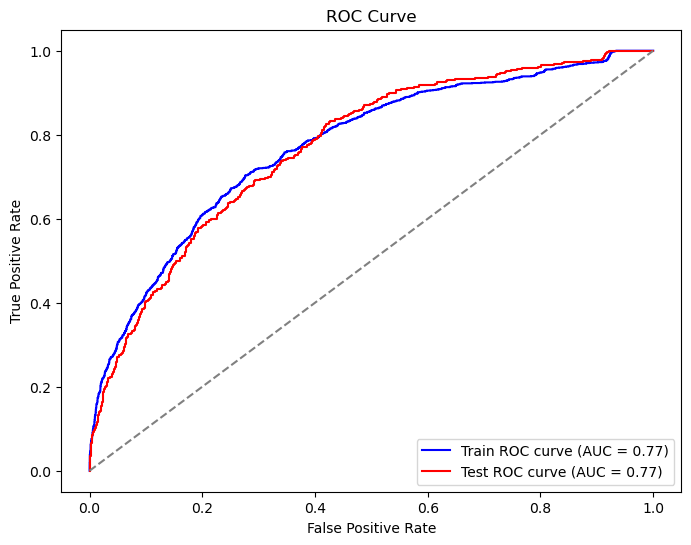

In [374]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Assuming you have already trained the Naïve Bayes model and stored it in 'NB_model'

# Get predicted probabilities for both train and test data
pred_prob_train = NB_model.predict_proba(X_train)
pred_prob_test = NB_model.predict_proba(X_test)

# Calculate ROC curve for train data
fpr_train, tpr_train, _ = roc_curve(y_train, pred_prob_train[:, 1])
roc_auc_train = roc_auc_score(y_train, pred_prob_train[:, 1])

# Calculate ROC curve for test data
fpr_test, tpr_test, _ = roc_curve(y_test, pred_prob_test[:, 1])
roc_auc_test = roc_auc_score(y_test, pred_prob_test[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='b', label='Train ROC curve (AUC = {:.2f})'.format(roc_auc_train))
plt.plot(fpr_test, tpr_test, color='r', label='Test ROC curve (AUC = {:.2f})'.format(roc_auc_test))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Navie Bayes Method Hyper tuned

In [376]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# define the model
gnb = GaussianNB()

# define the parameter grid
param_grid = {'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05]}

# perform grid search cross-validation
grid_search = GridSearchCV(estimator=gnb, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05]},
             scoring='accuracy')

In [377]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'var_smoothing': 1e-09} 

GaussianNB()


In [378]:
# Get the best Naive Bayes model from the grid search
best_model = grid_search.best_estimator_

# Make predictions on the training data using the best model
y_pred_train = best_model.predict(X_train)

# Print the classification report for the training data
print("Classification Report (Train):\n", classification_report(y_train, y_pred_train))

Classification Report (Train):
               precision    recall  f1-score   support

           0       0.91      0.79      0.85      6556
           1       0.37      0.62      0.46      1326

    accuracy                           0.76      7882
   macro avg       0.64      0.70      0.65      7882
weighted avg       0.82      0.76      0.78      7882



In [379]:
# Make predictions on the test data using the best model
y_pred_test = best_model.predict(X_test)

# Print the classification report for the test data
print("Classification Report (Test):\n", classification_report(y_test, y_pred_test))

Classification Report (Test):
               precision    recall  f1-score   support

           0       0.90      0.79      0.85      2808
           1       0.37      0.59      0.45       570

    accuracy                           0.76      3378
   macro avg       0.64      0.69      0.65      3378
weighted avg       0.81      0.76      0.78      3378



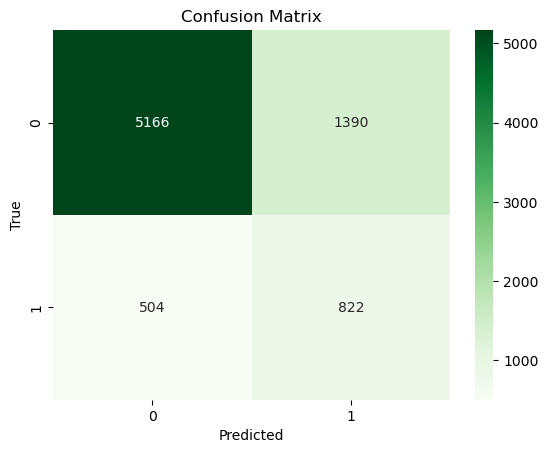

In [380]:
cm = metrics.confusion_matrix(y_train, y_pred_train)

sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

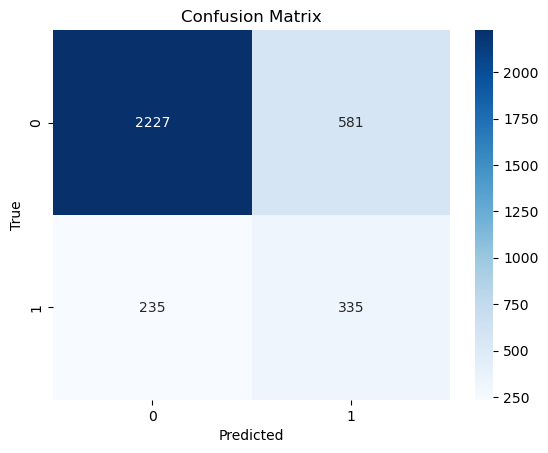

In [381]:
cm = metrics.confusion_matrix(y_test, y_pred_test)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

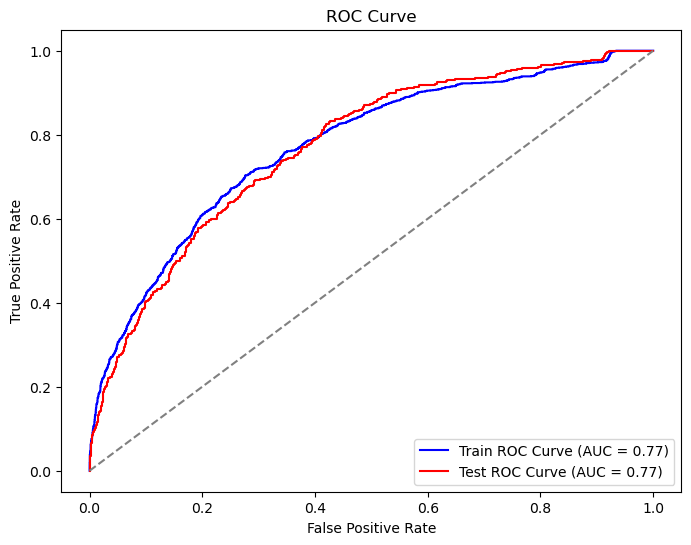

In [382]:
from sklearn.metrics import roc_curve, roc_auc_score

# Get the predicted probabilities for the positive class (churn = 1) from the best model
y_pred_prob_train = best_model.predict_proba(X_train)[:, 1]
y_pred_prob_test = best_model.predict_proba(X_test)[:, 1]

# Compute the ROC curve for the training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_pred_prob_train)

# Compute the ROC curve for the test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_prob_test)

# Calculate the AUC score for the training data
auc_train = roc_auc_score(y_train, y_pred_prob_train)

# Calculate the AUC score for the test data
auc_test = roc_auc_score(y_test, y_pred_prob_test)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train ROC Curve (AUC = {:.2f})'.format(auc_train), color='blue')
plt.plot(fpr_test, tpr_test, label='Test ROC Curve (AUC = {:.2f})'.format(auc_test), color='red')
plt.plot([0, 1], [0, 1], 'k--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


# Navie Bayes Method SMOTE

In [384]:
NB_SM_model = GaussianNB()
NB_SM_model.fit(X_train_res, y_train_res)

GaussianNB()

In [385]:
X_train_res.shape

(13112, 14)

In [386]:
## Performance Matrix on train data set with SMOTE
y_train_predict = NB_SM_model.predict(X_train_res)
model_score = NB_SM_model.score(X_train_res, y_train_res)
print(model_score)
print(metrics.confusion_matrix(y_train_res, y_train_predict))
print(metrics.classification_report(y_train_res ,y_train_predict))

0.7024862721171447
[[3984 2572]
 [1329 5227]]
              precision    recall  f1-score   support

           0       0.75      0.61      0.67      6556
           1       0.67      0.80      0.73      6556

    accuracy                           0.70     13112
   macro avg       0.71      0.70      0.70     13112
weighted avg       0.71      0.70      0.70     13112



In [387]:
## Performance Matrix on test data set
y_test_predict = NB_SM_model.predict(X_test)
model_score = NB_SM_model.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.6429840142095915
[[1731 1077]
 [ 129  441]]
              precision    recall  f1-score   support

           0       0.93      0.62      0.74      2808
           1       0.29      0.77      0.42       570

    accuracy                           0.64      3378
   macro avg       0.61      0.70      0.58      3378
weighted avg       0.82      0.64      0.69      3378



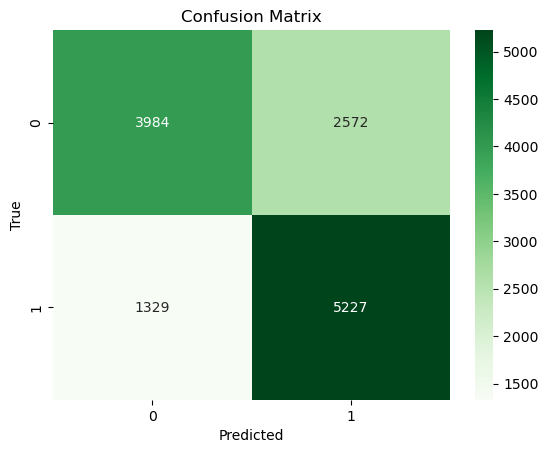

In [388]:
y_train_predict = NB_SM_model.predict(X_train_res)

cm = metrics.confusion_matrix(y_train_res, y_train_predict)

sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

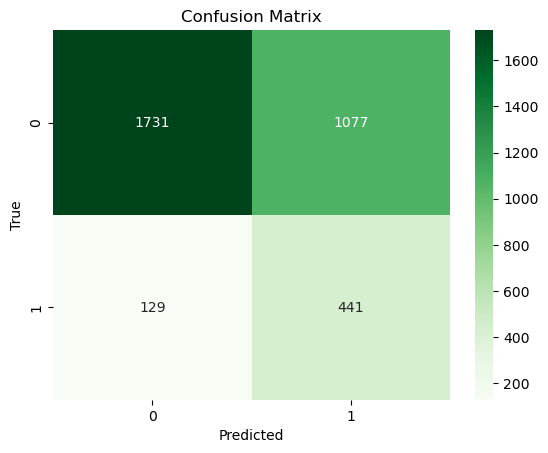

In [389]:
y_test_predict = NB_SM_model.predict(X_test)


cm = metrics.confusion_matrix(y_test, y_test_predict)


sns.heatmap(cm, annot=True, cmap='Greens', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [390]:
pred_prob_train = NB_SM_model.predict_proba(X_train)
pred_prob_test= NB_SM_model.predict_proba(X_test)

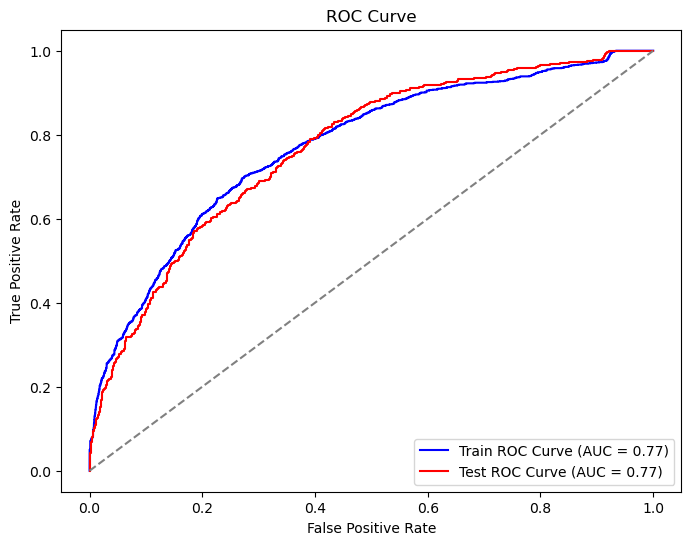

In [391]:
from sklearn.metrics import roc_curve, roc_auc_score

# Get the predicted probabilities for the positive class (churn = 1) from the Naive Bayes model with SMOTE
y_pred_prob_train = NB_SM_model.predict_proba(X_train)[:, 1]
y_pred_prob_test = NB_SM_model.predict_proba(X_test)[:, 1]

# Compute the ROC curve for the training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_pred_prob_train)

# Compute the ROC curve for the test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_prob_test)

# Calculate the AUC score for the training data
auc_train = roc_auc_score(y_train, y_pred_prob_train)

# Calculate the AUC score for the test data
auc_test = roc_auc_score(y_test, y_pred_prob_test)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train ROC Curve (AUC = {:.2f})'.format(auc_train), color='blue')
plt.plot(fpr_test, tpr_test, label='Test ROC Curve (AUC = {:.2f})'.format(auc_test), color='red')
plt.plot([0, 1], [0, 1], 'k--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


# Random Forest Method

In [393]:
from sklearn.ensemble import RandomForestClassifier

RF_model=RandomForestClassifier()
RF_model.fit(X_train, y_train)

RandomForestClassifier()

In [394]:
importances = RF_model.feature_importances_
feature_names = X_train.columns

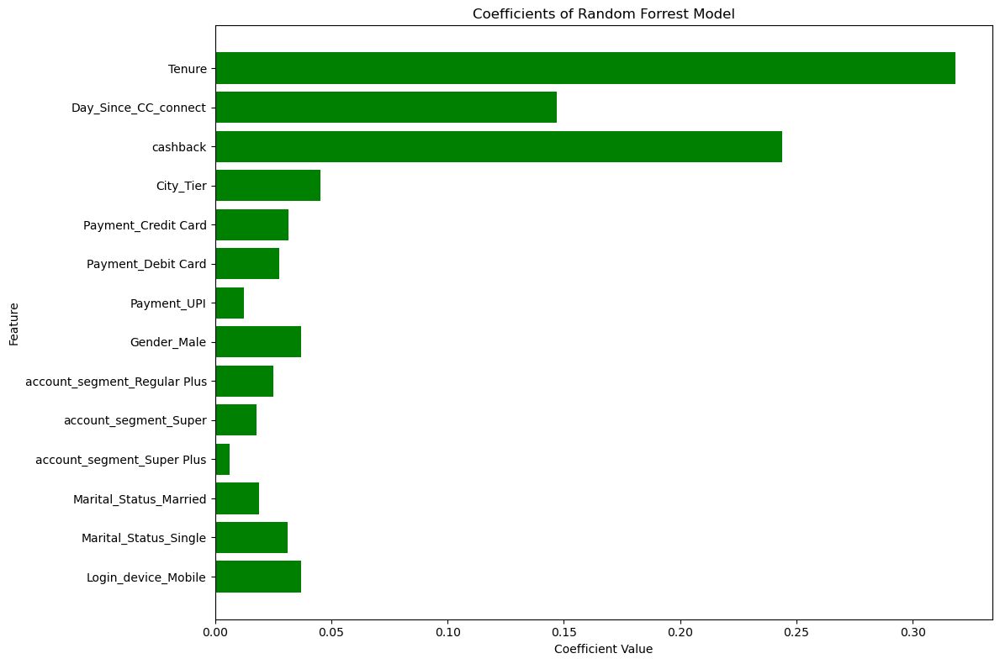

In [395]:
coef = importances

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Random Forrest Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

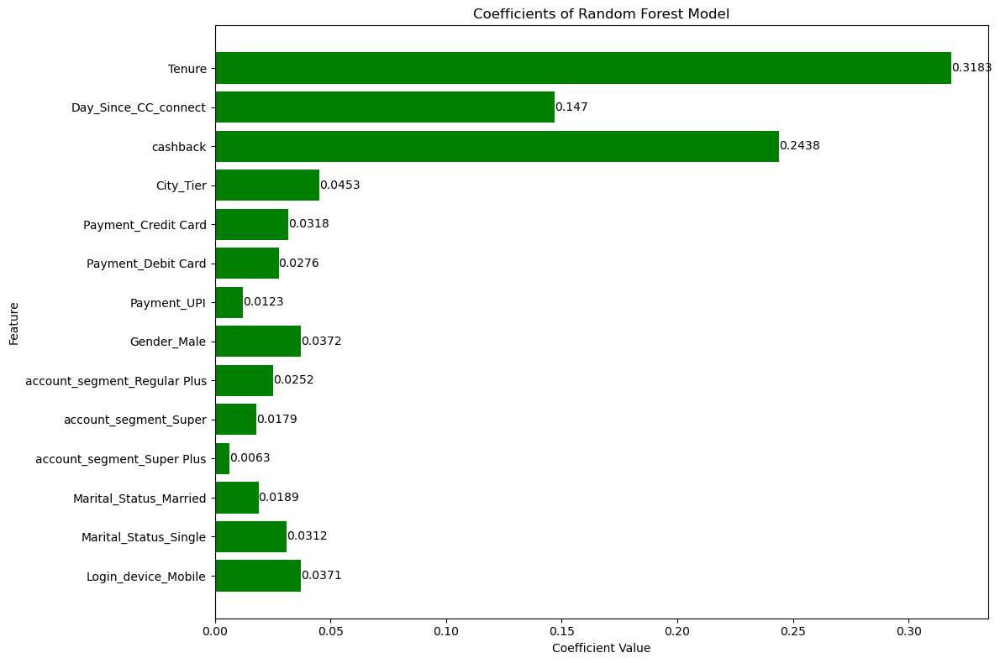

In [396]:
coef = importances
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Random Forest Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()


In [397]:
# Classification report for train data
print("Classification Report for Train Data:")
print(classification_report(y_train, y_pred_train))

Classification Report for Train Data:
              precision    recall  f1-score   support

           0       0.91      0.79      0.85      6556
           1       0.37      0.62      0.46      1326

    accuracy                           0.76      7882
   macro avg       0.64      0.70      0.65      7882
weighted avg       0.82      0.76      0.78      7882



In [398]:
# Classification report for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_pred_test))

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.90      0.79      0.85      2808
           1       0.37      0.59      0.45       570

    accuracy                           0.76      3378
   macro avg       0.64      0.69      0.65      3378
weighted avg       0.81      0.76      0.78      3378



In [399]:
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

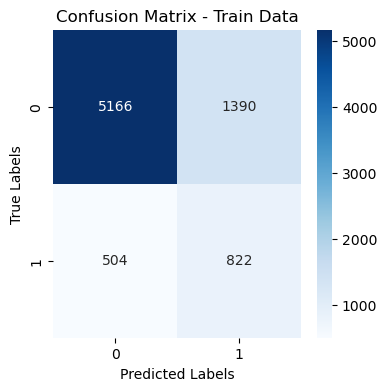

In [400]:
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Train Data')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [401]:
print(conf_matrix_train )

[[5166 1390]
 [ 504  822]]


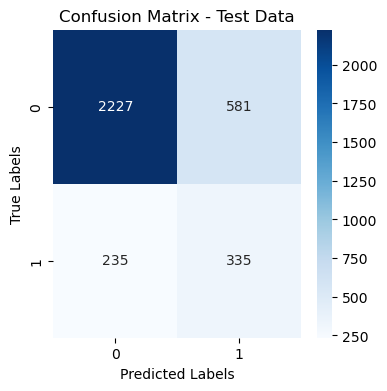

In [402]:
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

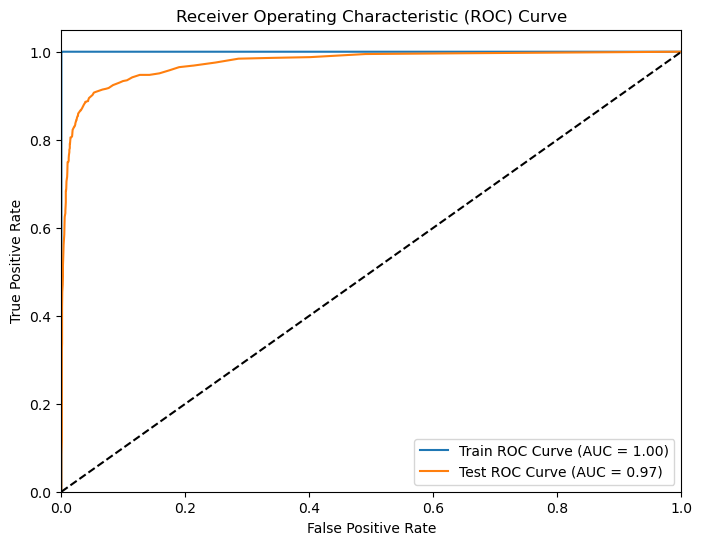

In [403]:
from sklearn.metrics import roc_curve, roc_auc_score

# Get predicted probabilities for both train and test data
pred_prob_train = RF_model.predict_proba(X_train)
pred_prob_test = RF_model.predict_proba(X_test)

# Calculate ROC curve and AUC score for the test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test[:, 1])
auc_score_test = roc_auc_score(y_test, pred_prob_test[:, 1])

# Calculate ROC curve and AUC score for the train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, pred_prob_train[:, 1])
auc_score_train = roc_auc_score(y_train, pred_prob_train[:, 1])

# Plot ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train ROC Curve (AUC = {auc_score_train:.2f})')
plt.plot(fpr_test, tpr_test, label=f'Test ROC Curve (AUC = {auc_score_test:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# Random Forest Method Hyper tuned

In [405]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [406]:
param_grid = {'max_depth': [5,6,7,8,9,10],
              'min_samples_split': [8,9,10],
              'n_estimators': [100,200,300],
              'criterion': ['gini', 'entropy'],
              'random_state': [1]}

In [407]:
# Create Random Forest Classifier model
rf = RandomForestClassifier()

In [408]:
# Create GridSearchCV object
grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='accuracy')

In [409]:
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 6, 7, 8, 9, 10],
                         'min_samples_split': [8, 9, 10],
                         'n_estimators': [100, 200, 300], 'random_state': [1]},
             scoring='accuracy')

In [410]:
print("Best Parameters:", grid_search.best_params_)
print("Best Estimator:", grid_search.best_estimator_)

Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 8, 'n_estimators': 100, 'random_state': 1}
Best Estimator: RandomForestClassifier(max_depth=10, min_samples_split=8, random_state=1)


In [411]:
best_rf_model = grid_search.best_estimator_

In [412]:
importances = best_rf_model.feature_importances_
feature_names = X_train.columns

In [413]:
best_rf_model.feature_importances_

array([0.42389603, 0.12062609, 0.13929931, 0.05017375, 0.03513909,
       0.02474737, 0.01211639, 0.02969012, 0.04229854, 0.02217444,
       0.00666372, 0.02638142, 0.0373931 , 0.02940064])

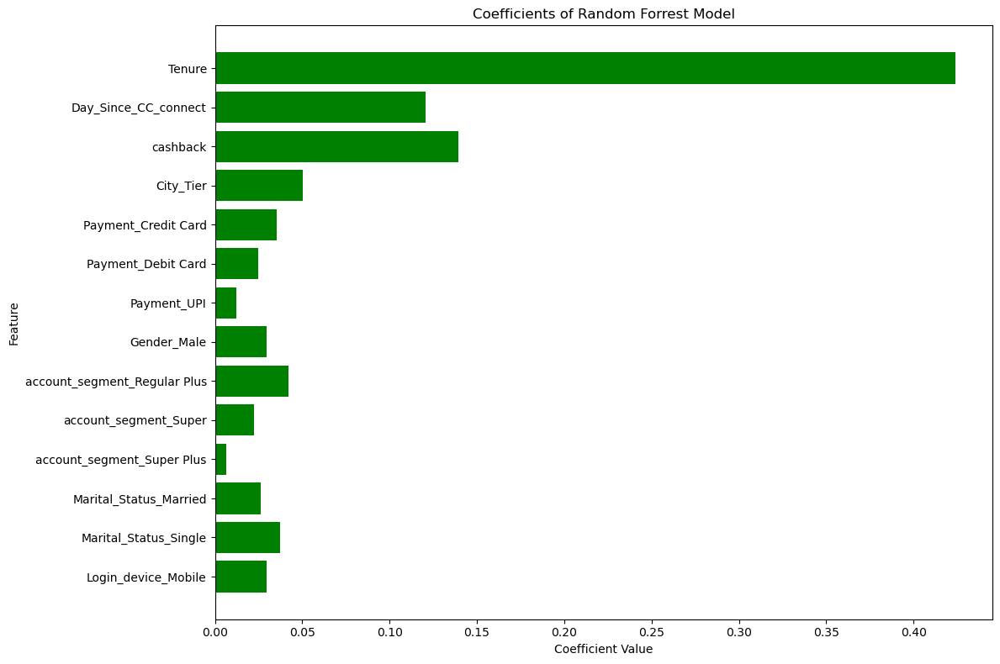

In [414]:
coef = importances

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Random Forrest Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

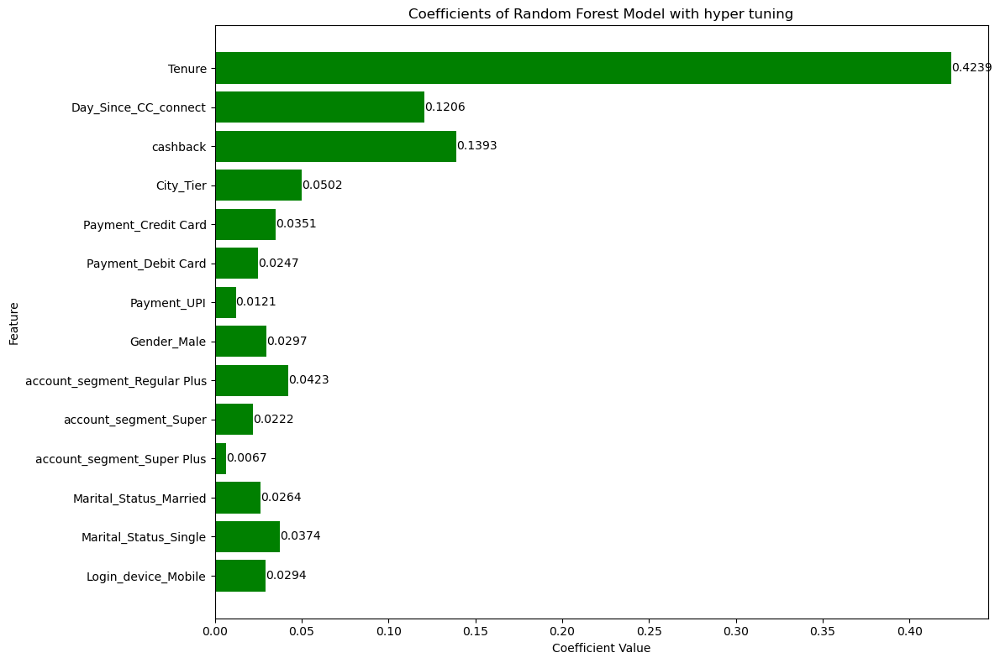

In [415]:
import matplotlib.pyplot as plt

coef = importances
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Random Forest Model with hyper tuning')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()


In [416]:
y_pred_train = best_rf_model.predict(X_train)
y_pred_test = best_rf_model.predict(X_test)

In [417]:
print("Classification Report for Training Data:")
print(classification_report(y_train, y_pred_train))

Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      6556
           1       0.92      0.63      0.75      1326

    accuracy                           0.93      7882
   macro avg       0.93      0.81      0.85      7882
weighted avg       0.93      0.93      0.92      7882



In [418]:
print("Classification Report for Test Data:")
print(classification_report(y_test, y_pred_test))

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      2808
           1       0.88      0.55      0.68       570

    accuracy                           0.91      3378
   macro avg       0.90      0.77      0.81      3378
weighted avg       0.91      0.91      0.90      3378



In [419]:
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

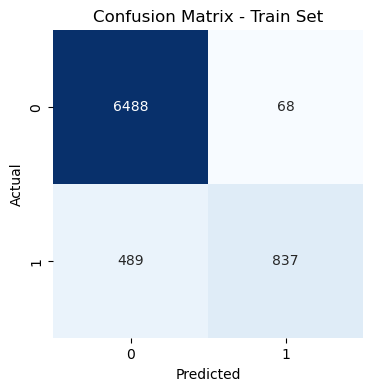

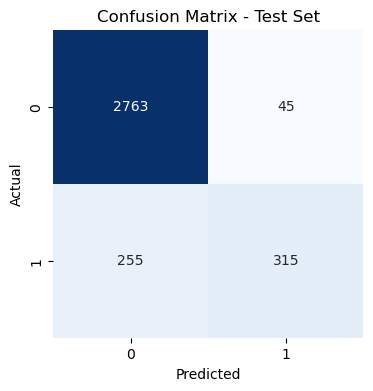

In [420]:
# Plot confusion matrix for train set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Train Set')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot confusion matrix for test set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Test Set')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

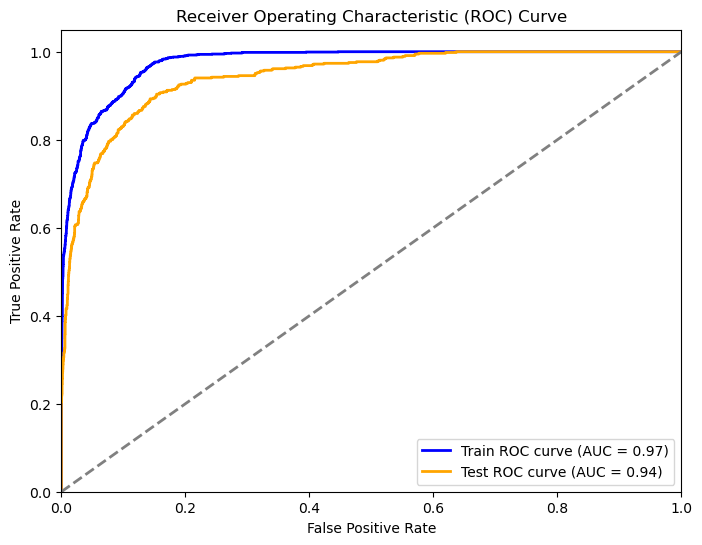

In [421]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for training and test data
train_pred_prob = best_rf_model.predict_proba(X_train)[:, 1]
test_pred_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC for training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, train_pred_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, test_pred_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = {:.2f})'.format(roc_auc_train))
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = {:.2f})'.format(roc_auc_test))
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Random Forest Method SMOTE

In [423]:
RF_SM_model = RandomForestClassifier(random_state=1)
RF_SM_model.fit(X_train_resampled, y_train_resampled)

RandomForestClassifier(random_state=1)

In [424]:
X_train_resampled.shape

(13112, 14)

In [425]:
pred_prob_train = RF_SM_model.predict_proba(X_train)
pred_prob_test = RF_SM_model.predict_proba(X_test)

In [426]:
RF_SM_model.feature_importances_

array([0.37720608, 0.15826161, 0.16342998, 0.04184957, 0.02746833,
       0.0242794 , 0.01129115, 0.03364048, 0.03889605, 0.02321916,
       0.00994622, 0.03214404, 0.02577313, 0.0325948 ])

In [427]:
importances=RF_SM_model.feature_importances_

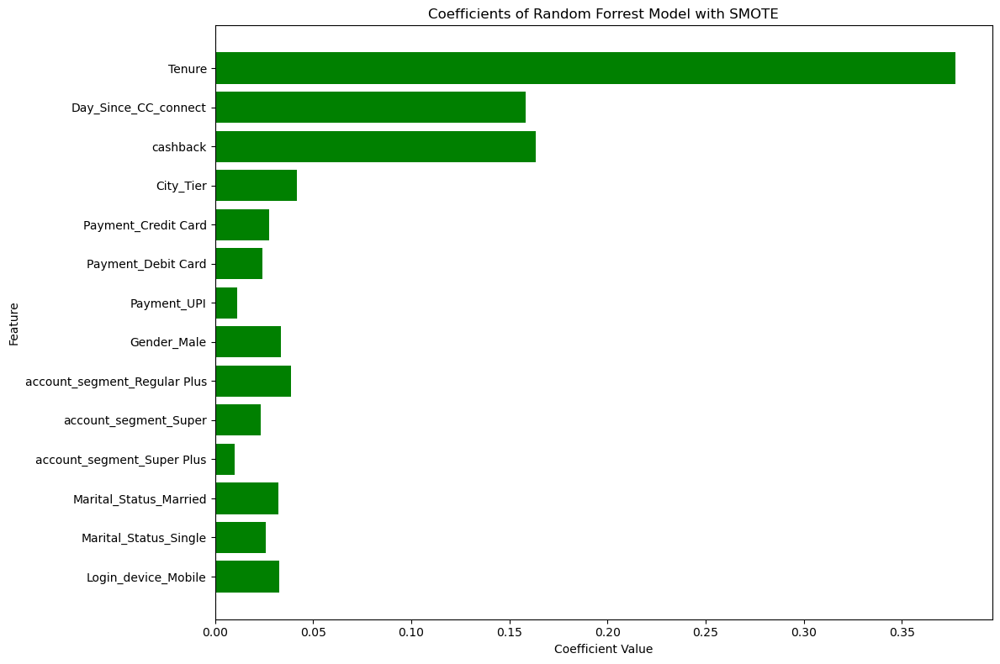

In [428]:
coef = importances

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Random Forrest Model with SMOTE')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

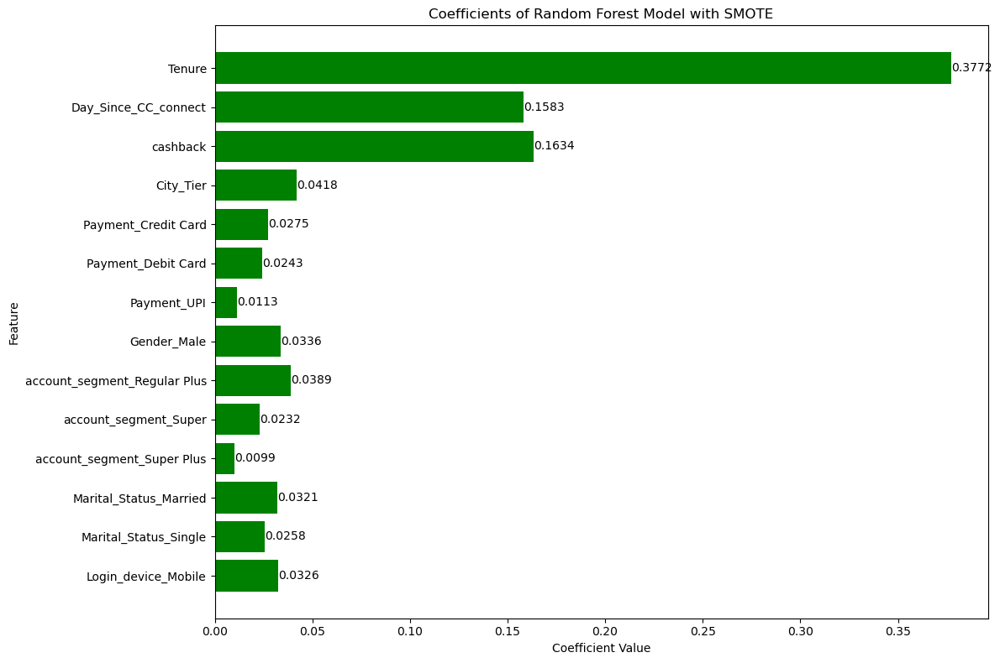

In [429]:
coef = importances
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Random Forest Model with SMOTE')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

In [430]:
# Get predicted classes
y_pred_train = RF_SM_model.predict(X_train)
y_pred_test = RF_SM_model.predict(X_test)

In [431]:
from sklearn.metrics import classification_report

# Predict probabilities for train and test data
pred_prob_train = RF_SM_model.predict_proba(X_train_resampled)
pred_prob_test = RF_SM_model.predict_proba(X_test)

# Get predicted classes
y_pred_train = RF_SM_model.predict(X_train_resampled)
y_pred_test = RF_SM_model.predict(X_test)

# Generate classification report for train data
print("Classification Report - Train Data:")
print(classification_report(y_train_resampled, y_pred_train))

# Generate classification report for test data
print("Classification Report - Test Data:")
print(classification_report(y_test, y_pred_test))


Classification Report - Train Data:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112

Classification Report - Test Data:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2808
           1       0.88      0.82      0.85       570

    accuracy                           0.95      3378
   macro avg       0.92      0.90      0.91      3378
weighted avg       0.95      0.95      0.95      3378



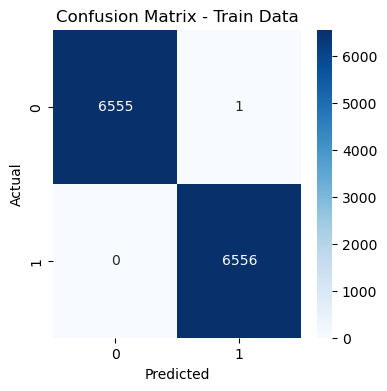

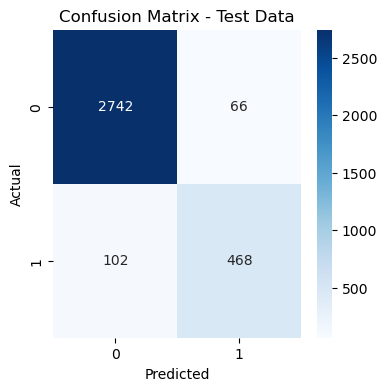

In [432]:
# Calculate confusion matrix for train data
cm_train = confusion_matrix(y_train_resampled, y_pred_train)

# Calculate confusion matrix for test data
cm_test = confusion_matrix(y_test, y_pred_test)

# Plot confusion matrix heat map for train data
plt.figure(figsize=(4, 4))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Train Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot confusion matrix heat map for test data
plt.figure(figsize=(4, 4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


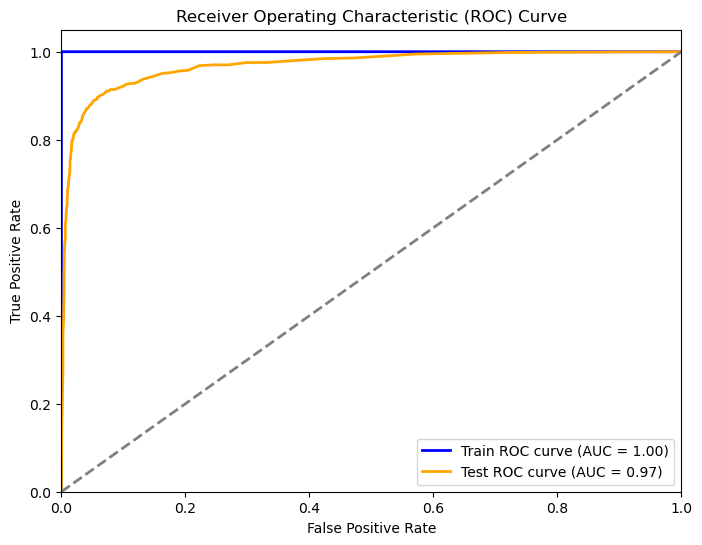

In [433]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate ROC curve and AUC score for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_resampled, pred_prob_train[:, 1])
roc_auc_train = roc_auc_score(y_train_resampled, pred_prob_train[:, 1])

# Calculate ROC curve and AUC score for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test[:, 1])
roc_auc_test = roc_auc_score(y_test, pred_prob_test[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = {:.2f})'.format(roc_auc_train))
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = {:.2f})'.format(roc_auc_test))
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Bagging Method

In [435]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
import numpy as np
import matplotlib.pyplot as plt

# Create a BaggingClassifier with DecisionTreeClassifier as the base estimator
base_estimator = DecisionTreeClassifier()
bagging_model = BaggingClassifier(estimator=base_estimator)

# Fit the BaggingClassifier to the data
bagging_model.fit(X_train, y_train)


BaggingClassifier(estimator=DecisionTreeClassifier())

In [436]:
feature_importances = np.mean([tree.feature_importances_ for tree in bagging_model.estimators_], axis=0)
feature_importances 

array([0.33607034, 0.12275203, 0.25873684, 0.03829691, 0.03495854,
       0.02776956, 0.01299677, 0.04266547, 0.01374668, 0.02011327,
       0.00695884, 0.01998991, 0.02968273, 0.03526211])

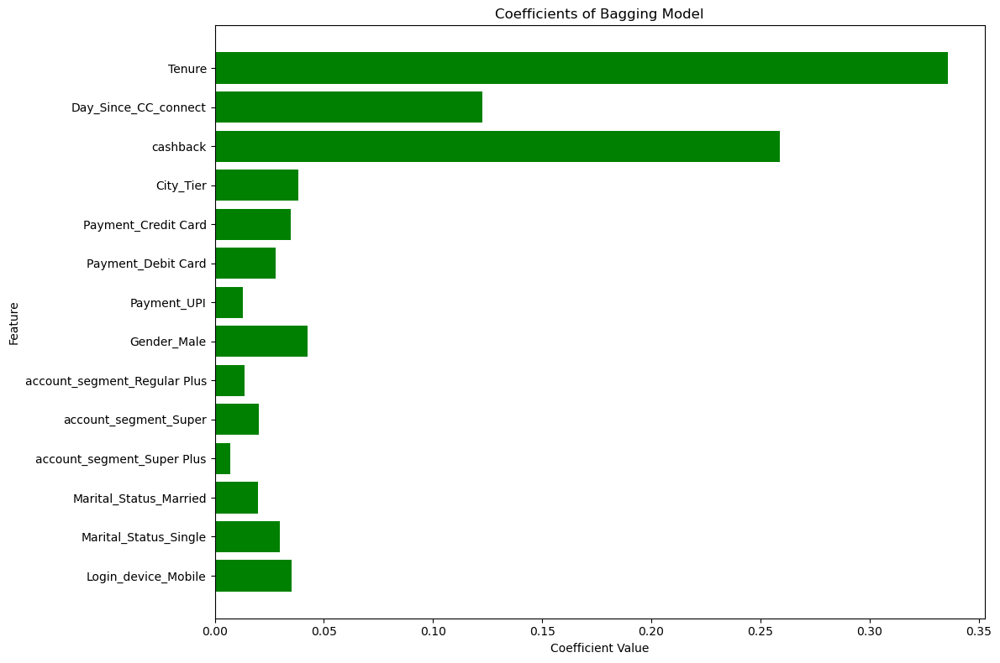

In [437]:
coef = feature_importances 

# Get the feature names from X_train.columns
feature_names = X_train.columns

# Plot the important features using a bar plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Bagging Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

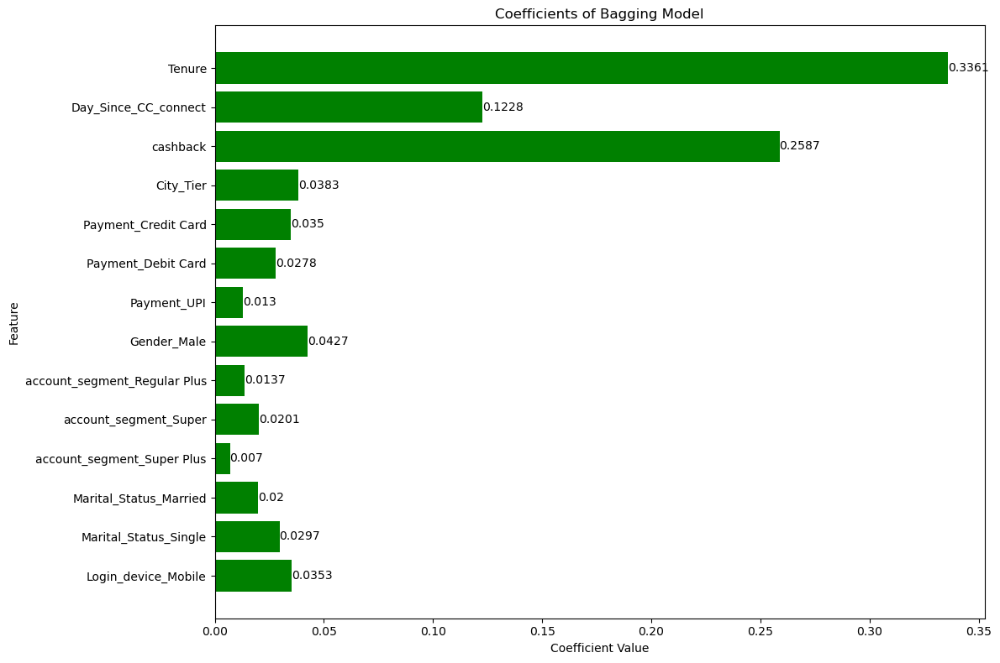

In [438]:
coef = feature_importances
feature_names = X_train.columns

plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, coef, color='green')
plt.axvline(x=0, color='gray', linestyle='--')
plt.title('Coefficients of Bagging Model')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

In [439]:
y_pred_train = bagging_model.predict(X_train)
y_pred_test = bagging_model.predict(X_test)

#Classification report for train data
print("Classification Report - Train Data:")
print(classification_report(y_train, y_pred_train))

#Classification report for test data
print("Classification Report - Test Data:")
print(classification_report(y_test, y_pred_test))


Classification Report - Train Data:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      6556
           1       1.00      0.98      0.99      1326

    accuracy                           1.00      7882
   macro avg       1.00      0.99      0.99      7882
weighted avg       1.00      1.00      1.00      7882

Classification Report - Test Data:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2808
           1       0.91      0.76      0.82       570

    accuracy                           0.95      3378
   macro avg       0.93      0.87      0.90      3378
weighted avg       0.94      0.95      0.94      3378



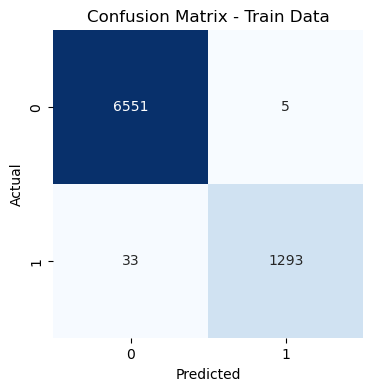

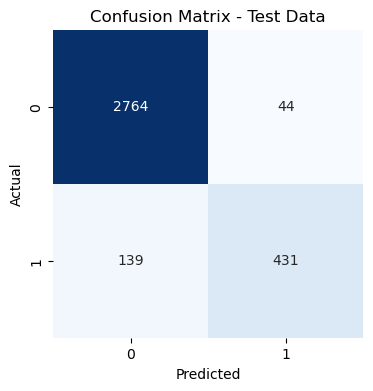

In [440]:
# Calculate confusion matrices for train and test data
cm_train = confusion_matrix(y_train, y_pred_train)
cm_test = confusion_matrix(y_test, y_pred_test)

# Plot confusion matrix for train data
plt.figure(figsize=(4, 4))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Train Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot confusion matrix for test data
plt.figure(figsize=(4, 4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

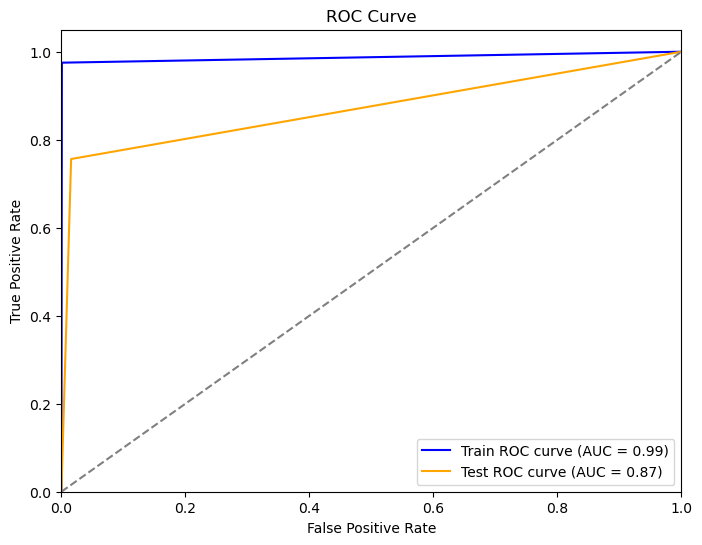

In [441]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculate ROC curve and AUC score for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_pred_train)
roc_auc_train = roc_auc_score(y_train, y_pred_train)

# Calculate ROC curve and AUC score for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_test)
roc_auc_test = roc_auc_score(y_test, y_pred_test)

# Plot ROC curves and AUC scores for both train and test data on a single plot
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


# Bagging Hyper tuned

In [443]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Create a BaggingClassifier with DecisionTreeClassifier as base estimator
base_estimator = DecisionTreeClassifier()
bagging_model = BaggingClassifier(estimator=base_estimator)

# Define the parameter grid for GridSearchCV
param_grid = {
    'max_samples': [0.5, 0.6, 0.7, 0.8],
    'max_features': [0.3, 0.4, 0.5, 0.6],
    'n_estimators': [10,20,30, 40, 50, 100],
    'random_state': [1]
}


In [444]:
# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=bagging_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and best estimator
print("Best Parameters:", grid_search.best_params_)
print("Best Estimator:", grid_search.best_estimator_)


Best Parameters: {'max_features': 0.6, 'max_samples': 0.8, 'n_estimators': 10, 'random_state': 1}
Best Estimator: BaggingClassifier(estimator=DecisionTreeClassifier(), max_features=0.6,
                  max_samples=0.8, random_state=1)


In [445]:
Bagging_modell = grid_search.best_estimator_

In [446]:
feature_importances=np.mean([tree.feature_importances_ for tree in Bagging_modell.estimators_], axis=0)

In [447]:
feature_importances

array([0.13261706, 0.15074347, 0.18412792, 0.12357877, 0.10122179,
       0.08975705, 0.1369366 , 0.08101735])

In [448]:
feature_names = X_train.columns
feature_names

Index(['Tenure', 'Day_Since_CC_connect', 'cashback', 'City_Tier',
       'Payment_Credit Card', 'Payment_Debit Card', 'Payment_UPI',
       'Gender_Male', 'account_segment_Regular Plus', 'account_segment_Super',
       'account_segment_Super Plus', 'Marital_Status_Married',
       'Marital_Status_Single', 'Login_device_Mobile'],
      dtype='object')

In [449]:
y_train_pred = Bagging_modell.predict(X_train)
y_test_pred = Bagging_modell.predict(X_test)

In [450]:
# Generate the classification report for the training set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_train_pred))
# Generate the classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      6556
           1       0.97      0.93      0.95      1326

    accuracy                           0.98      7882
   macro avg       0.98      0.96      0.97      7882
weighted avg       0.98      0.98      0.98      7882

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      2808
           1       0.87      0.65      0.75       570

    accuracy                           0.92      3378
   macro avg       0.90      0.82      0.85      3378
weighted avg       0.92      0.92      0.92      3378



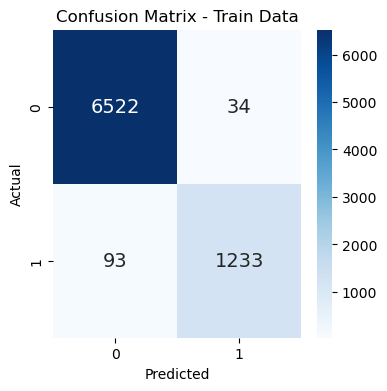

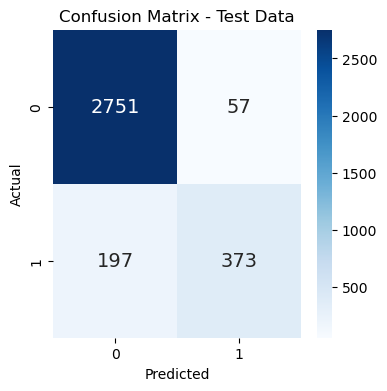

In [451]:
# Calculate confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix for train data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Train Data")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot confusion matrix for test data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Test Data")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

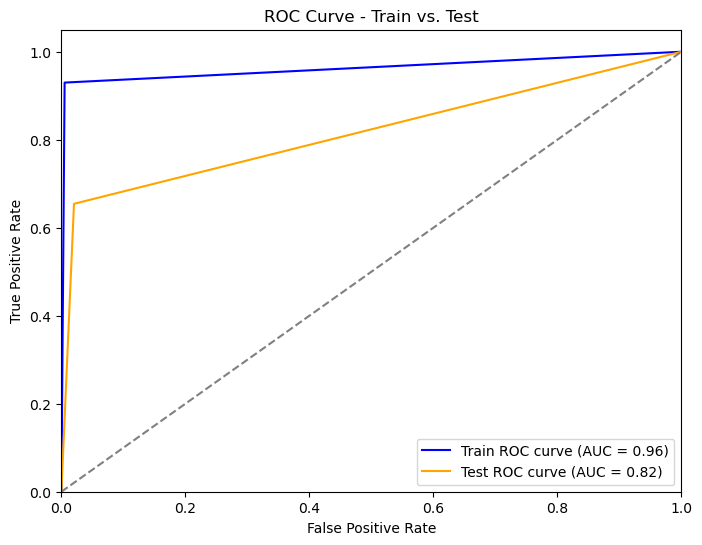

In [452]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve

# Calculate ROC curve and AUC score for train data
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_pred)
roc_auc_train = roc_auc_score(y_train, y_train_pred)

# Calculate ROC curve and AUC score for test data
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_pred)
roc_auc_test = roc_auc_score(y_test, y_test_pred)

# Plot ROC curves and AUC scores for both train and test data
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Train vs. Test')
plt.legend(loc='lower right')
plt.show()


# Bagging SMOTE

In [454]:
smote = SMOTE(random_state=1)

In [455]:
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

from sklearn.ensemble import BaggingClassifier

# Create the BaggingClassifier with the correct parameter name
bagging_smote_model = BaggingClassifier(estimator=base_estimator)


In [456]:
# Fit the BaggingClassifier to the resampled data
bagging_smote_model.fit(X_train_resampled, y_train_resampled)

BaggingClassifier(estimator=DecisionTreeClassifier())

In [457]:
X_train_resampled.shape

(13112, 14)

In [458]:
# Predict on train and test data
y_train_pred = bagging_smote_model.predict(X_train)
y_test_pred = bagging_smote_model.predict(X_test)

# Print classification report for train and test data
print("Classification Report - Train Data:")
print(classification_report(y_train, y_train_pred))

print("Classification Report - Test Data:")
print(classification_report(y_test, y_test_pred))

Classification Report - Train Data:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       0.99      0.99      0.99      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882

Classification Report - Test Data:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      2808
           1       0.83      0.82      0.82       570

    accuracy                           0.94      3378
   macro avg       0.90      0.89      0.89      3378
weighted avg       0.94      0.94      0.94      3378



In [459]:
# Plot confusion matrix for train and test data
conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

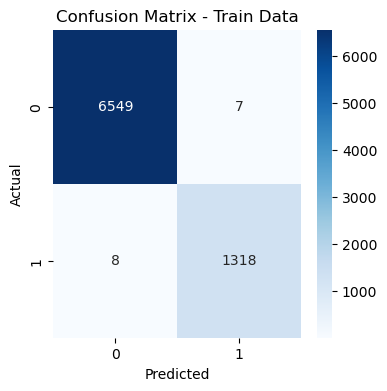

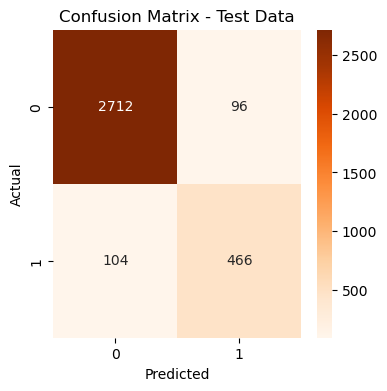

In [460]:
# Plot confusion matrix for train data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Train Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot confusion matrix for test data
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Oranges')
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

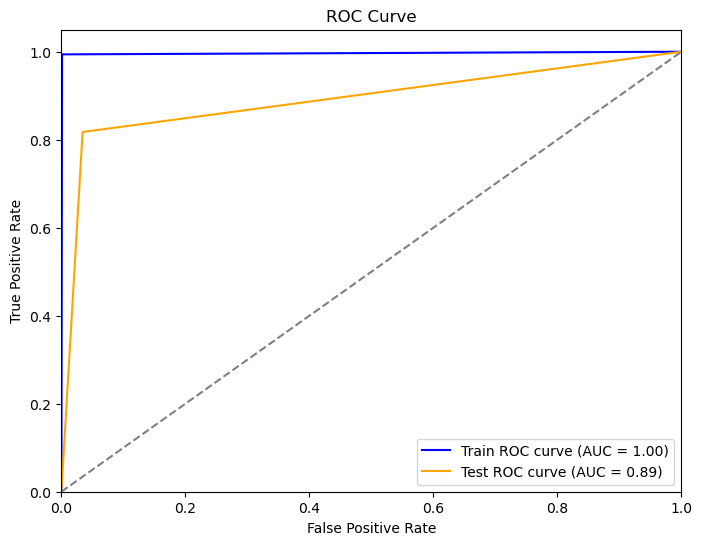

In [461]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculate ROC curve and AUC score for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred)
roc_auc_train = roc_auc_score(y_train, y_train_pred)

# Calculate ROC curve and AUC score for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred)
roc_auc_test = roc_auc_score(y_test, y_test_pred)

# Plot ROC curves and AUC scores for both train and test data
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Ada Boosting

In [463]:
from sklearn.ensemble import AdaBoostClassifier

ADB_model = AdaBoostClassifier()
ADB_model.fit(X_train,y_train)

AdaBoostClassifier()

In [464]:
## Performance Matrix on train data set
y_train_predict = ADB_model.predict(X_train)
model_score = ADB_model.score(X_train, y_train)
print(model_score)
print(metrics.confusion_matrix(y_train, y_train_predict))
print(metrics.classification_report(y_train, y_train_predict))

0.86513575234712
[[6177  379]
 [ 684  642]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92      6556
           1       0.63      0.48      0.55      1326

    accuracy                           0.87      7882
   macro avg       0.76      0.71      0.73      7882
weighted avg       0.85      0.87      0.86      7882



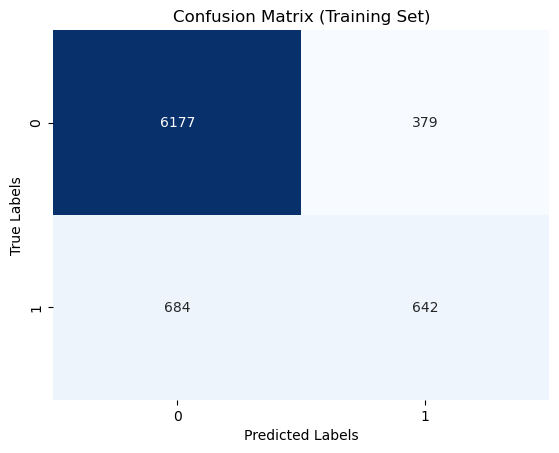

In [465]:
y_train_predict = ADB_model.predict(X_train)

conf_matrix = metrics.confusion_matrix(y_train, y_train_predict)

sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Confusion Matrix (Training Set)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [466]:
## Performance Matrix on test data set
y_test_predict = ADB_model.predict(X_test)
model_score = ADB_model.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.8724097098875074
[[2668  140]
 [ 291  279]]
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      2808
           1       0.67      0.49      0.56       570

    accuracy                           0.87      3378
   macro avg       0.78      0.72      0.74      3378
weighted avg       0.86      0.87      0.86      3378



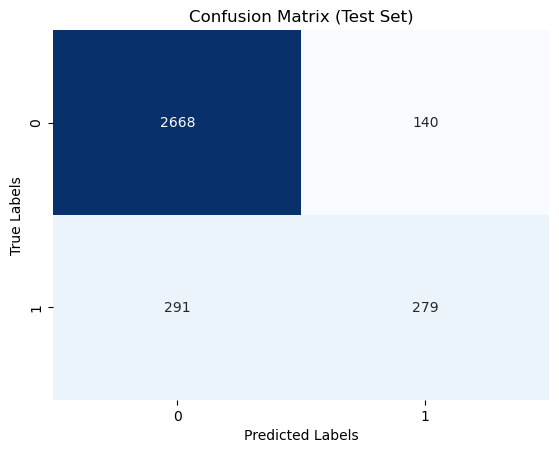

In [467]:
y_test_predict = ADB_model.predict(X_test)


conf_matrix = metrics.confusion_matrix(y_test, y_test_predict)

sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Confusion Matrix (Test Set)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [468]:
pred_prob_train = ADB_model.predict_proba(X_train)
pred_prob_test = ADB_model.predict_proba(X_test)

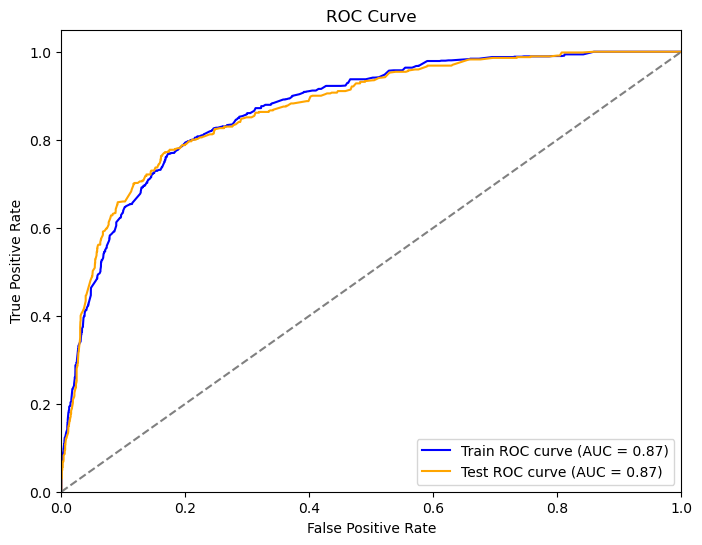

In [469]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Get predicted probabilities for training and test data
pred_prob_train = ADB_model.predict_proba(X_train)[:, 1]
pred_prob_test = ADB_model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC score for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, pred_prob_train)
roc_auc_train = roc_auc_score(y_train, pred_prob_train)

# Calculate ROC curve and AUC score for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)

# Plot ROC curves and AUC scores for both train and test data
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

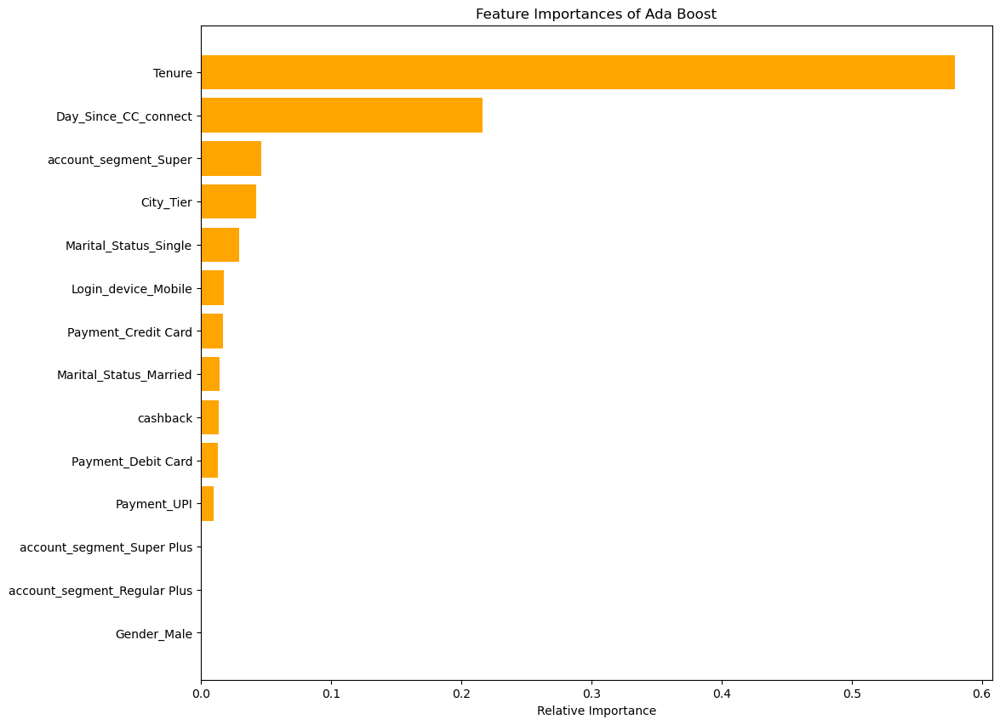

In [470]:
importances = ADB_model.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,10))
plt.title('Feature Importances of Ada Boost')
plt.barh(range(len(indices)), importances[indices], color='orange', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

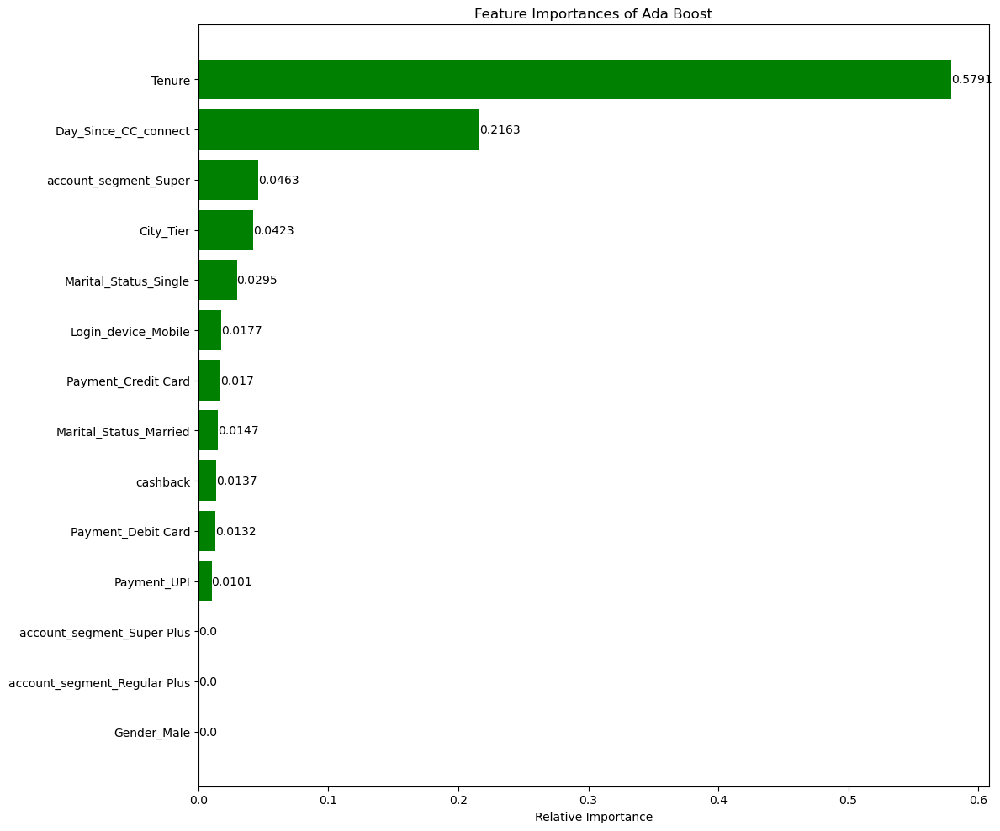

In [471]:
importances = ADB_model.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12, 10))
plt.title('Feature Importances of Ada Boost')
bars = plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

# Ada Boosting Hyper tuned

In [473]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

# Define the AdaBoost model
ADB_model1 = AdaBoostClassifier(random_state=1)

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}

# Perform the GridSearchCV
grid_search = GridSearchCV(estimator=ADB_model1, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Print the best parameters and best estimator
print("Best Parameters:", grid_search.best_params_)
print("Best Estimator:", grid_search.best_estimator_)


Best Parameters: {'learning_rate': 1.0, 'n_estimators': 100}
Best Estimator: AdaBoostClassifier(n_estimators=100, random_state=1)


In [474]:
from sklearn.metrics import classification_report

# Get the best AdaBoost model from GridSearchCV
ADB_model1 = grid_search.best_estimator_

In [475]:
y_train_predict = ADB_model1.predict(X_train)
model_score = ADB_model1.score(X_train, y_train)
print(model_score)
print(metrics.confusion_matrix(y_train, y_train_predict))
print(metrics.classification_report(y_train, y_train_predict))

0.8672925653387465
[[6206  350]
 [ 696  630]]
              precision    recall  f1-score   support

           0       0.90      0.95      0.92      6556
           1       0.64      0.48      0.55      1326

    accuracy                           0.87      7882
   macro avg       0.77      0.71      0.73      7882
weighted avg       0.86      0.87      0.86      7882



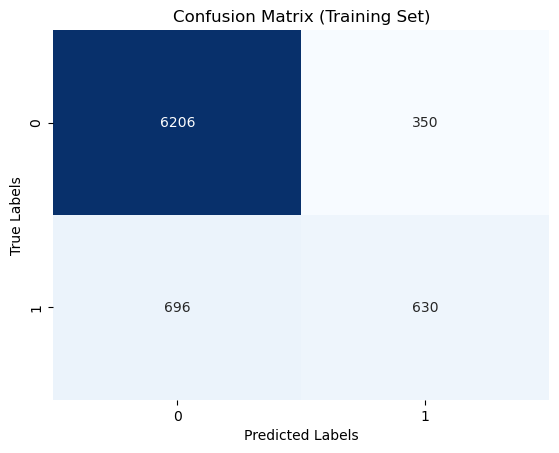

In [476]:
y_train_predict = ADB_model1.predict(X_train)

conf_matrix = metrics.confusion_matrix(y_train, y_train_predict)

sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Confusion Matrix (Training Set)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [477]:
## Performance Matrix on test data set
y_test_predict = ADB_model1.predict(X_test)
model_score = ADB_model1.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.8735938425103612
[[2678  130]
 [ 297  273]]
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      2808
           1       0.68      0.48      0.56       570

    accuracy                           0.87      3378
   macro avg       0.79      0.72      0.74      3378
weighted avg       0.86      0.87      0.86      3378



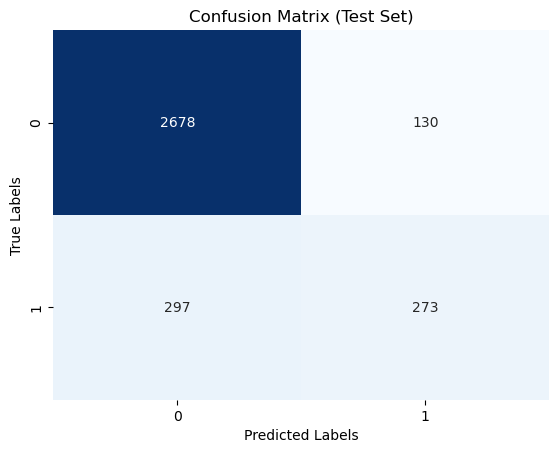

In [478]:
y_test_predict = ADB_model1.predict(X_test)


conf_matrix = metrics.confusion_matrix(y_test, y_test_predict)

sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Confusion Matrix (Test Set)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [479]:
pred_prob_train = ADB_model1.predict_proba(X_train)
pred_prob_test = ADB_model1.predict_proba(X_test)

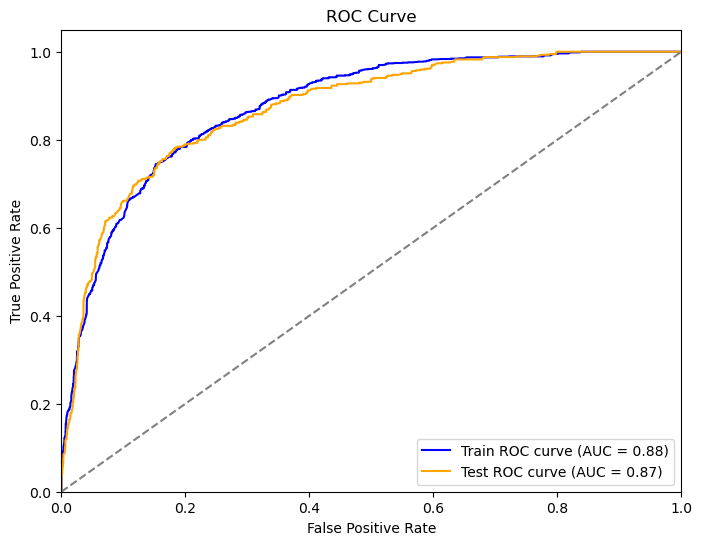

In [480]:
# Calculate ROC curve and AUC score for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, pred_prob_train[:, 1])
roc_auc_train = roc_auc_score(y_train, pred_prob_train[:, 1])

# Calculate ROC curve and AUC score for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test[:, 1])
roc_auc_test = roc_auc_score(y_test, pred_prob_test[:, 1])

# Plot ROC curves and AUC scores for both train and test data
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

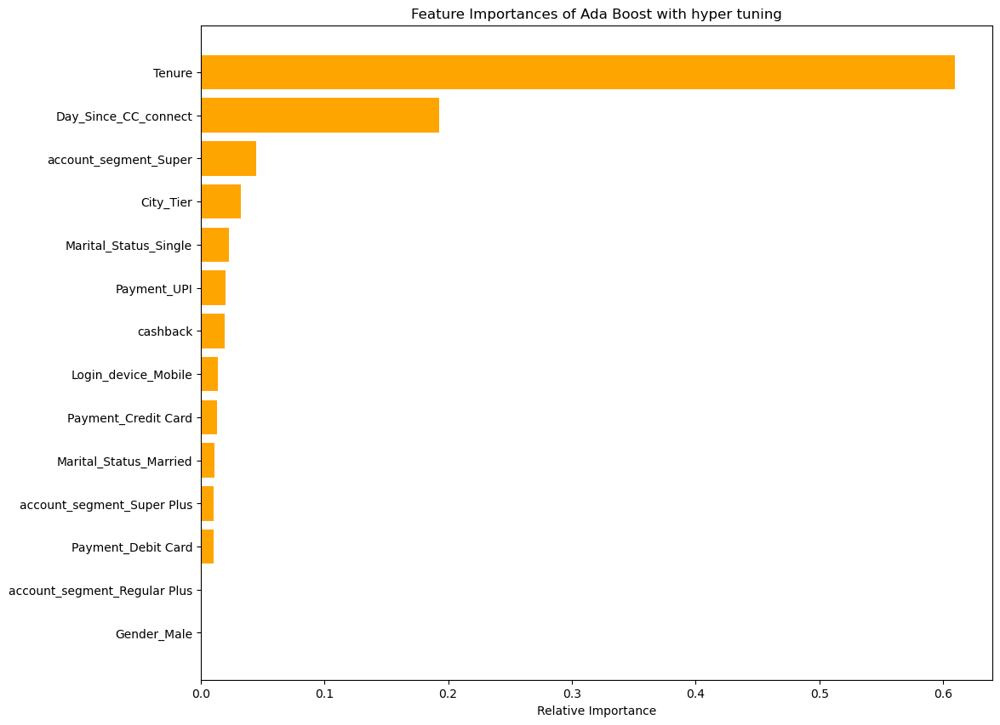

In [481]:
importances = ADB_model1.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,10))
plt.title('Feature Importances of Ada Boost with hyper tuning')
plt.barh(range(len(indices)), importances[indices], color='orange', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

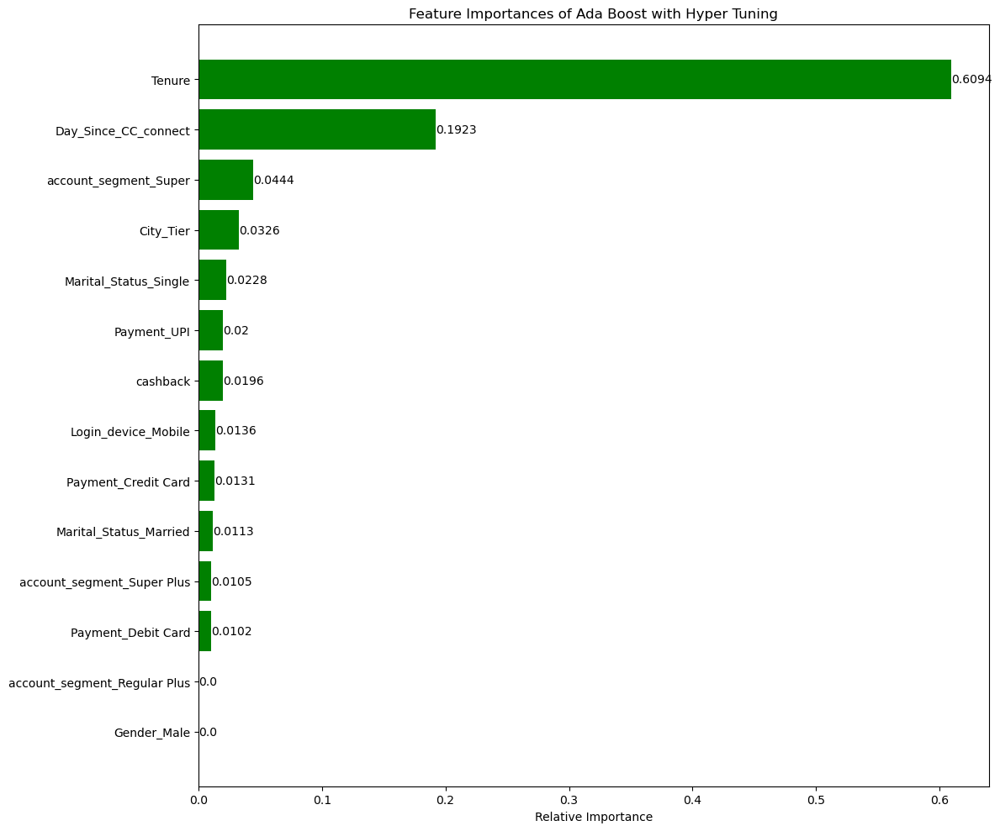

In [482]:
importances = ADB_model1.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12, 10))
plt.title('Feature Importances of Ada Boost with Hyper Tuning')
bars = plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

# Ada Boosting Smote

In [484]:
smote = SMOTE(random_state=1)

# Apply SMOTE to the training data
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Initialize the AdaBoostClassifier
ADB_SM_model = AdaBoostClassifier(random_state=1)

# Fit the AdaBoost model to the resampled training data
ADB_SM_model.fit(X_train_resampled, y_train_resampled)

# Predict on train and test data
y_train_pred = ADB_SM_model.predict(X_train_resampled)
y_test_pred = ADB_SM_model.predict(X_test)


In [485]:
# Print classification reports
print("Classification Report - Train Data:")
print(classification_report(y_train_resampled, y_train_pred))

print("\nClassification Report - Test Data:")
print(classification_report(y_test, y_test_pred))

Classification Report - Train Data:
              precision    recall  f1-score   support

           0       0.79      0.83      0.81      6556
           1       0.82      0.77      0.80      6556

    accuracy                           0.80     13112
   macro avg       0.80      0.80      0.80     13112
weighted avg       0.80      0.80      0.80     13112


Classification Report - Test Data:
              precision    recall  f1-score   support

           0       0.94      0.83      0.88      2808
           1       0.47      0.74      0.58       570

    accuracy                           0.82      3378
   macro avg       0.71      0.79      0.73      3378
weighted avg       0.86      0.82      0.83      3378



In [486]:
conf_matrix_train = confusion_matrix(y_train_resampled, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

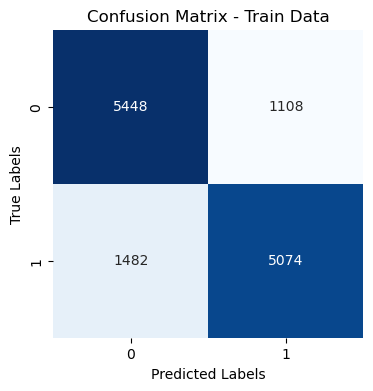

In [487]:
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Train Data")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

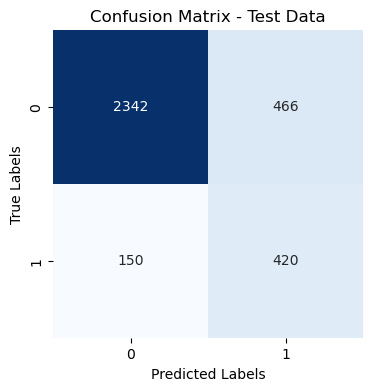

In [488]:
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Test Data")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

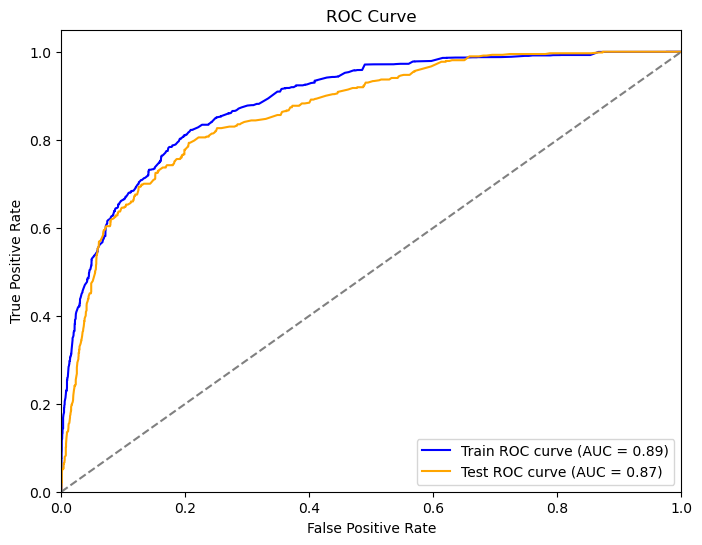

In [489]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Get predicted probabilities for training and test data
pred_prob_train = ADB_SM_model.predict_proba(X_train_resampled)[:, 1]
pred_prob_test = ADB_SM_model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC for training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_resampled, pred_prob_train)
roc_auc_train = roc_auc_score(y_train_resampled, pred_prob_train)

# Calculate ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)

# Plot ROC curves and AUC scores for both train and test data
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

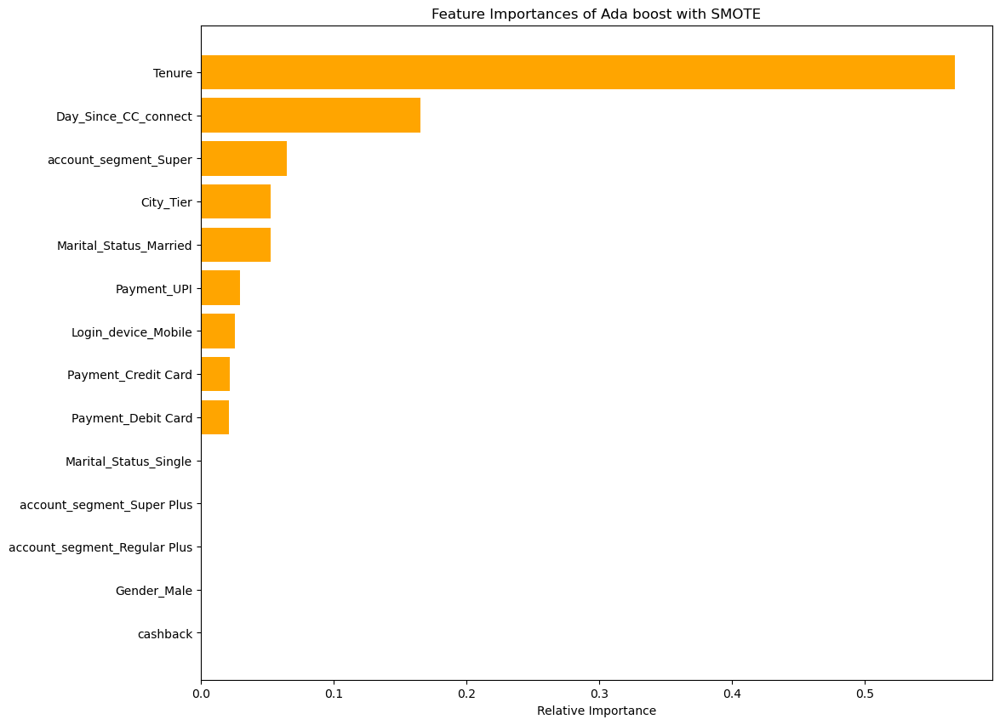

In [490]:
importances = ADB_SM_model.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,10))
plt.title('Feature Importances of Ada boost with SMOTE')
plt.barh(range(len(indices)), importances[indices], color='orange', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

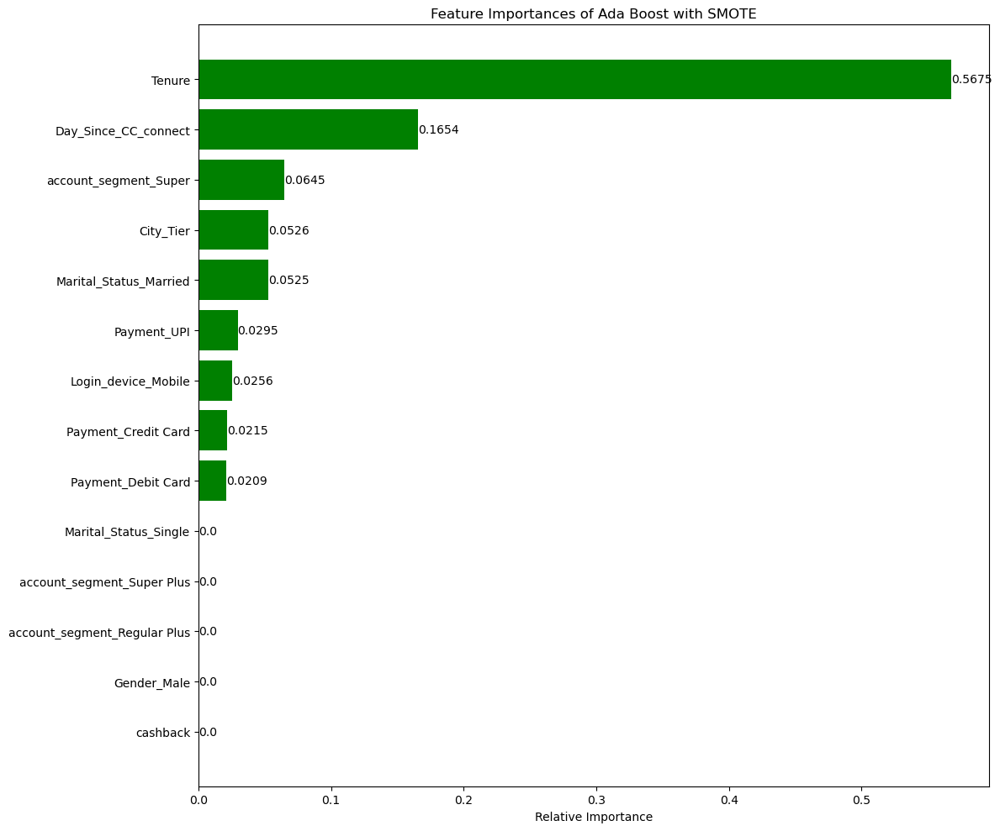

In [491]:
importances = ADB_SM_model.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12, 10))
plt.title('Feature Importances of Ada Boost with SMOTE')
bars = plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

# Gradient Boosting

In [493]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(random_state=1)
gbcl = gbcl.fit(X_train,y_train)

In [494]:
## Performance Matrix on train data set
y_train_predict = gbcl.predict(X_train)
model_score = gbcl.score(X_train, y_train)
print(model_score)
print(metrics.confusion_matrix(y_train, y_train_predict))
print(metrics.classification_report(y_train, y_train_predict))

0.8917787363613296
[[6345  211]
 [ 642  684]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      6556
           1       0.76      0.52      0.62      1326

    accuracy                           0.89      7882
   macro avg       0.84      0.74      0.78      7882
weighted avg       0.88      0.89      0.88      7882



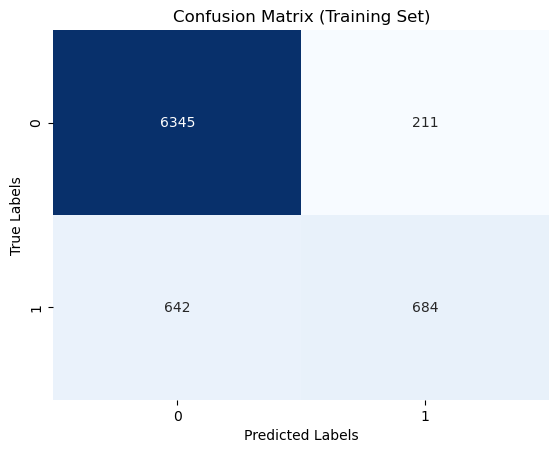

In [495]:
y_train_predict = gbcl.predict(X_train)

conf_matrix = metrics.confusion_matrix(y_train, y_train_predict)

sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Confusion Matrix (Training Set)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [496]:
## Performance Matrix on test data set
y_test_predict = gbcl.predict(X_test)
model_score = gbcl.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.8804026050917703
[[2708  100]
 [ 304  266]]
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      2808
           1       0.73      0.47      0.57       570

    accuracy                           0.88      3378
   macro avg       0.81      0.72      0.75      3378
weighted avg       0.87      0.88      0.87      3378



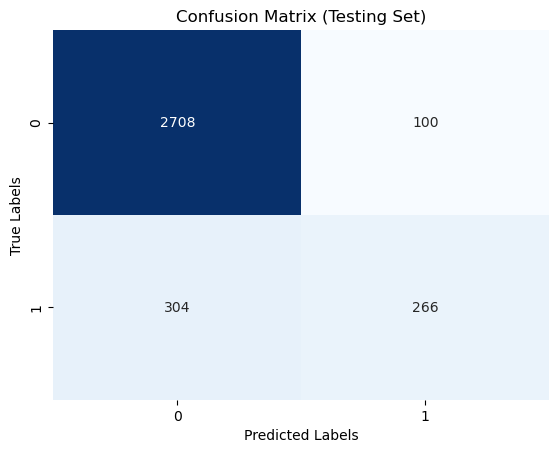

In [497]:
y_test_predict = gbcl.predict(X_test)


conf_matrix = metrics.confusion_matrix(y_test, y_test_predict)

sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Confusion Matrix (Testing Set)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [498]:
pred_prob_train = gbcl.predict_proba(X_train)
pred_prob_test = gbcl.predict_proba(X_test)

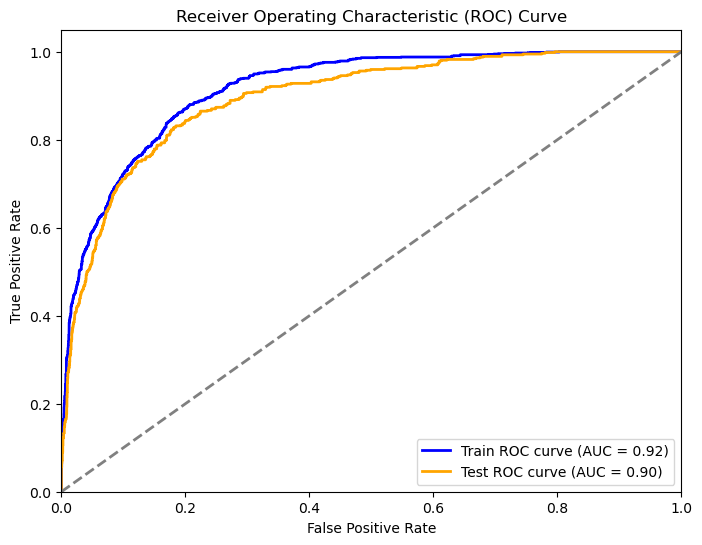

In [499]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Get predicted probabilities for training and test data
pred_prob_train = gbcl.predict_proba(X_train)[:, 1]
pred_prob_test = gbcl.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score for training and test data
roc_auc_train = roc_auc_score(y_train, pred_prob_train)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)

# Calculate ROC curve for training and test data
fpr_train, tpr_train, _ = roc_curve(y_train, pred_prob_train)
fpr_test, tpr_test, _ = roc_curve(y_test, pred_prob_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

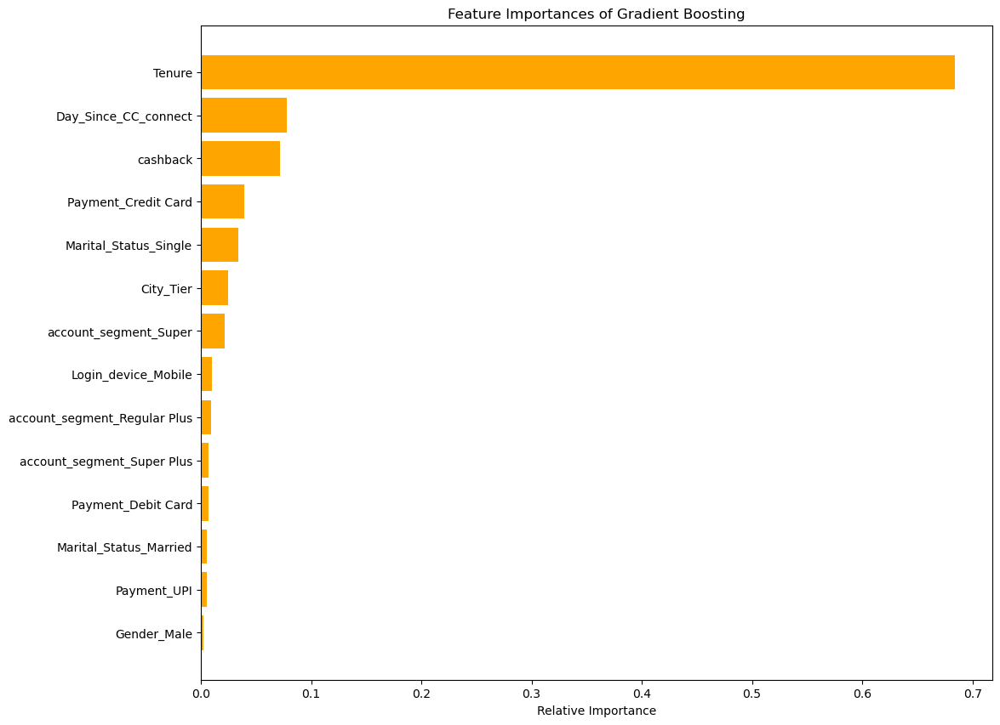

In [500]:
importances = gbcl.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,10))
plt.title('Feature Importances of Gradient Boosting')
plt.barh(range(len(indices)), importances[indices], color='orange', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

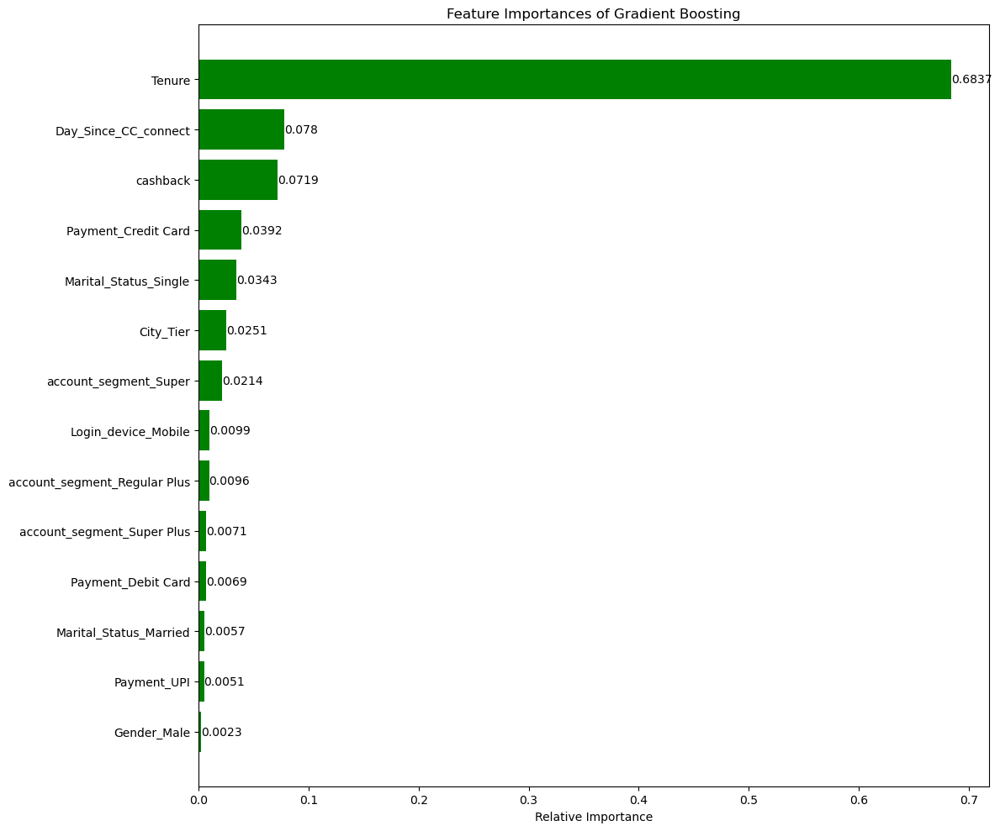

In [501]:
importances = gbcl.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12, 10))
plt.title('Feature Importances of Gradient Boosting')
bars = plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

# Gradient Boosting Hyper tuned

In [503]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV

GB_model = GradientBoostingClassifier()

param_dist = {'learning_rate': [0.05, 0.1, 0.2],
              'max_depth': [5, 6, 7],
              'min_samples_split': [5, 7, 10],
              'n_estimators': [50, 75],
              'random_state': [1]}

# Use RandomizedSearchCV with fewer iterations
random_search = RandomizedSearchCV(estimator=GB_model, param_distributions=param_dist, n_iter=20, cv=3, scoring='accuracy', random_state=1)

# Fit the RandomizedSearchCV to the data
random_search.fit(X_train, y_train)

# Print the best parameters and best estimator
print("Best Parameters:", random_search.best_params_)
print("Best Estimator:", random_search.best_estimator_)


Best Parameters: {'random_state': 1, 'n_estimators': 50, 'min_samples_split': 10, 'max_depth': 7, 'learning_rate': 0.2}
Best Estimator: GradientBoostingClassifier(learning_rate=0.2, max_depth=7, min_samples_split=10,
                           n_estimators=50, random_state=1)


In [504]:
GB_model1=random_search.best_estimator_
GB_model1

GradientBoostingClassifier(learning_rate=0.2, max_depth=7, min_samples_split=10,
                           n_estimators=50, random_state=1)

In [505]:
from sklearn.metrics import classification_report

# Predicted labels on the training set
y_train_pred = GB_model1.predict(X_train)

# Predicted labels on the test set
y_test_pred = GB_model1.predict(X_test)

# Generate classification reports for both sets
print("Classification Report for Training Set:")
print(classification_report(y_train, y_train_pred))

print("Classification Report for Test Set:")
print(classification_report(y_test, y_test_pred))


Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      6556
           1       0.98      0.90      0.94      1326

    accuracy                           0.98      7882
   macro avg       0.98      0.95      0.96      7882
weighted avg       0.98      0.98      0.98      7882

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      2808
           1       0.88      0.69      0.77       570

    accuracy                           0.93      3378
   macro avg       0.91      0.83      0.87      3378
weighted avg       0.93      0.93      0.93      3378



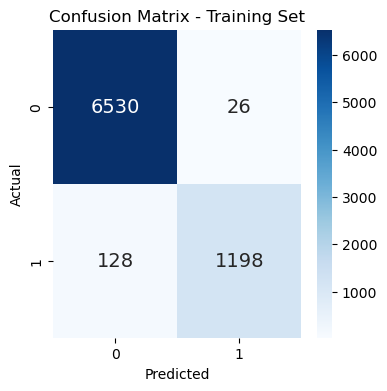

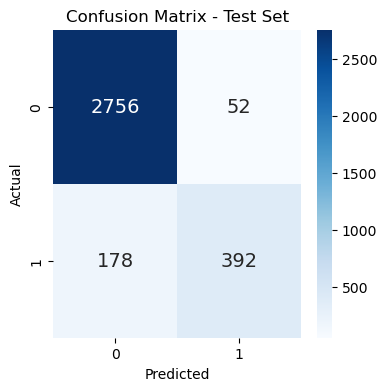

In [506]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix for training set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Training Set")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot confusion matrix for test set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


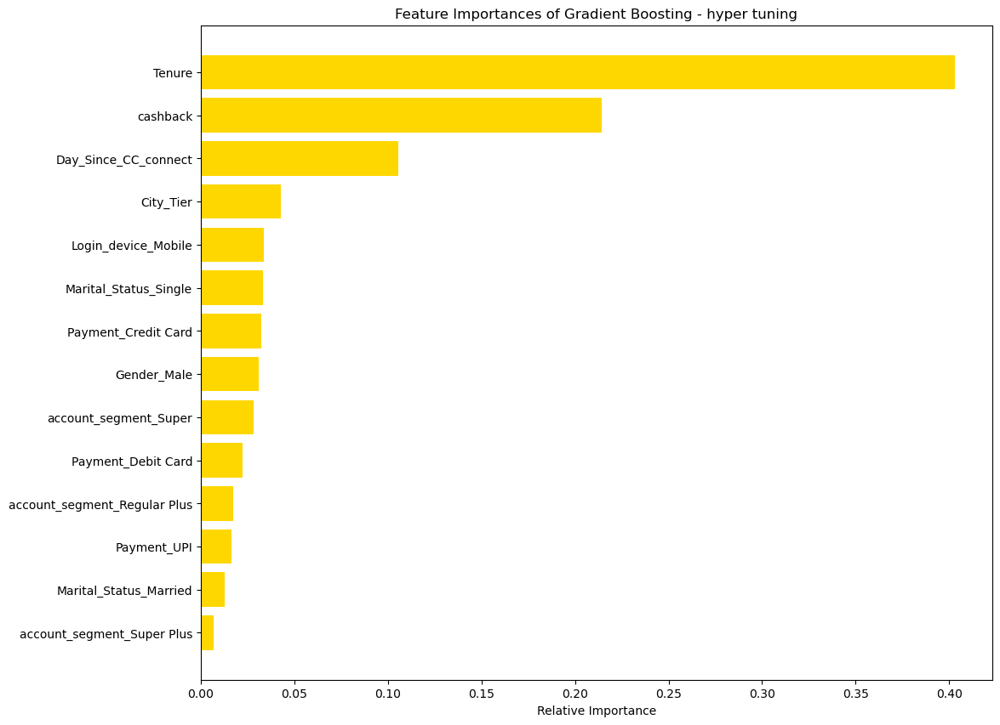

In [507]:
importances = GB_model1.feature_importances_
indices = np.argsort(importances)
feature_names = list(scaled_X.columns)

plt.figure(figsize=(12,10))
plt.title('Feature Importances of Gradient Boosting - hyper tuning')
plt.barh(range(len(indices)), importances[indices], color='gold', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

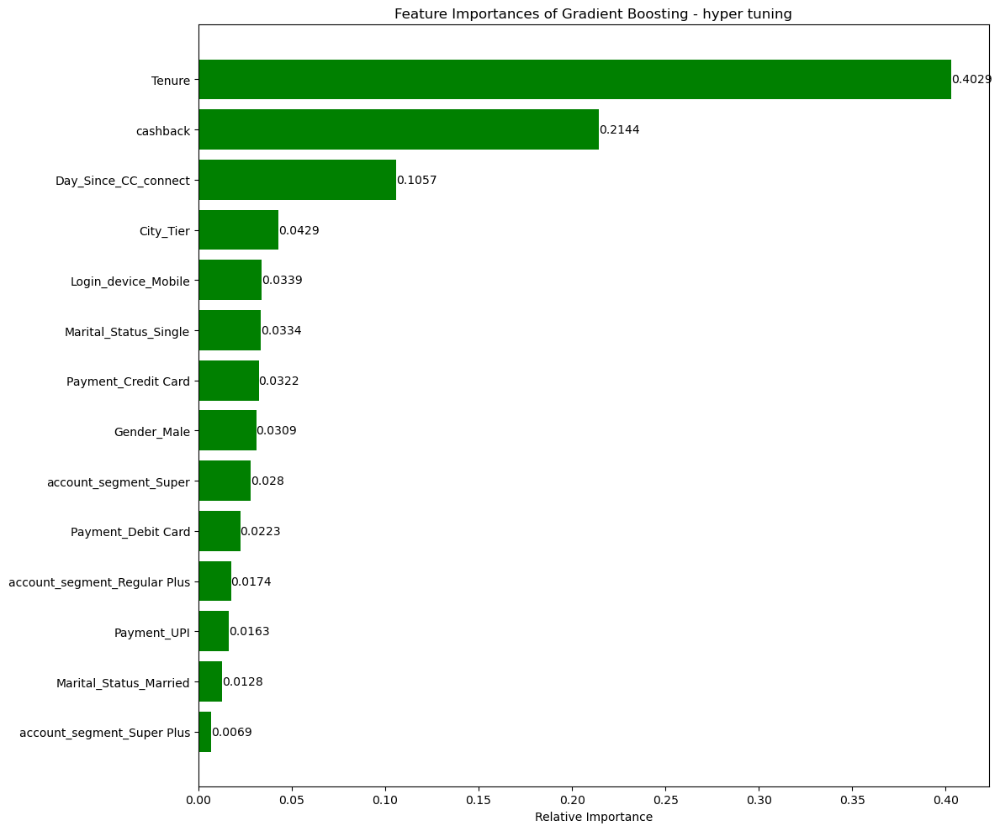

In [508]:
importances = GB_model1.feature_importances_
indices = np.argsort(importances)
feature_names = list(scaled_X.columns)

plt.figure(figsize=(12, 10))
plt.title('Feature Importances of Gradient Boosting - hyper tuning')
bars = plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, round(bar.get_width(), 4), va='center')

plt.tight_layout()
plt.show()

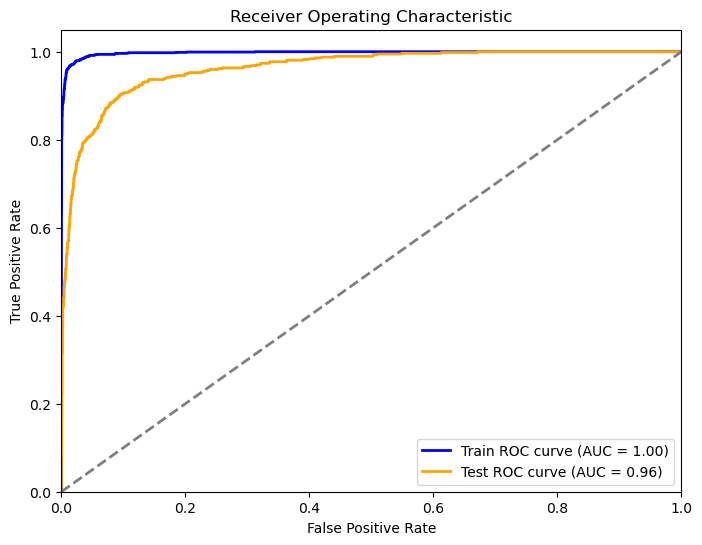

In [509]:
from sklearn.metrics import roc_curve, auc, roc_auc_score

# Predicted probabilities on the training set
y_train_prob = GB_model1.predict_proba(X_train)[:, 1]

# Predicted probabilities on the test set
y_test_prob = GB_model1.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC score for training set
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve and AUC score for test set
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Gradient Boosting SMOTE

In [511]:
GB_SM_model = GradientBoostingClassifier()


smote = SMOTE(random_state=1)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


GB_SM_model.fit(X_train_resampled, y_train_resampled)


GradientBoostingClassifier()

In [512]:
X_train_resampled.shape

(13112, 14)

In [513]:
y_train_pred = GB_SM_model.predict(X_train_resampled)
y_test_pred = GB_SM_model.predict(X_test)

In [514]:
print("Classification Report for Training Set:")
print(classification_report(y_train_resampled, y_train_pred))

print("Classification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86      6556
           1       0.86      0.86      0.86      6556

    accuracy                           0.86     13112
   macro avg       0.86      0.86      0.86     13112
weighted avg       0.86      0.86      0.86     13112

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.94      0.87      0.90      2808
           1       0.53      0.74      0.62       570

    accuracy                           0.85      3378
   macro avg       0.74      0.81      0.76      3378
weighted avg       0.87      0.85      0.86      3378



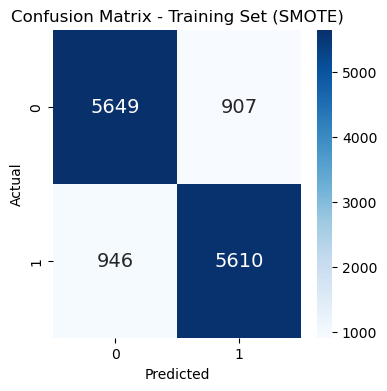

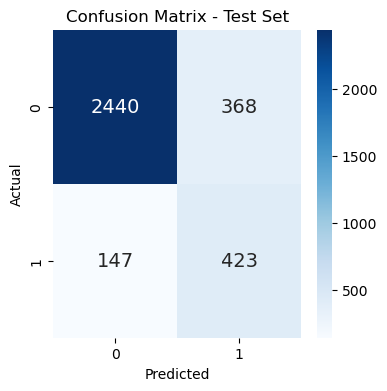

In [515]:
conf_matrix_train = confusion_matrix(y_train_resampled, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)


plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Training Set (SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

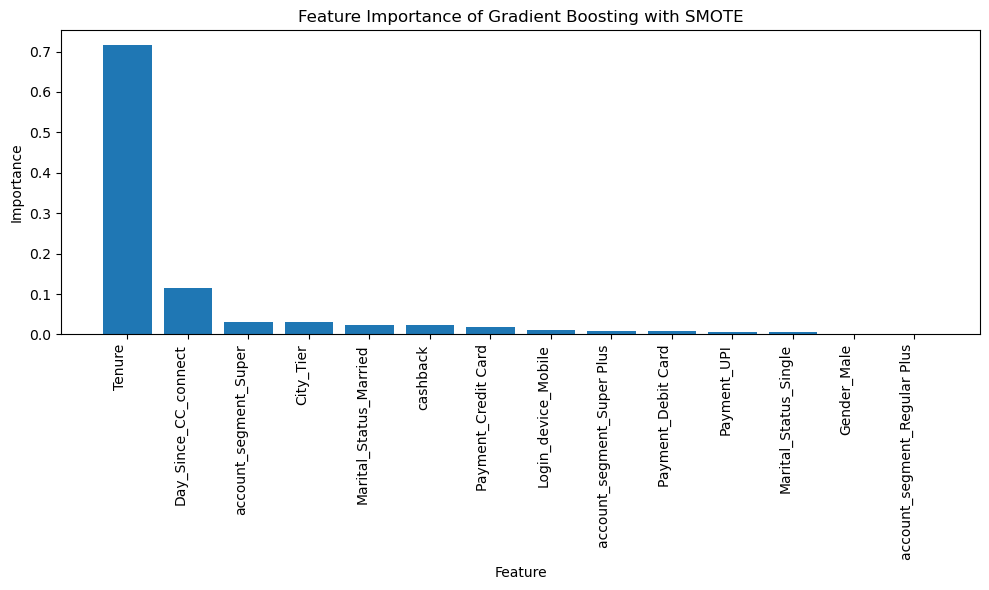

In [516]:
feature_importance = GB_SM_model.feature_importances_
feature_names = X_train.columns
sorted_idx = feature_importance.argsort()[::-1]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X_train.shape[1]), feature_importance[sorted_idx], align="center")
plt.xticks(range(X_train.shape[1]), np.array(feature_names)[sorted_idx], rotation=90, ha="right")
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature Importance of Gradient Boosting with SMOTE")
plt.tight_layout()
plt.show()

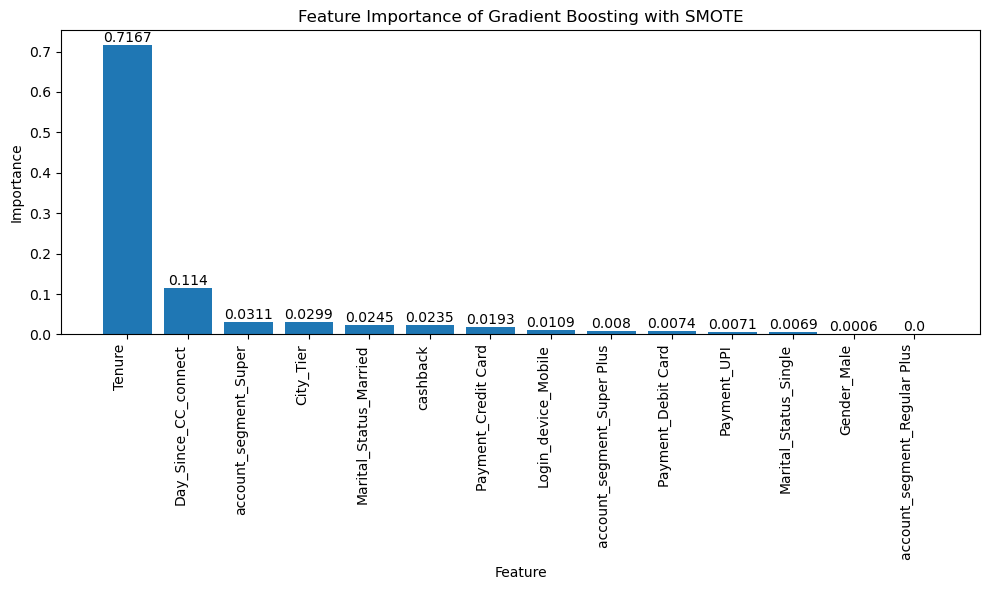

In [517]:
feature_importance = GB_SM_model.feature_importances_
feature_names = X_train.columns
sorted_idx = feature_importance.argsort()[::-1]

# Plot feature importances
plt.figure(figsize=(10, 6))
bars = plt.bar(range(X_train.shape[1]), feature_importance[sorted_idx], align="center")
plt.xticks(range(X_train.shape[1]), np.array(feature_names)[sorted_idx], rotation=90, ha="right")
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature Importance of Gradient Boosting with SMOTE")

for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(bar.get_height(), 4), ha='center', va='bottom')

plt.tight_layout()
plt.show()

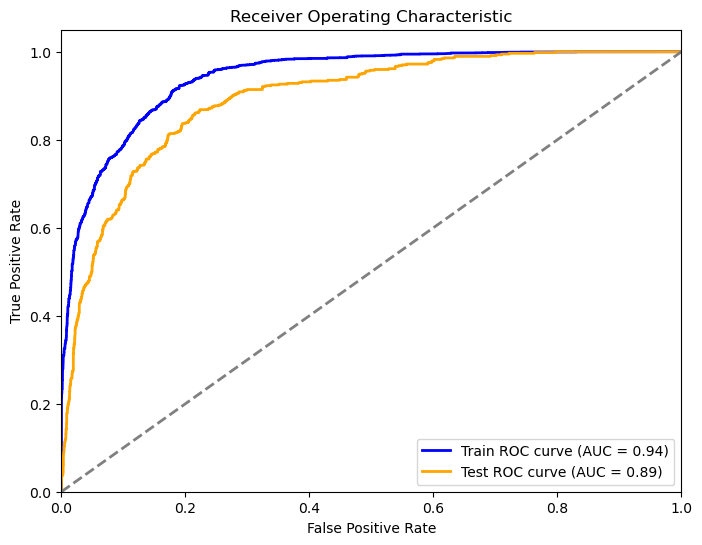

Train AUC Score: 0.9413367064099935
Test AUC Score: 0.8931411505972909


In [518]:
# Predicted probabilities on the training set
y_train_prob = GB_SM_model.predict_proba(X_train_resampled)[:, 1]

# Predicted probabilities on the test set
y_test_prob = GB_SM_model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC score for training set
fpr_train, tpr_train, _ = roc_curve(y_train_resampled, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve and AUC score for test set
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Print AUC scores
print("Train AUC Score:", roc_auc_train)
print("Test AUC Score:", roc_auc_test)

# SVM method

In [520]:
from sklearn.svm import SVC
svm_model = SVC(random_state=1)

In [521]:
svm_model.fit(X_train, y_train)

y_train_pred = svm_model.predict(X_train)
y_test_pred = svm_model.predict(X_test)

In [522]:
print("Classification Report for Training Set:")
print(classification_report(y_train, y_train_pred))

print("Classification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.89      0.98      0.94      6556
           1       0.82      0.42      0.55      1326

    accuracy                           0.89      7882
   macro avg       0.86      0.70      0.74      7882
weighted avg       0.88      0.89      0.87      7882

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2808
           1       0.80      0.37      0.50       570

    accuracy                           0.88      3378
   macro avg       0.84      0.67      0.72      3378
weighted avg       0.87      0.88      0.86      3378



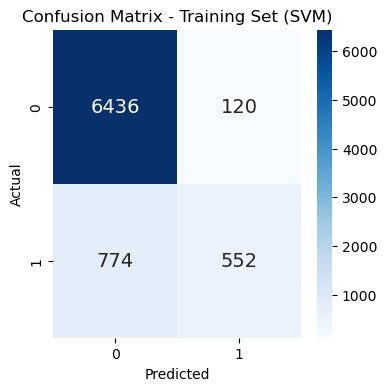

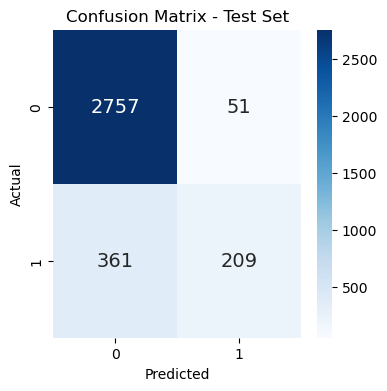

In [523]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix for training set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Training Set (SVM)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot confusion matrix for test set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

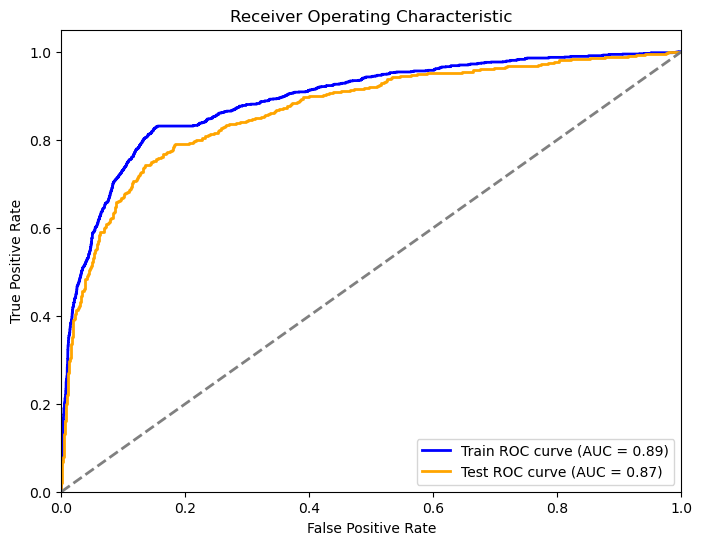

Train AUC Score: 0.8915646220472514
Test AUC Score: 0.8668416054380966


In [524]:
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_train_prob = svm_model.decision_function(X_train)
y_test_prob = svm_model.decision_function(X_test)

# Calculate ROC curve and AUC score for training set
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve and AUC score for test set
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Print AUC scores
print("Train AUC Score:", roc_auc_train)
print("Test AUC Score:", roc_auc_test)


# SVM Hyper tuned method

In [526]:
svm_model = SVC()

# Define the hyperparameter grid to search
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly'],
    'degree': [2, 3, 4],
    'gamma': ['scale', 'auto']
}

grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

best_svm_model = grid_search.best_estimator_

In [527]:
grid_search 

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'degree': [2, 3, 4],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly']},
             scoring='accuracy')

In [528]:
grid_search.best_estimator_

SVC(C=10, degree=4, kernel='poly')

In [529]:
grid_search.best_params_

{'C': 10, 'degree': 4, 'gamma': 'scale', 'kernel': 'poly'}

In [530]:
y_train_pred = best_svm_model.predict(X_train)

y_test_pred = best_svm_model.predict(X_test)

# Generate classification reports for both sets
print("Classification Report for Training Set:")
print(classification_report(y_train, y_train_pred))

print("Classification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      6556
           1       0.87      0.66      0.75      1326

    accuracy                           0.93      7882
   macro avg       0.90      0.82      0.85      7882
weighted avg       0.92      0.93      0.92      7882

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      2808
           1       0.80      0.57      0.67       570

    accuracy                           0.90      3378
   macro avg       0.86      0.77      0.81      3378
weighted avg       0.90      0.90      0.90      3378



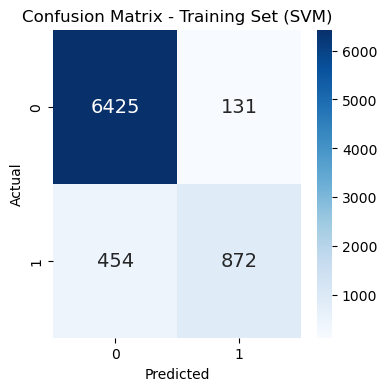

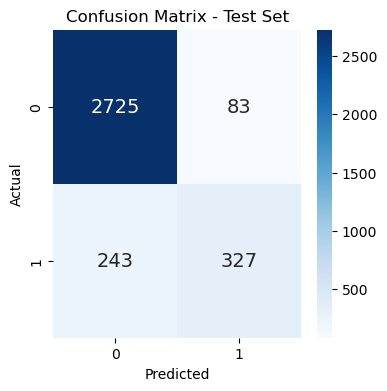

In [531]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix for training set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Training Set (SVM)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot confusion matrix for test set
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

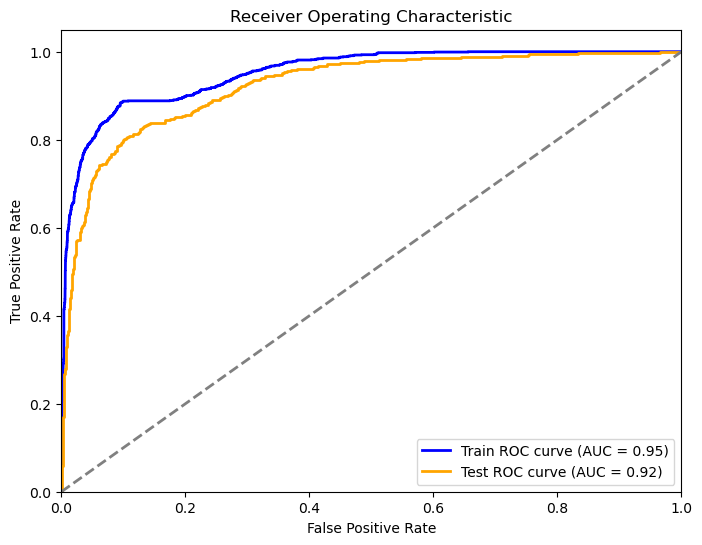

Train AUC Score: 0.9518324894607958
Test AUC Score: 0.9225046233818163


In [532]:
# Predicted probabilities on the training set
y_train_prob = best_svm_model.decision_function(X_train)

# Predicted probabilities on the test set
y_test_prob = best_svm_model.decision_function(X_test)

# Calculate ROC curve and AUC score for training set
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve and AUC score for test set
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Print AUC scores
print("Train AUC Score:", roc_auc_train)
print("Test AUC Score:", roc_auc_test)

# SVM SMOTE method

In [534]:
# Apply SMOTE to balance the training set
smote = SMOTE(random_state=1)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Instantiate the SVM model
svm_model = SVC()

# Train the SVM model on the resampled training set
svm_model.fit(X_train_resampled, y_train_resampled)

SVC()

In [535]:
# Predicted labels on the training set
y_train_pred = svm_model.predict(X_train_resampled)

# Predicted labels on the test set
y_test_pred = svm_model.predict(X_test)

In [536]:
print("Classification Report for Training Set:")
print(classification_report(y_train_resampled, y_train_pred))

# Generate classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.90      0.82      0.86      6556
           1       0.84      0.91      0.87      6556

    accuracy                           0.86     13112
   macro avg       0.87      0.86      0.86     13112
weighted avg       0.87      0.86      0.86     13112

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.96      0.83      0.89      2808
           1       0.50      0.84      0.63       570

    accuracy                           0.83      3378
   macro avg       0.73      0.83      0.76      3378
weighted avg       0.88      0.83      0.85      3378



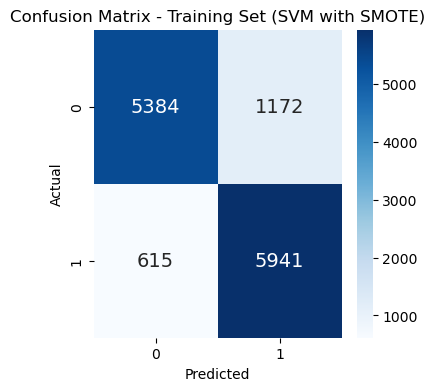

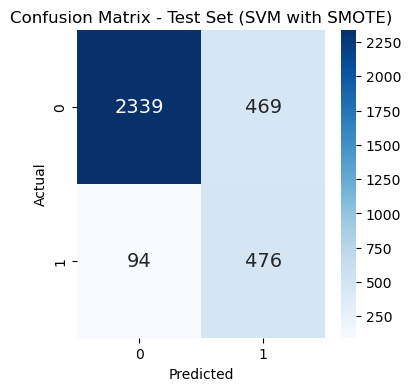

In [537]:
conf_matrix_train = confusion_matrix(y_train_resampled, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix for training set
plt.figure(figsize=(4,4))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Training Set (SVM with SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot confusion matrix for test set
plt.figure(figsize=(4,4))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14})
plt.title("Confusion Matrix - Test Set (SVM with SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

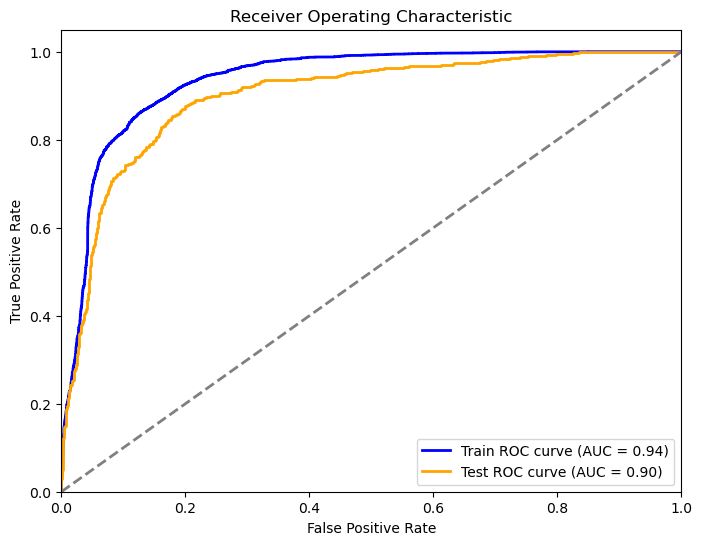

Train AUC Score: 0.9356361241824785
Test AUC Score: 0.8996563702704052


In [538]:
# Predicted probabilities on the training set
y_train_prob = svm_model.decision_function(X_train_resampled)

# Predicted probabilities on the test set
y_test_prob = svm_model.decision_function(X_test)

# Calculate ROC curve and AUC score for training set
fpr_train, tpr_train, _ = roc_curve(y_train_resampled, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Calculate ROC curve and AUC score for test set
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Train ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='Test ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Print AUC scores
print("Train AUC Score:", roc_auc_train)
print("Test AUC Score:", roc_auc_test)

In [539]:
# Bagging Model with SMOTE - Train Data
bagging_smote_train_data = {
    'Model': ['Bagging with SMOTE'],
    'Precision': [0.99],
    'Recall': [0.99],
    'F1-score': [0.99],
    'Accuracy': [1.00],
    'AUC Score': [0.99]
}
df_bagging_smote_train = pd.DataFrame(bagging_smote_train_data)

# Bagging Model with SMOTE - Test Data
bagging_smote_test_data = {
    'Model': ['Bagging with SMOTE'],
    'Precision': [0.84],
    'Recall': [0.81],
    'F1-score': [0.82],
    'Accuracy': [0.94],
    'AUC Score': [0.89]
}
df_bagging_smote_test = pd.DataFrame(bagging_smote_test_data)

# KNN Model with Hyper Tuning - Train Data
knn_hyper_train_data = {
    'Model': ['KNN with Hyper Tuning'],
    'Precision': [1.00],
    'Recall': [1.00],
    'F1-score': [1.00],
    'Accuracy': [1.00],
    'AUC Score': [1.00]
}
df_knn_hyper_train = pd.DataFrame(knn_hyper_train_data)

# KNN Model with Hyper Tuning - Test Data
knn_hyper_test_data = {
    'Model': ['KNN with Hyper Tuning'],
    'Precision': [0.92],
    'Recall': [0.82],
    'F1-score': [0.87],
    'Accuracy': [0.96],
    'AUC Score': [0.96]
}
df_knn_hyper_test = pd.DataFrame(knn_hyper_test_data)

# Random Forest Model with SMOTE - Train Data
random_forest_smote_train_data = {
    'Model': ['Random Forest with SMOTE'],
    'Precision': [1.00],
    'Recall': [1.00],
    'F1-score': [1.00],
    'Accuracy': [1.00],
    'AUC Score': [1.00]
}
df_random_forest_smote_train = pd.DataFrame(random_forest_smote_train_data)

# Random Forest Model with SMOTE - Test Data
random_forest_smote_test_data = {
    'Model': ['Random Forest with SMOTE'],
    'Precision': [0.90],
    'Recall': [0.85],
    'F1-score': [0.88],
    'Accuracy': [0.96],
    'AUC Score': [1.00]
}
df_random_forest_smote_test = pd.DataFrame(random_forest_smote_test_data)

# Concatenate the dataframes
df_train = pd.concat([df_bagging_smote_train, df_knn_hyper_train, df_random_forest_smote_train], ignore_index=True)
df_test = pd.concat([df_bagging_smote_test, df_knn_hyper_test, df_random_forest_smote_test], ignore_index=True)

# Display the dataframes
print("Train Data Metrics:")
print(df_train)
print("\nTest Data Metrics:")
print(df_test)

Train Data Metrics:
                      Model  Precision  Recall  F1-score  Accuracy  AUC Score
0        Bagging with SMOTE       0.99    0.99      0.99       1.0       0.99
1     KNN with Hyper Tuning       1.00    1.00      1.00       1.0       1.00
2  Random Forest with SMOTE       1.00    1.00      1.00       1.0       1.00

Test Data Metrics:
                      Model  Precision  Recall  F1-score  Accuracy  AUC Score
0        Bagging with SMOTE       0.84    0.81      0.82      0.94       0.89
1     KNN with Hyper Tuning       0.92    0.82      0.87      0.96       0.96
2  Random Forest with SMOTE       0.90    0.85      0.88      0.96       1.00


### GO check out the Business Report to see which model was selected and why with conclusion and Business Recommendations

# END OF PROJECT NOTE-2